In [1]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.signal import find_peaks, peak_widths
# from scipy.optimize import curve_fit
# from lmfit.models import VoigtModel
# from scipy.signal import savgol_filter
# from scipy.interpolate import interp1d
# from astropy.modeling.models import Gaussian1D, Polynomial1D
# from astropy.modeling.fitting import LevMarLSQFitter
# from lmfit.models import SkewedGaussianModel, PolynomialModel, SplitLorentzianModel
# from lmfit.models import VoigtModel, DoniachModel, SplineModel, GaussianModel, LognormalModel
# from lmfit.models import MoffatModel, LorentzianModel

# from pandora.calibration.hg2_lamp import hg2_lines
# from pandora.calibration.monochromator_calib import monoLineFinder

# class Hg2LampLineCharacterization:
#     """
#     Hg2LampLineCharacterization characterizes the lines of a Hg2 lamp spectrum.

#     Parameters
#     ----------
#     name : str
#         Name of the Hg2 lamp line (eg. "Ar07").
#     exptime: int
#         Exposure time in miliseconds to load the spectrum.
#     peak : int
#         peak of the line in pixels.
#     window : int
#         window around the peak in pixels.
    
#     """
#     def __init__(self, name, peak, exptime=10, window=10):
#         self.name = name
#         self.exptime = int(exptime)
#         self.peak = peak
#         self.window = window

#         self.centers = dict()
#         self.errors = dict()
#         self.rsquared = dict()
#         self.wavelength = hg2_lines[name]

#         # Load spectrum
#         self.root = '/Users/esteves/Downloads/spectrometer_local/exptime/'
#         self.timestamp = '20250311T153442'
#         self.load_spectrum()

#         # Crop spectrum
#         self.crop_spectrum()

#     def load_spectrum(self):
#         fname = f"{self.root}/{self.timestamp}_{self.exptime}ms.txt"
#         data = np.genfromtxt(fname)
#         self.wav_all = data[:,0]
#         self.pixel_all = np.arange(len(self.wav_all),dtype=int)
#         self.counts_all = data[:,1]

#         # load dark
#         darkfname = '/Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_dark.txt'
#         dd = np.genfromtxt(darkfname)
#         wav0, dark0 = dd[:,0], dd[:,1]
#         self.counts_all = self.counts_all - np.interp(self.wav_all, wav0, dark0)
#         pass

#     def crop_spectrum(self):
#         self.ilow = int(max(self.peak - self.window, 0))
#         self.ihigh = int(min(self.peak + self.window, len(self.wav_all)))

#         self.wav = self.wav_all[self.ilow:self.ihigh]
#         self.pixel = self.pixel_all[self.ilow:self.ihigh]
#         self.counts = self.counts_all[self.ilow:self.ihigh]
#         pass

#     def line_finder(self):
#         mono_finder = monoLineFinder(self.pixel, self.counts, height=2000, distance=20)
#         mono_finder.find_line(order=3)
#         return mono_finder

#     def measure_centroids(self, length=9, polyorder=2):
#         mono_finder = self.line_finder()
#         centers, errors = mono_finder.measure_centroids()
        
#         # add the peak_fwhm
#         self.peak_fwhm = mono_finder.dp
#         self.peak_height = mono_finder.peak_intensities

#         # add peak instead of gaussian fit
#         centers[-1] = mono_finder.peak_x_positions
#         errors[-1] = 1.0

#         # Measure the centroid using a Savitzky-Golay filter
#         c, e = self.measure_savgol_centroids(length=length, polyorder=polyorder)
#         centers.append(c)
#         errors.append(e)

#         # add the rsquared
#         rsqr = [np.nan]*len(centers)
        
#         # add to center and errors to the dictionary
#         self.centers = dict(zip(['parabola_vertex', 'moment_center', 'peak','savgolFilter'], centers))
#         self.errors = dict(zip(['parabola_vertex', 'moment_center', 'peak', 'savgolFilter'], errors))
#         self.rsquared = dict(zip(['parabola_vertex', 'moment_center', 'peak','savgolFilter'], rsqr))
    
#     def measure_savgol_centroids(self, length=7, polyorder=2):
#         """
#         Measure the centroids (first moment) of the smoothed line 
#         using a Savitzky-Golay filter.

#         Parameters
#         ----------
#         length : int
#             The length of the filter window (i.e., the number of coefficients).
#         polyorder : int
#             The order of the polynomial used to fit the samples.
        
#         Returns
#         -------
#         moment_center : float
#             The centroid (first moment) of the smoothed line.
#         moment_unc : float
#             The uncertainty of the centroid
        
#         """
#         # apply the savgol filter
#         y_smooth = savgol_filter(self.counts, length, polyorder)
        
#         # make a fine grid for the interpolation (40 times the original pixel size, ~0.01nm)
#         self.x_fine = np.linspace(self.pixel.min(), self.pixel.max(), 40*self.pixel.size) 
#         f_interp = interp1d(self.pixel, y_smooth, kind='cubic')

#         # interpolate the smoothed data
#         self.y_fine = f_interp(self.x_fine)

#         # get the peak of the smoothed data
#         main_peak_idx = np.argmax(self.y_fine)

#         # approximate number of points around peak
#         # 2 FWHM points on each side
#         half_width = 2*self.peak_fwhm*40  
#         i_low = max(0, main_peak_idx - half_width)
#         i_high = min(len(self.x_fine), main_peak_idx + half_width)
#         x_mom = self.x_fine[i_low:i_high]
#         y_mom = self.y_fine[i_low:i_high]

#         total_flux = np.sum(y_mom)  # total flux
#         moment_center = np.sum(x_mom * y_mom) / total_flux
#         variance = np.sum(y_mom * (x_mom - moment_center) ** 2) / total_flux
#         moment_unc = np.sqrt(variance / len(x_mom))
#         return moment_center, moment_unc

#     def fit_gauss_continuum(self, poly_degree=1, poly_init_vals=None):
#         """
#         Fit one Gaussian line + a polynomial continuum to (x, y) data using Astropy.
#         Applies parameter bounds and attempts to retrieve uncertainties.
    
#         Parameters
#         ----------
#         poly_degree : int, optional
#             Degree of the polynomial continuum. Default is 1 (linear).
#         poly_init_vals : list, optional
#             Initial values for the polynomial coefficients [c0, c1, ...].
#             If None, will default to zeros (except c0 might be near y[0]).
#         """
    
#         # Data
#         x = self.pixel
#         y = self.counts
    
#         # Initial Gaussian guesses
#         amp1 = self.peak_height
#         mean1 = self.centers['peak']
#         stddev1 = self.peak_fwhm / 2.355  # FWHM -> sigma
    
#         # Define the Gaussian model
#         g1 = Gaussian1D(amplitude=amp1, mean=mean1, stddev=stddev1)
    
#         # ---- (1) Set Parameter Bounds ----
#         # Lower & upper bounds for amplitude, mean, and stddev as an example
#         # (Adjust as appropriate for your system)
#         g1.amplitude.bounds = (100, 65e3)         # amplitude >= 0
#         g1.mean.bounds = (x.min(), x.max())     # mean in the data range
#         g1.stddev.bounds = (1., 15.)         # nonzero stddev
    
#         # Define the polynomial (continuum) model
#         if poly_init_vals is None:
#             # If linear, e.g., [y[0], 0.0]
#             if poly_degree == 1:
#                 c0_guess = float(y[0])
#                 c1_guess = 0.0
#                 poly_init_vals = [c0_guess, c1_guess]
#             else:
#                 poly_init_vals = [0.0]*(poly_degree+1)
    
#         poly_cont = Polynomial1D(degree=poly_degree)
#         for i, val in enumerate(poly_init_vals):
#             setattr(poly_cont, f'c{i}', val)
#             # Optional: set polynomial bounds if needed:
#             # poly_cont.c0.bounds = (0, None)  etc.
    
#         # Combine Gaussian + polynomial
#         model_init = g1 + poly_cont
    
#         # ---- (2) Fit the data ----
#         fitter = LevMarLSQFitter()
#         best_fit = fitter(model_init, x, y, maxiter=1000)  # maxiter for safety    
#         self.normal = best_fit  # store
        
#         # Attempt to read parameter uncertainties
#         # For a compound model, best_fit[0] corresponds to g1, best_fit[1] to poly.
#         mean_val = best_fit[0].mean.value
#         mean_err = get_params_uncertainty(fitter, best_fit, param_name='mean_0')

#         # Keep the continuum parameters for later use
#         self.continumm = [best_fit.c0_1.value, best_fit.c1_1.value]
        
#         # # Plot for debugging
#         # x_fine = np.linspace(x.min(), x.max(), 500)
#         # y_fine = best_fit(x_fine)
    
#         # plt.figure(figsize=(8,5))
#         # plt.plot(x, y, 'bo', label='Data')
#         # plt.plot(x_fine, y_fine, 'r-', label='Best Fit')
#         # plt.title('Gaussian + Continuum Fit (Astropy)')
#         # plt.xlabel('Pixel')
#         # plt.ylabel('Counts')
#         # plt.legend()
#         # plt.show()
    
#         # Return relevant param, param uncertainty
#         return mean_val, mean_err


#     def get_bkg_model(self, model1, params, nsigma=3, nknots=4):
#         m1 = self.centers['peak']
#         sigma = self.peak_fwhm / 2.355
#         x, y = self.pixel, self.counts

#         # Get the knots
#         left = np.linspace(x.min(), m1 - nsigma * sigma, nknots)
#         right = np.linspace(m1 + nsigma * sigma, x.max(), nknots)
#         knot_xvals = np.append(left, right)
        
#         # Create Spline Model
#         bkg = SplineModel(prefix='bkg_', xknots=knot_xvals, polyorder=3)

#         # Define the full model (Model + Spline)
#         model = model1 + bkg
        
#         # Ensure background parameters are added
#         params.update(bkg.guess(y, x))  # This correctly initializes the spline
        
#         # Constrain the background model
#         # Bakcground is always additive
#         for name in params.keys():
#             if "bkg_s" in name:
#                 i = int(name[-1])
#                 params[name].max = 1.1*np.interp(knot_xvals[i], x, y)
#                 params[name].min = 0.

#         self.knot_xvals = knot_xvals
        
#         return model, bkg, params

#     def split_lorentzian_fit(self, nsigma=3, nknots=4):
#         return self.fit_lmlfit_model(SplitLorentzianModel, nsigma=nsigma, nknots=nknots)

#     def lorentzian_fit(self, nsigma=3, nknots=4):
#         return self.fit_lmlfit_model(LorentzianModel, nsigma=nsigma, nknots=nknots)
    
#     def skewed_gaussian_fit(self, nsigma=3, nknots=4):
#         return self.fit_lmlfit_model(SkewedGaussianModel, nsigma=nsigma, nknots=nknots)

#     def gaussian_fit(self, nsigma=3, nknots=4):
#         return self.fit_lmlfit_model(GaussianModel, nsigma=nsigma, nknots=nknots)

#     def voigt_fit(self, nsigma=3, nknots=4):
#         return self.fit_lmlfit_model(VoigtModel, nsigma=nsigma, nknots=nknots)

#     def fit_lmlfit_model(self, funcmodel, nsigma=3, nknots=4):
#         """
#         Fit one Lorentzian peak + a polynomial continuum to (x, y) data using lmfit and plot the result.

#         """
#         # take initial values
#         p1 = self.peak_height
#         m1 = self.centers['peak']
#         fwhm1 = self.peak_fwhm / 2.355
#         x = self.pixel
#         y = self.counts
        
#         # Define the model
#         peak_model = funcmodel(prefix='peak_')

#         # Set initial parameter values
#         params = peak_model.make_params(
#             peak_amplitude=p1, peak_center=m1, peak_sigma=fwhm1
#         )
#         params.update(peak_model.guess(y, x))
        
#         # Set the background with constraints
#         model, bkg, params = self.get_bkg_model(peak_model, params, nsigma, nknots)
        
#         # Make sure the Gaussian parameters are within reasonable bounds
#         params['peak_center'].min = x.min()
#         params['peak_center'].max = x.max()
#         params['peak_amplitude'].min = 0

#         # Fit the composite model to the data
#         result = model.fit(y, params, x=x)

#         # get the center and uncertainty
#         mean = result.params['peak_center'].value
#         mean_unc = result.params['peak_center'].stderr
#         if mean_unc is None:
#             print("Covariance matrix not computed. Re-running fit...")
            
#             # Retrieve best-fit parameters
#             params = result.params.copy()

#             # Ensure all parameters are set to `vary=True` for refitting
#             # for par_name in params:
#             #     params[par_name].vary = True  # Allow all parameters to be adjusted

#             # Re-run the fit, explicitly asking to compute covariance
#             result = model.fit(y, params, x=x, calc_covar=True)

#             # Re-check uncertainty
#             mean_unc = result.params['peak_center'].stderr
#             mean = result.params['peak_center'].value

#         # Store the best-fit model and its parameters
#         model_name = funcmodel.__name__.lower()
#         setattr(self, model_name, result)

#         return mean, mean_unc

#     def fit_models(self, nsigma=3, nknots=4):
#         functions = ['lorentzian_fit', 'skewed_gaussian_fit', 'gaussian_fit', 'voigt_fit', 'split_lorentzian_fit']
#         methods = ['lorentzianModel','skewedGaussianModel','gaussianModel','voigtModel', 'SplitLorentzianModel']
#         for fun, method in zip(functions, methods):
#             c, e = getattr(self, fun)(nsigma=nsigma, nknots=nknots)
#             self.centers[method] = c
#             self.errors[method] = e
#             self.rsquared[method] = getattr(self, method.lower()).rsquared
#         pass

#     def plot_raw_line(self, fig=None):
#         """
#         Plot the raw line data with the identified peak position.
#         """
#         if fig is None:
#             fig, ax = plt.subplots(figsize=(6,4))
#         else:
#             ax = fig.gca()
#         ax.set_title(self.name+" Line - Raw Data \n"+r"$\lambda$ = %.2f nm"%self.wavelength)
#         ax.plot(self.pixel, self.counts, 'k', label='%s Data'%self.name)
#         ax.plot(self.pixel, self.counts, 'ko')
#         ax.axvline(self.peak, color='r', ls='--', label='Peak')
#         ax.set_xlabel("Pixels")
#         ax.set_ylabel("Counts [ADU]")
#         ax.legend()
#         return fig

#     def plot_zoom_out(self, fig=None, ntimes=3):
#         """
#         Plot the raw line data with the identified peak position.
#         """
#         if fig is None:
#             fig, ax = plt.subplots(figsize=(6,4))
#         else:
#             ax = fig.gca()
#         # take data within 30 nm of the peak
#         ilow = int(max(self.peak - ntimes*self.window, 0))
#         ihigh = int(min(self.peak + ntimes*self.window, len(self.wav_all)))

#         wav = self.wav_all[ilow:ihigh]
#         pixel = self.pixel_all[ilow:ihigh]
#         counts = self.counts_all[ilow:ihigh]

#         ax.set_title(self.name+" Line - Zoom out \n"+r"$\lambda$ = %.2f nm"%self.wavelength)
#         ax.plot(wav, counts, 'k', label='%s Data'%self.name)
#         ax.plot(wav, counts, 'ko')
#         ax.axvline(self.wavelength, color='r', ls='--', label='Hg2 Line Center')
#         ax.set_xlabel("wav [nm]")
#         ax.set_ylabel("Counts [ADU]")
#         ax.legend()
#         return fig
        
    
#     def plot_model_fit(self, method='gaussianModel', fig=None, ax=None):
#         """
#         Plot the raw line data with the identified peak position.
#         """
#         if fig is None:
#             fig, ax = plt.subplots(figsize=(8,7))
            
#         # plot data
#         ax.scatter(self.pixel, self.counts, color='k', lw=2, label="Line " + self.name+" Spectrum")
#         ax.plot(self.pixel, self.counts, color='k', lw=1)

#         # plot best fit
#         method_name = method.lower()
#         out = getattr(self, method_name)
#         rsqr = self.rsquared[method]
#         comps = out.eval_components()

#         ax.plot(self.pixel, out.best_fit, label=method + ' best fit\n'+f'Rsqr: {rsqr:0.5f}', color='r', lw=2)
#         ax.plot(self.pixel, comps['peak_'], color='m', ls='--', label='line')
#         ax.plot(self.pixel, comps['bkg_'], color='g', ls='--', label='continuum')
#         ax.plot(self.knot_xvals, np.interp(self.knot_xvals, self.pixel, comps['bkg_']), 'gx', label='knots')
#         ax.legend(fontsize=12)

#         ax.set_xlabel("Pixels")
#         ax.set_ylabel("Counts [ADU]")
#         ax.legend()
#         # fig.tight_layout()
#         return fig
    
#     def compare_models(self):
#         fig, axs = plt.subplots(2, 2, figsize=(16,14), sharey='col')
#         methods = ['lorentzianModel','skewedGaussianModel','gaussianModel','voigtModel']
#         for ax, method in zip(axs.ravel(), methods):
#             self.plot_model_fit(method=method, fig=fig, ax=ax)
#         fig.tight_layout()
#         return fig
        
#     def plot_line_centers(self, window=5):
#         fig, ax = plt.subplots(figsize=(8,7))
#         ax.set_title("Line Centers " +self.name+ "\n"+r"$\lambda$ = %.2f nm"%self.wavelength)
#         # I need to map 8 centers values with colors
#         colors = ['r','g','b','m','c','y','k','orange','firebrick']
#         for i, key in enumerate(self.centers.keys()):
#             #lines with the center and error
#             ax.errorbar(self.centers[key], self.peak_height*(1+2*i/100), xerr=self.errors[key], fmt='o', color=colors[i], label=key)
#             # ax.errorbar(self.centers[key], yerr=self.errors[key], fmt='o', color=colors[i], label=key)

#         il, ih = int(self.peak-window)-1, int(self.peak+window)+1
#         ax.plot(self.pixel_all[il:ih], self.counts_all[il:ih], color='grey', marker='o')
#         ax.plot(self.pixel_all[il:ih], self.counts_all[il:ih], color='grey')
#         #ax.errorbar(self.centers.keys(), self.centers.values(), yerr=self.errors.values(), fmt='o')
#         ax.set_xlim(self.peak-window, self.peak+window)
#         ax.set_ylabel("Counts [ADU]")
#         ax.set_xlabel("Pixel")
#         ax.legend(fontsize=11, loc=3)
#         return fig

#     # save, center, erorrs, rsquared in a dataframe
#     # rows are the different keys from the dict
#     def save_results(self):
#         df = pd.DataFrame()
#         for key in self.centers.keys():
#             df = pd.concat([df, pd.DataFrame({'center':self.centers[key], 'error':self.errors[key], 'rsquared':self.rsquared[key]}, index=[key])], axis=0)
#         fname = f"./results/{self.timestamp}_{self.name}.csv"
#         print(f"Saving results to {fname}")
#         df.to_csv(fname)
#         return df
# def get_params_uncertainty(fitter, best_fit, param_name='mean_0'):
#     cov_matrix = fitter.fit_info['param_cov']
#     param_names = best_fit.param_names  # e.g. ['amplitude_0', 'mean_0', 'stddev_0', ...]
#     idx = param_names.index(param_name)
#     error = np.sqrt(cov_matrix[idx, idx])
#     return error


In [2]:
from pandora.calibration.monochromator_calib import Hg2LampLineCharacterization

In [3]:
name = 'Ar10'
peak =1230.0
exptime = 12
ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)

Dark subtraction
Flat fielding


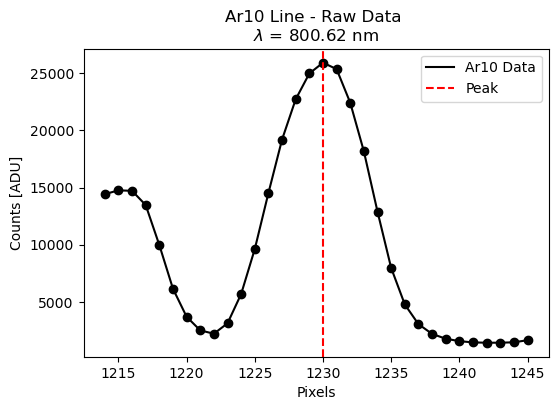

In [4]:
fig = ar01.plot_raw_line()

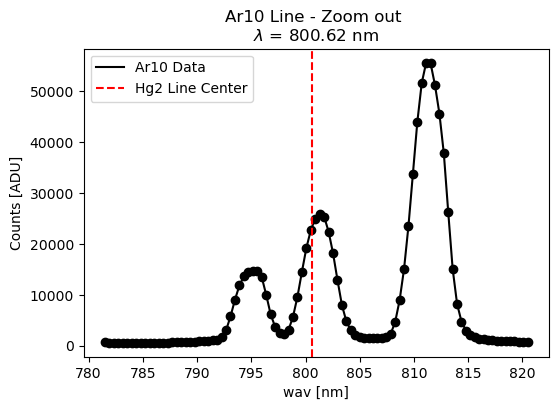

In [5]:
fig = ar01.plot_zoom_out()

In [6]:
ar01.measure_centroids()

In [7]:
ar01.fit_models(nsigma=3.0, nknots=8)

/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


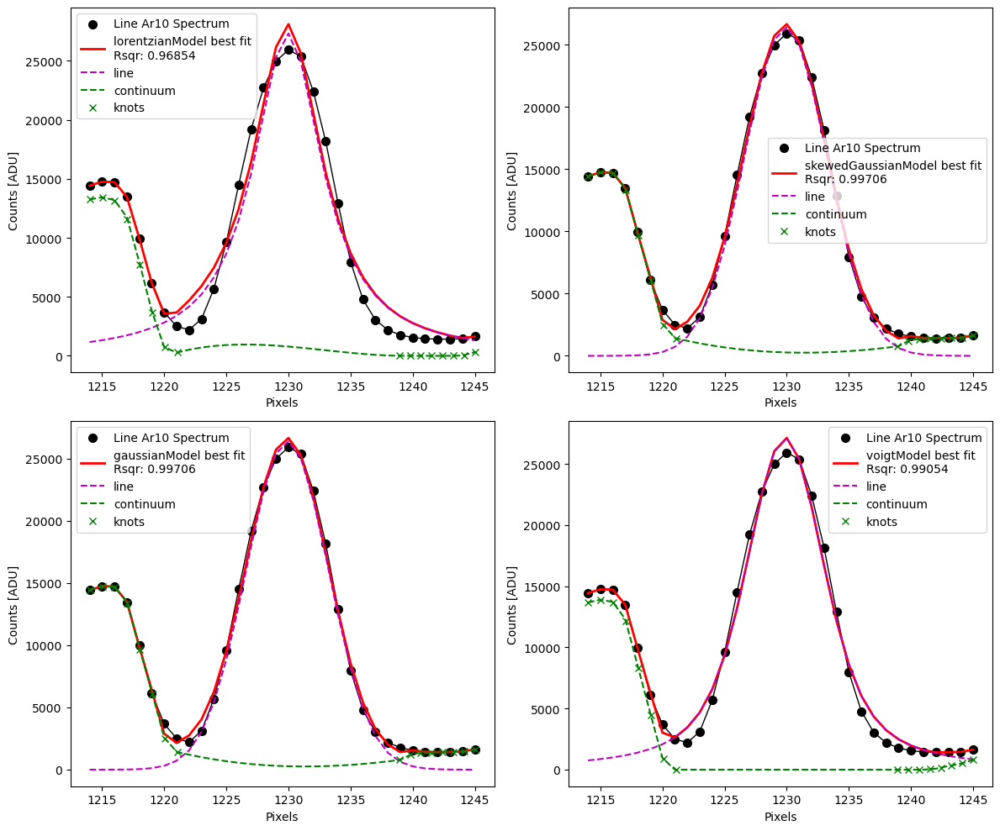

In [8]:
fig = ar01.compare_models()

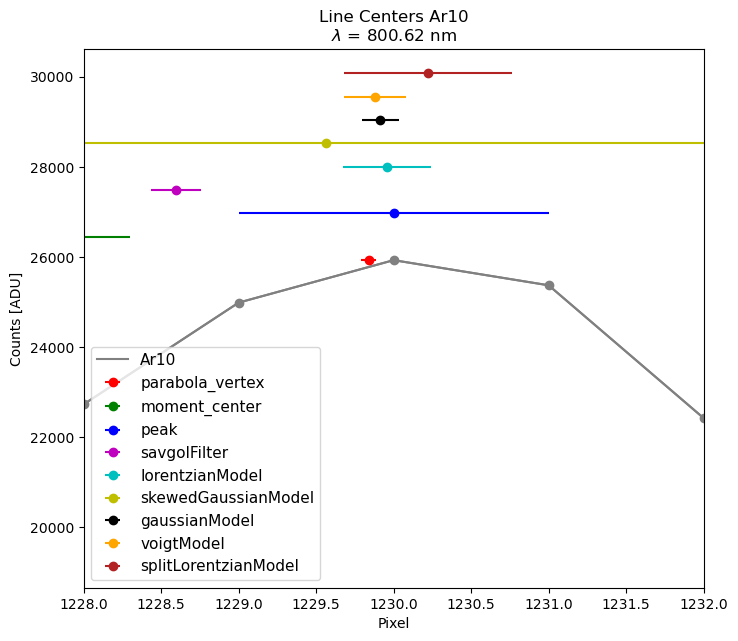

In [9]:
fig = ar01.plot_line_centers(window=2)

In [10]:
ar01.save_results()

Saving results to .//results/Ar10.csv


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar10    800.616      12  25928.954897  7.823318   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1229.838155  0.046129      NaN   1227.174484  ...            0.997056   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1229.912858  0.119916  0.997057  1229.880225  0.200958  0.990537   

  splitLorentzianModel                      
                center     error  rsquared  
0          1230.221127  0.544028  0.966819  

[1 rows x 33 columns]

In [11]:
# gc, gcerr = ar01.fit_gauss_continuum()
# gc, gcerr

In [12]:
import pandas as pd
timestamp = '20250311T153442'
linesDf = pd.read_csv(f'./results/{timestamp}_min_peak.csv', index_col=0)
linesDf

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
0,2,253.652000,69.0,43821.0,5.0,69.520778,74.295479,72.319902,1.0,0.206758,0.921681,1.594193,1.993852e+06,/Users/esteves/Downloads/spectrometer_local/ex...,-43751.479222,Hg01
1,9,296.728400,152.0,5243.0,6.0,151.564885,151.466592,151.443787,1.0,0.059812,0.098497,0.548190,3.482415e+04,/Users/esteves/Downloads/spectrometer_local/ex...,-5091.435115,Hg02
2,2,313.155500,183.0,8882.0,7.0,182.406900,182.710580,182.729205,1.0,0.021421,0.086363,0.573098,1.019416e+05,/Users/esteves/Downloads/spectrometer_local/ex...,-8699.593100,Hg04
3,47,334.148200,224.0,4740.0,7.0,223.254510,223.617687,223.677002,1.0,0.097336,0.124304,0.542826,1.891171e+04,/Users/esteves/Downloads/spectrometer_local/ex...,-4516.745490,Hg05
4,2,365.015200,284.0,7447.0,7.0,283.855140,283.803590,283.839824,1.0,0.089157,0.084401,0.598051,1.713602e+05,/Users/esteves/Downloads/spectrometer_local/ex...,-7163.144860,Hg06
5,2,404.656500,363.0,6226.0,7.0,361.743664,361.699915,361.731302,1.0,0.125276,0.127472,0.574178,1.721413e+05,/Users/esteves/Downloads/spectrometer_local/ex...,-5864.256336,Hg07
6,2,435.834300,424.0,11111.0,7.0,424.247221,424.027532,424.055078,1.0,0.135521,0.131775,0.531688,8.864079e+05,/Users/esteves/Downloads/spectrometer_local/ex...,-10686.752779,Hg08
7,2,546.073500,651.0,12041.0,6.0,650.474205,650.272826,650.279613,1.0,0.086412,0.111897,0.508903,8.330244e+05,/Users/esteves/Downloads/spectrometer_local/ex...,-11390.525795,Hg09
8,2,576.959800,718.0,5379.0,8.0,718.092200,718.129494,718.123389,1.0,0.223915,0.122140,0.690952,3.612033e+04,/Users/esteves/Downloads/spectrometer_local/ex...,-4660.907800,Hg10
9,22,727.293600,1054.0,5177.0,7.0,1054.103395,1054.245722,1054.393441,1.0,0.069337,0.064797,0.559972,1.808678e+04,/Users/esteves/Downloads/spectrometer_local/ex...,-4122.896605,Ar04


Dark subtraction
Flat fielding
Saving results to .//results/Ar10.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar10    800.616      12  25928.954897  7.823318   
1  20250311T153442  Ar10    800.616      12  25928.954897  7.823318   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1229.838155  0.046129      NaN   1227.174484  ...            0.997056   
1     1229.838155  0.046129      NaN   1227.174484  ...            0.997056   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1229.912858  0.119916  0.997057  1229.880225  0.200958  0.990537   
1   1229.912858  0.119916  0.997057  1229.880225  0.200958  0.990537   

  splitLorentzianModel                      
                center     error  rsquared  
0          1230.221127  0.544028  0.966819  
1          1230.221127  0.544028  0.966819  

[2 rows x 33 columns]

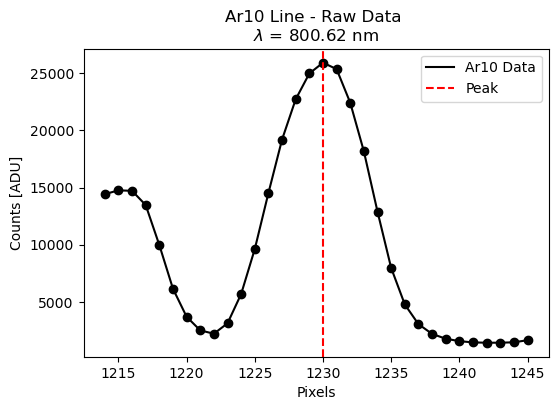

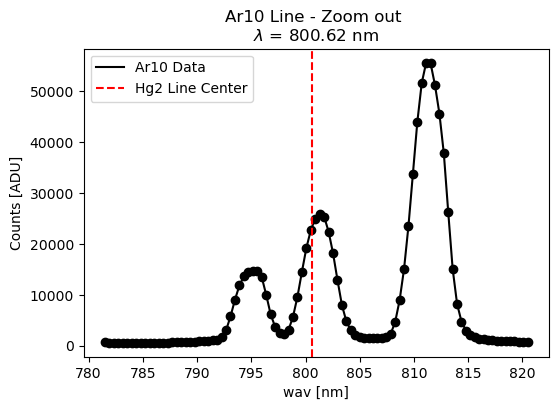

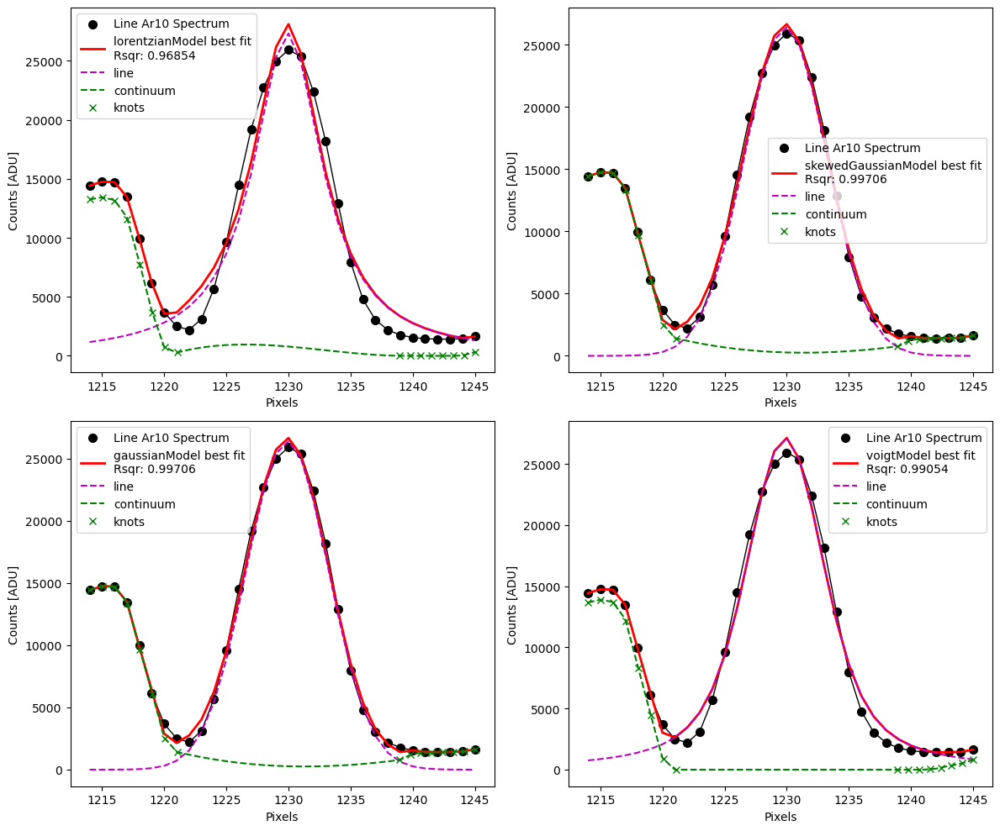

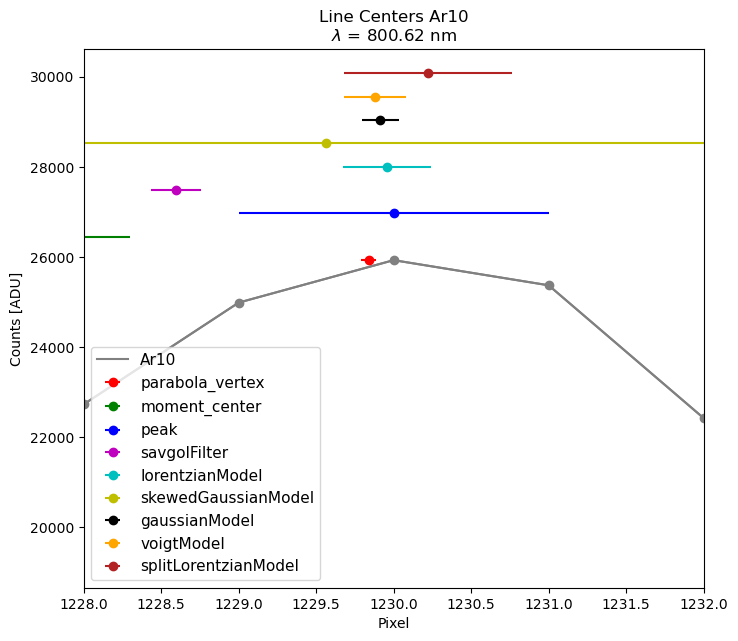

In [13]:
name = 'Ar10'
peak =1230.0
exptime = 12

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3.0, nknots=8)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg01

In [14]:
name = 'Hg01'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
0,2,253.652,69.0,43821.0,5.0,69.520778,74.295479,72.319902,1.0,0.206758,0.921681,1.594193,1.993852e+06,/Users/esteves/Downloads/spectrometer_local/ex...,-43751.479222,Hg01


Dark subtraction
Flat fielding
Saving results to .//results/Hg01.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                     \
          timestamp  name wavelength exptime    peak_height       fwhm   
0   20250311T153442  Hg01    253.652       2  103807.961729   7.002795   
1   20250311T153442  Hg01    253.652       2  103807.961729   7.751469   
2   20250311T153442  Hg01    253.652       3  127776.916830   7.688147   
3   20250311T153442  Hg01    253.652       5  110513.844500   7.355818   
4   20250311T153442  Hg01    253.652       3  127776.916830   7.552508   
5   20250311T153442  Hg01    253.652       2  103807.961729   7.860060   
6   20250311T153442  Hg01    253.652       5  110513.844500   7.330796   
7   20250311T153442  Hg01    253.652       9  155836.660116   8.266402   
8   20250311T153442  Hg01    253.652       6  127791.763102   7.698456   
9   20250311T153442  Hg01    253.652      12  155836.660116  11.976279   
10  20250311T153442  Hg01    253.652       9  155836.660116   8.266402   

   parabola_vertex                    moment_center  ... skewedGaussianModel  \
            center     error rsquared        center  ...            rsquared   
0        69.557327  0.146888      NaN     69.684309  ...            0.996113   
1        69.557327  0.146888      NaN     69.684309  ...            0.985174   
2        70.055229  0.131046      NaN     70.098088  ...            0.994700   
3        69.699293  0.187569      NaN     69.836023  ...            0.994841   
4        70.055229  0.131046      NaN     70.240469  ...            0.993345   
5        69.557327  0.146888      NaN     69.789974  ...            0.992514   
6        69.699293  0.187569      NaN     69.947494  ...            0.986484   
7        71.030334  0.164223      NaN     71.122476  ...            0.995004   
8        70.054647  0.130953      NaN     70.239489  ...            0.992708   
9        73.431595  0.374530      NaN     73.191510  ...            0.987776   
10       71.030334  0.164223      NaN     71.122476  ...            0.995004   

   gaussianModel                     voigtModel                      \
          center     error  rsquared     center     error  rsquared   
0      69.625311  0.135902  0.996142  69.599168  0.277598  0.974987   
1      69.635332  0.427786  0.982009  69.600359  0.299097  0.972881   
2      70.161897  0.227673  0.993823  70.160802  0.472964  0.963924   
3      69.752974  0.291064  0.988234  69.746158  0.308006  0.974068   
4      70.175190  0.181206  0.995408  70.140777  0.449549  0.963464   
5      69.594722  0.536989  0.967212  69.611317  0.315107  0.969949   
6      69.767963  0.222607  0.992362  69.845598  0.646701  0.922074   
7      71.191761  0.201869  0.995058  71.201346  0.316933  0.978982   
8      70.150556  0.269931  0.990394  70.135470  0.477753  0.963448   
9      73.430139  1.154881  0.985409  73.355498  1.506458  0.946014   
10     71.191761  0.201869  0.995058  71.201346  0.316933  0.978982   

   splitLorentzianModel                      
                 center     error  rsquared  
0             69.527642  0.736290  0.934101  
1             69.533505  0.781680  0.910342  
2             70.066344  0.605219  0.948743  
3             69.739275  0.615456  0.942120  
4             70.083294  0.627623  0.947158  
5             69.538734  0.717661  0.925761  
6             69.857044  0.635323  0.939715  
7             71.241798  0.675871  0.947659  
8             70.035435  0.607343  0.948812  
9             73.374530  1.372433  0.903384  
10            71.241798  0.675871  0.947659  

[11 rows x 33 columns]

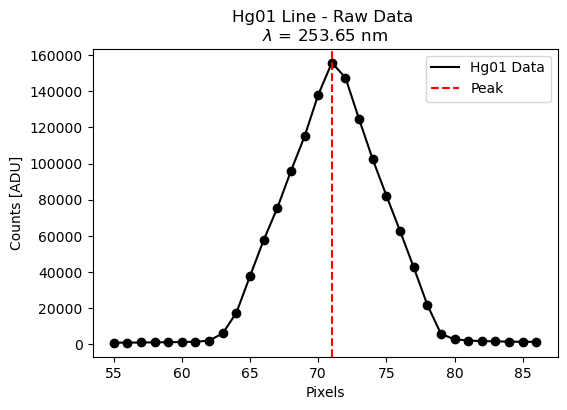

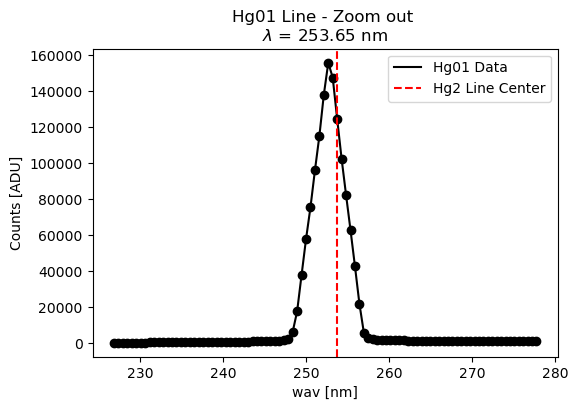

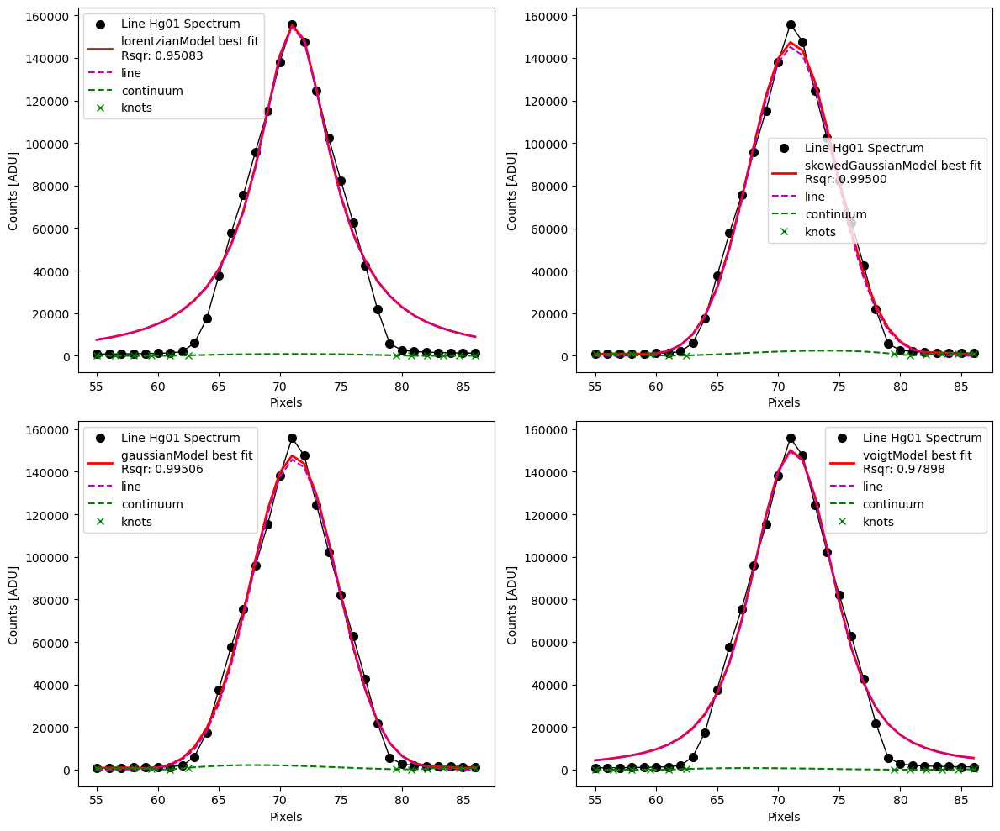

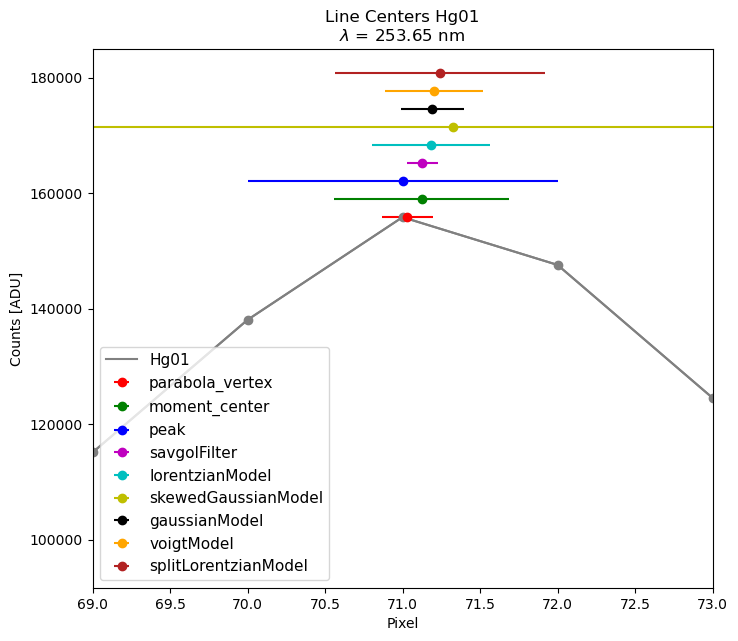

In [153]:
name = 'Hg01'
peak = 71
exptime = 9

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=6)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg03

In [195]:
name = 'Hg03'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name


In [17]:
# peak = 162.0
# exptime = 12

# ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=8)
# fig1 = ar01.plot_raw_line()
# fig2 = ar01.plot_zoom_out()
# ar01.measure_centroids()
# ar01.fit_models(nsigma=2.0, nknots=3)
# fig3 = ar01.compare_models()
# fig4 = ar01.plot_line_centers(window=2)
# ar01.save_results()

In [18]:
ar01.peak_fwhm

7

## Hg02

In [169]:
name = 'Hg02'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
1,9,296.7284,152.0,5243.0,6.0,151.564885,151.466592,151.443787,1.0,0.059812,0.098497,0.54819,34824.154412,/Users/esteves/Downloads/spectrometer_local/ex...,-5091.435115,Hg02


Dark subtraction
Flat fielding
Saving results to .//results/Hg02.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
          timestamp  name wavelength exptime   peak_height      fwhm   
0   20250311T153442  Hg02   296.7284      12   6893.534367  7.508807   
1   20250311T153442  Hg02   296.7284      12   6893.534367  7.524818   
2   20250311T153442  Hg02   296.7284      12   6893.534367  7.459764   
3   20250311T153442  Hg02   296.7284      12   6893.534367  7.835057   
4   20250311T153442  Hg02   296.7284      12   6893.534367  7.195741   
5   20250311T153442  Hg02   296.7284      12   6893.534367  7.332212   
6   20250311T153442  Hg02   296.7284      12   6893.534367  7.112761   
7   20250311T153442  Hg02   296.7284      12   6893.534367  7.111386   
8   20250311T153442  Hg02   296.7284      22  12689.574030  7.103729   
9   20250311T153442  Hg02   296.7284      22  12689.574030  7.439203   
10  20250311T153442  Hg02   296.7284    1000  80068.350460  7.920712   
11  20250311T153442  Hg02   296.7284      22  12689.574030  7.439203   

   parabola_vertex                    moment_center  ... skewedGaussianModel  \
            center     error rsquared        center  ...            rsquared   
0       151.504368  0.032797      NaN    162.800679  ...            0.977983   
1       151.504368  0.032797      NaN    164.670276  ...            0.979584   
2       151.504368  0.032797      NaN    164.670276  ...            0.989510   
3       151.504368  0.032797      NaN    164.670276  ...            0.975302   
4       151.504368  0.032797      NaN    164.670276  ...            0.991225   
5       151.504368  0.032797      NaN    143.344960  ...            0.992132   
6       151.504368  0.032797      NaN    143.344960  ...            0.990422   
7       151.504368  0.032797      NaN    151.367784  ...            0.990145   
8       151.515388  0.032002      NaN    151.378677  ...            0.990225   
9       151.515388  0.032002      NaN    151.378677  ...            0.985605   
10      224.112518  0.118337      NaN    224.228396  ...            0.999018   
11      151.515388  0.032002      NaN    151.378677  ...            0.985605   

   gaussianModel                      voigtModel                      \
          center     error  rsquared      center     error  rsquared   
0     151.374416  0.326271  0.978524  151.447736  0.271315  0.977574   
1     151.372485  0.332192  0.981318  151.473325  0.308497  0.977045   
2     151.380055  0.201890  0.989431  151.406175  0.217852  0.981736   
3     151.606026  1.003595  0.971805  151.536069  1.150776  0.957674   
4     151.273065       NaN  0.991225  151.423025  0.232878  0.980925   
5     151.336644  0.167166  0.992132  151.372052  0.296574  0.980030   
6     151.299019       NaN  0.990422  151.412496  0.189691  0.980342   
7     151.321794  0.120901  0.990145  151.415725  0.185610  0.980393   
8     151.336899       NaN  0.990225  151.456405  0.189051  0.980073   
9     151.405717  0.191297  0.990654  151.572808  0.288797  0.975838   
10    224.185100  0.088887  0.999018  224.194991  0.109572  0.998077   
11    151.405717  0.191297  0.990654  151.572808  0.288797  0.975838   

   splitLorentzianModel                      
                 center     error  rsquared  
0            150.592884  0.498655  0.966438  
1            150.607536  0.506206  0.966443  
2            150.640613  0.461158  0.966569  
3            151.492624  0.618469  0.956189  
4            150.663765  0.406435  0.964728  
5            150.590609  0.442381  0.965142  
6            150.683675  0.432316  0.962197  
7            150.661728  0.427185  0.962898  
8            150.670192  0.429287  0.962441  
9            151.401464  0.665716  0.926712  
10           224.127465  0.243893  0.993382  
11           151.401464  0.665716  0.926712  

[12 rows x 33 columns]

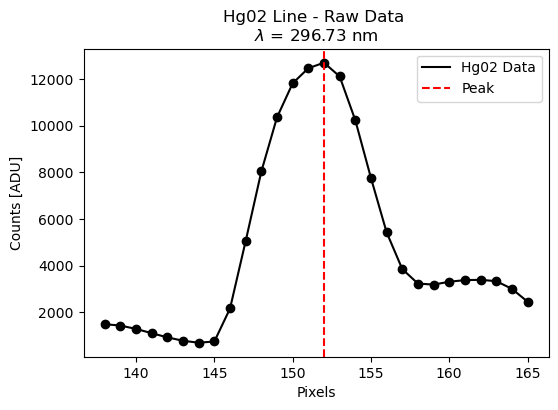

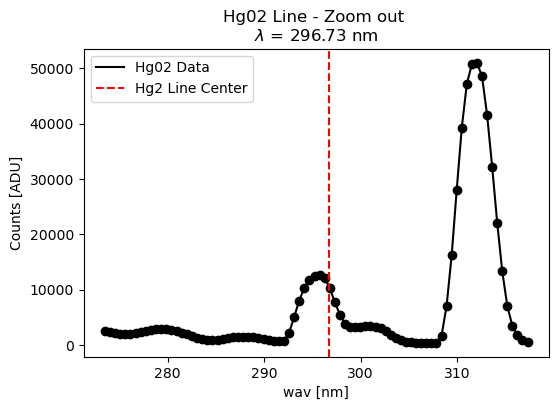

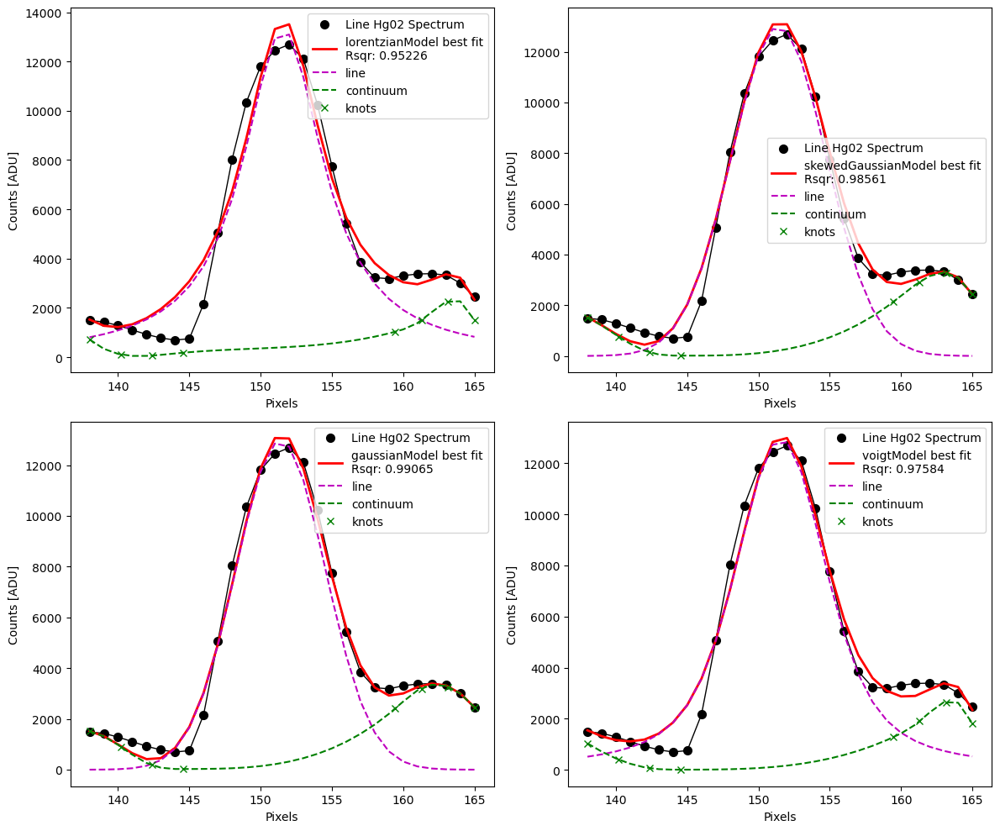

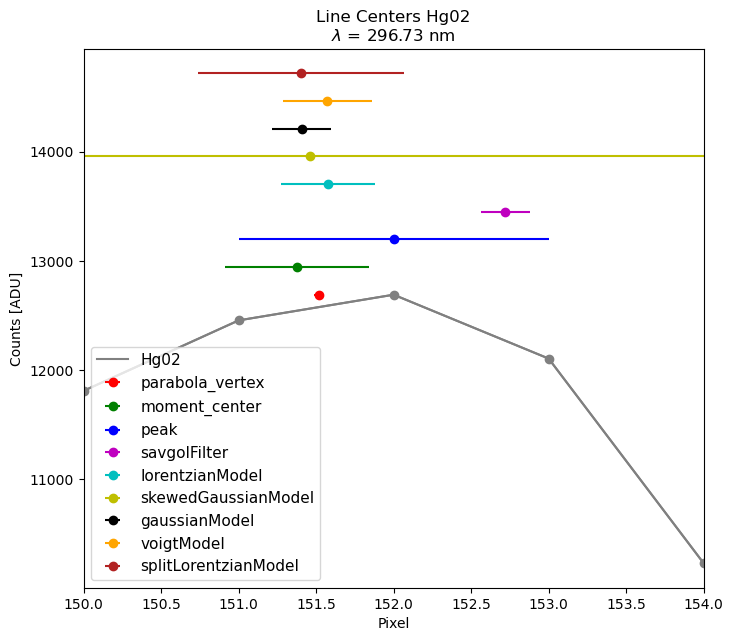

In [170]:
name = 'Hg02'
peak = 152.0
exptime = 22

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=14)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg04

In [21]:
name = 'Hg04'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
2,2,313.1555,183.0,8882.0,7.0,182.4069,182.71058,182.729205,1.0,0.021421,0.086363,0.573098,101941.562586,/Users/esteves/Downloads/spectrometer_local/ex...,-8699.5931,Hg04


Dark subtraction
Flat fielding
Saving results to .//results/Hg04.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Hg04   312.5674      27  62192.899329  7.351653   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      182.901208  0.057832      NaN    183.024979  ...            0.997408   

  gaussianModel                      voigtModel                     \
         center     error  rsquared      center    error  rsquared   
0    182.969767  0.058728  0.997408  182.965778  0.14986  0.979299   

  splitLorentzianModel                      
                center     error  rsquared  
0           182.783721  0.432243  0.948933  

[1 rows x 33 columns]

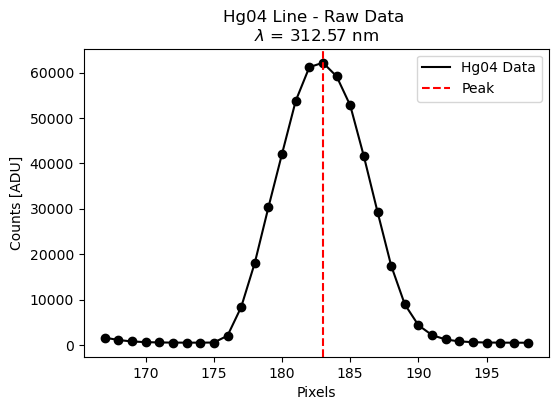

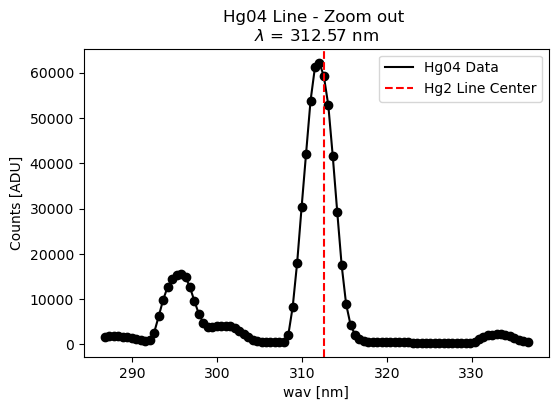

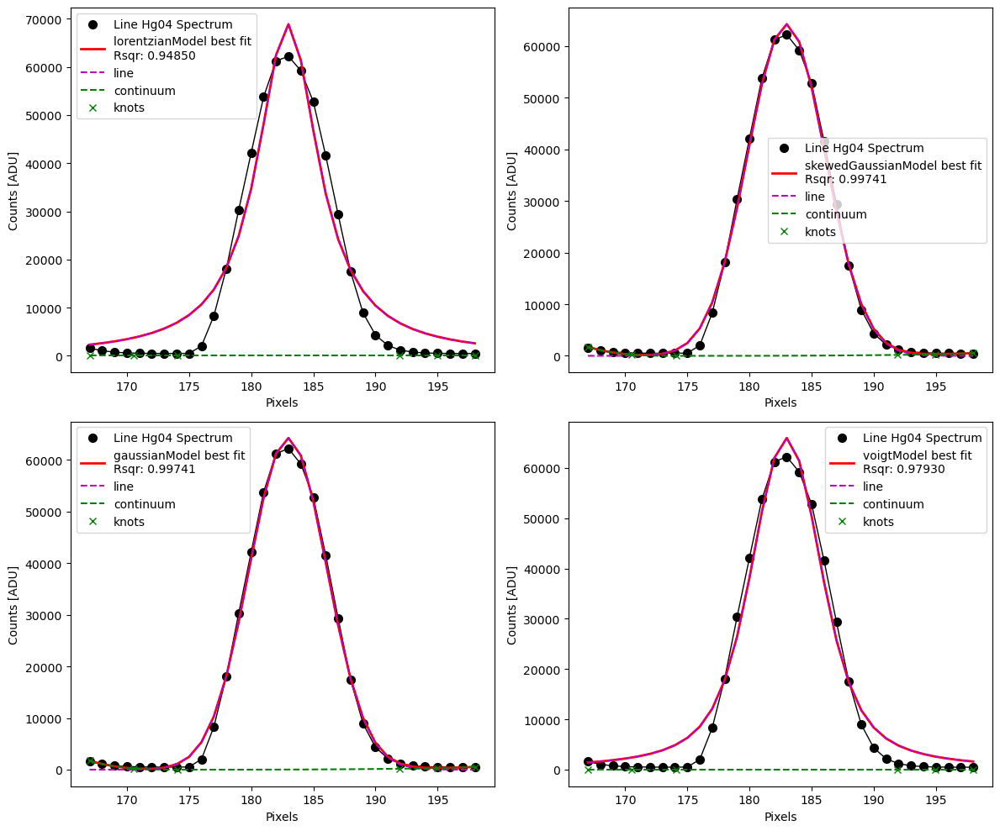

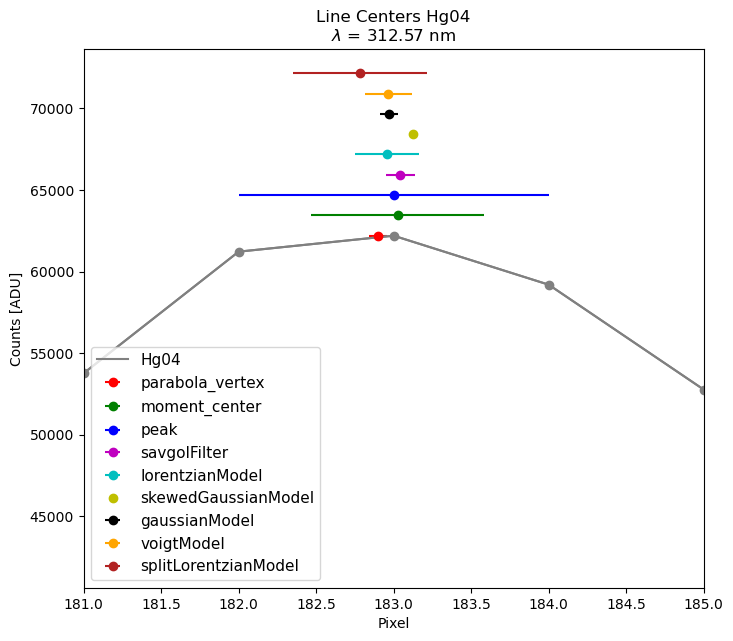

In [22]:
peak = 183.0
exptime = 27

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3.0, nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

In [23]:
# ar01.peak_fwhm

## Hg05

In [24]:
name = 'Hg05'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
3,47,334.1482,224.0,4740.0,7.0,223.25451,223.617687,223.677002,1.0,0.097336,0.124304,0.542826,18911.71039,/Users/esteves/Downloads/spectrometer_local/ex...,-4516.74549,Hg05


Dark subtraction
Flat fielding
Saving results to .//results/Hg05.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                  \
         timestamp  name wavelength exptime  peak_height      fwhm   
0  20250311T153442  Hg05   334.1482    1000  80068.35046  7.920712   
1  20250311T153442  Hg05   334.1482    1000  80068.35046  7.920712   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      224.112518  0.118337      NaN    224.228396  ...            0.999018   
1      224.112518  0.118337      NaN    224.228396  ...            0.999018   

  gaussianModel                      voigtModel                      \
         center     error  rsquared      center     error  rsquared   
0      224.1851  0.088887  0.999018  224.194991  0.109572  0.998077   
1      224.1851  0.088887  0.999018  224.194991  0.109572  0.998077   

  splitLorentzianModel                      
                center     error  rsquared  
0           224.127465  0.243893  0.993382  
1           224.127465  0.243893  0.993382  

[2 rows x 33 columns]

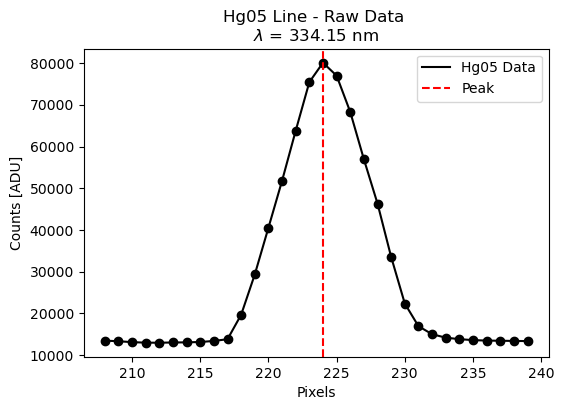

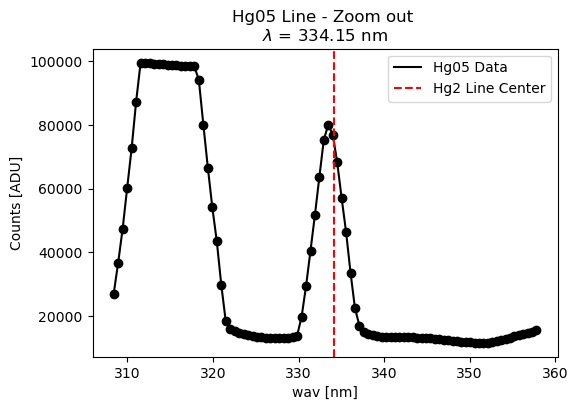

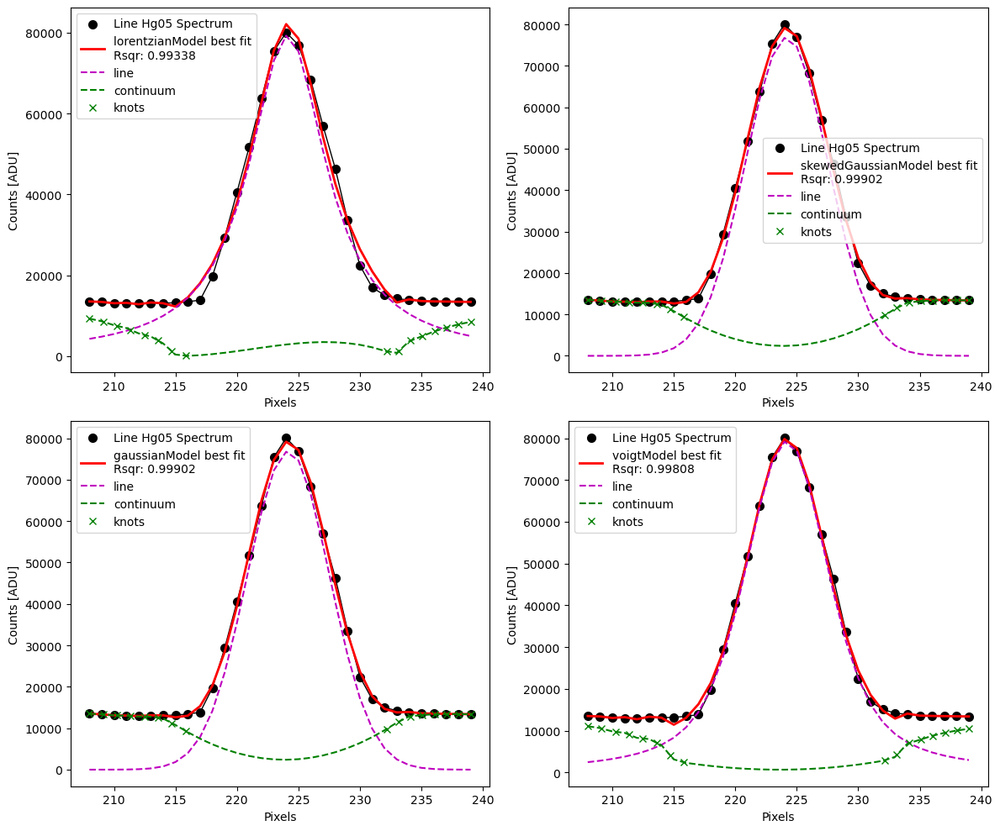

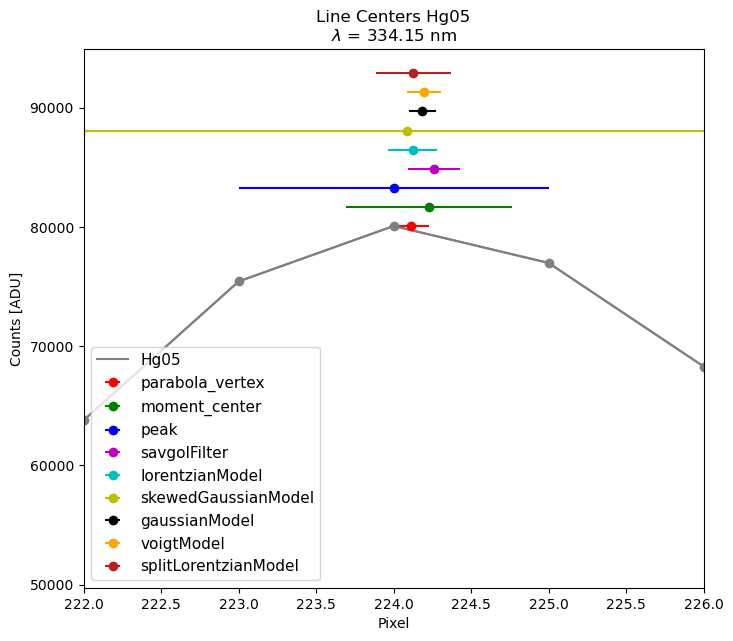

In [168]:
name = 'Hg05'

peak = 224.0
exptime = 1000

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.75, nknots=8)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg06

In [26]:
name = 'Hg06'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
4,2,365.0152,284.0,7447.0,7.0,283.85514,283.80359,283.839824,1.0,0.089157,0.084401,0.598051,171360.233835,/Users/esteves/Downloads/spectrometer_local/ex...,-7163.14486,Hg06


Dark subtraction
Flat fielding
Saving results to .//results/Hg06.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Hg06   365.4842      37  59096.193305  7.242848   
2  20250311T153442  Hg06   365.4842      37  59096.193305  7.639312   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      284.420618  0.126429      NaN    284.564527  ...            0.996249   
2      284.420618  0.126429      NaN    284.722876  ...            0.997172   

  gaussianModel                      voigtModel                      \
         center     error  rsquared      center     error  rsquared   
0    284.506679  0.129725  0.997457  284.495490  0.300208  0.979135   
2    284.592910  0.378526  0.982721  284.499735  0.376550  0.968750   

  splitLorentzianModel                      
                center     error  rsquared  
0           284.476012  0.789360  0.929857  
2           284.492045  0.875243  0.915271  

[2 rows x 33 columns]

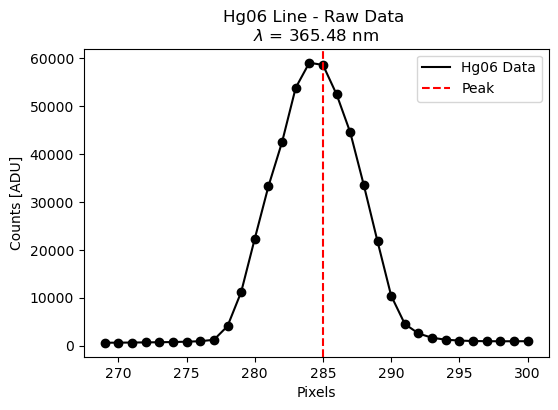

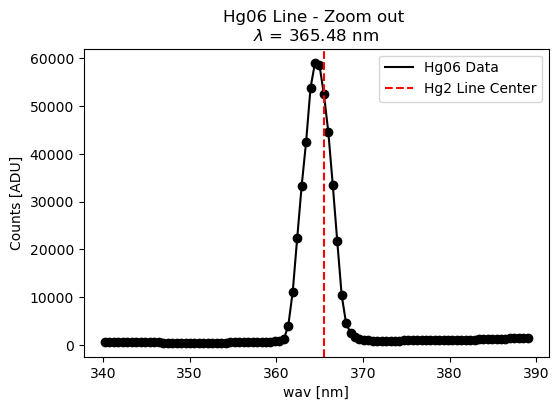

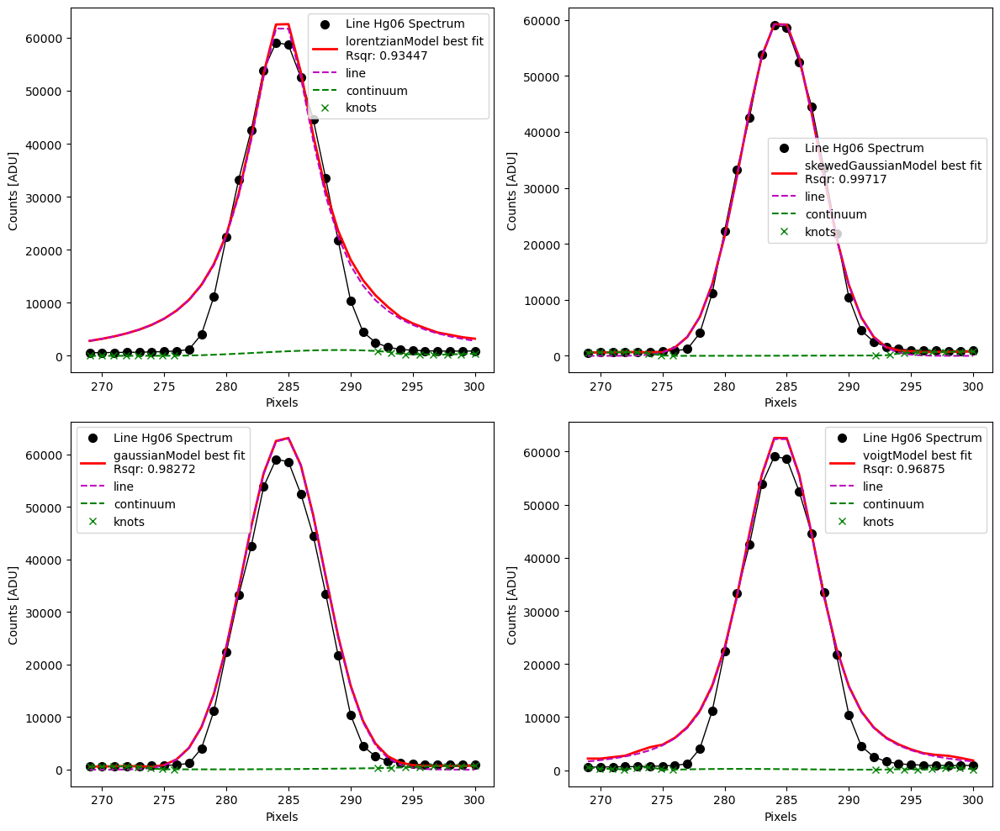

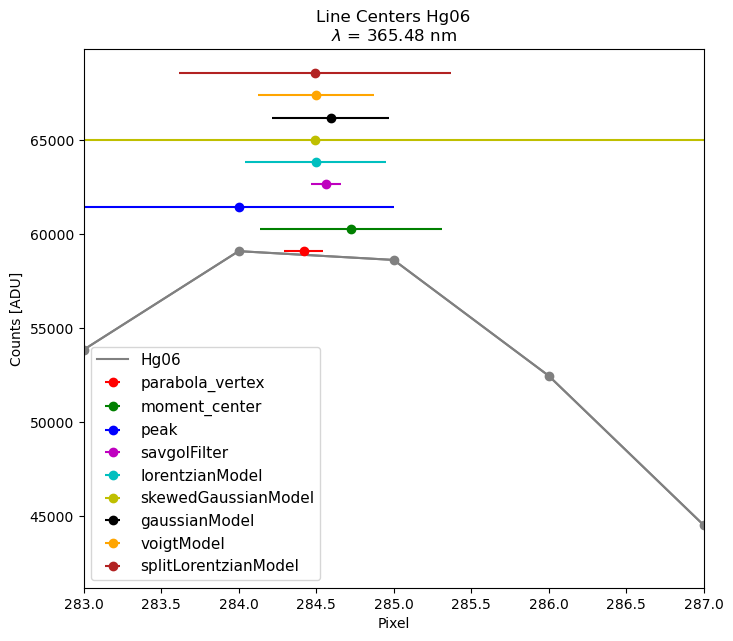

In [197]:
name = 'Hg06'

peak = 285.0
exptime = 37

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.75, nknots=8)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg07

In [28]:
name = 'Hg07'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
5,2,404.6565,363.0,6226.0,7.0,361.743664,361.699915,361.731302,1.0,0.125276,0.127472,0.574178,172141.279007,/Users/esteves/Downloads/spectrometer_local/ex...,-5864.256336,Hg07


Dark subtraction
Flat fielding
Saving results to .//results/Hg07.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Hg07   404.6565      42  45993.598559  7.453213   
1  20250311T153442  Hg07   404.6565      42  45993.598559  7.403347   
2  20250311T153442  Hg07   404.6565      42  45993.598559  7.611507   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      362.621091  0.035144      NaN    362.783223  ...            0.995846   
1      362.621091  0.035144      NaN    362.972272  ...            0.995880   
2      362.621091  0.035144      NaN    362.972272  ...            0.975902   

  gaussianModel                      voigtModel                      \
         center     error  rsquared      center     error  rsquared   
0    362.598281  0.173073  0.995846  362.647333  0.241664  0.986642   
1    362.616510  0.101712  0.995880  362.649189  0.146952  0.987980   
2    362.574886  0.146081  0.994767  362.593086  0.161810  0.987372   

  splitLorentzianModel                      
                center     error  rsquared  
0           362.533347  0.588809  0.960084  
1           362.512562  0.387716  0.964820  
2           362.513755  0.397391  0.964909  

[3 rows x 33 columns]

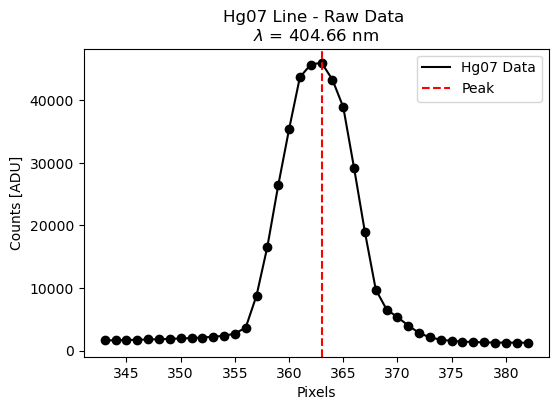

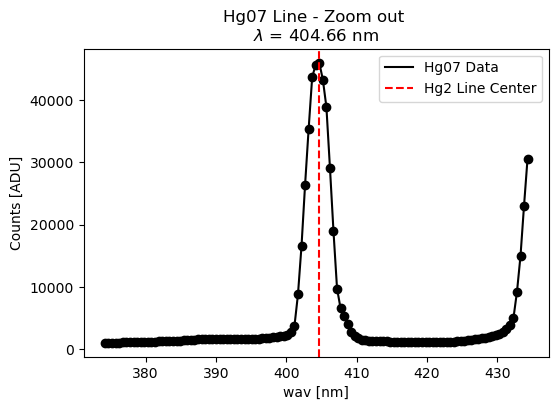

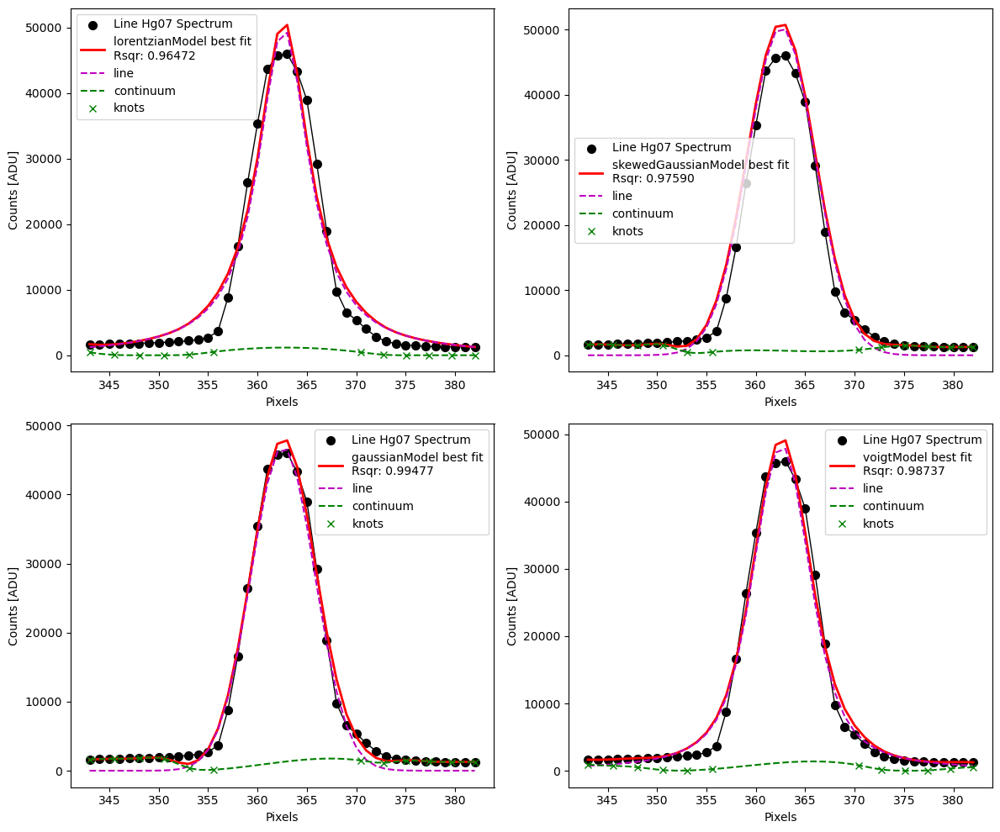

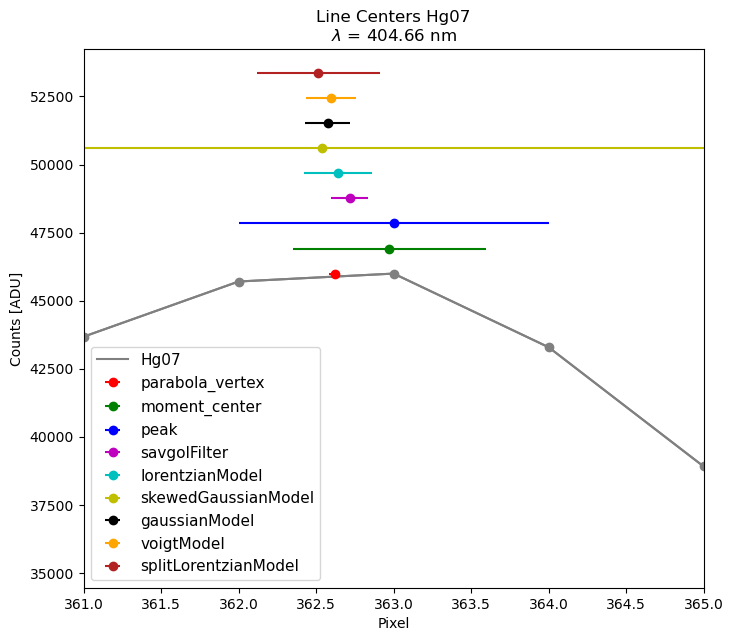

In [172]:
name = 'Hg07'
peak = 363.0
exptime = 42

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=20)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=6)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg08

In [173]:
name = 'Hg08'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
6,2,435.8343,424.0,11111.0,7.0,424.247221,424.027532,424.055078,1.0,0.135521,0.131775,0.531688,886407.921575,/Users/esteves/Downloads/spectrometer_local/ex...,-10686.752779,Hg08


Dark subtraction
Flat fielding
Saving results to .//results/Hg08.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Hg08   435.8343       2   9268.229632  6.772613   
1  20250311T153442  Hg08   435.8343      12  24349.742118  6.909775   
2  20250311T153442  Hg08   435.8343      12  24349.742118  6.734170   
3  20250311T153442  Hg08   435.8343      22  43668.914240  7.252300   
4  20250311T153442  Hg08   435.8343      17  34160.046357  6.781106   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      423.944912  0.058835      NaN    424.218080  ...            0.982261   
1      424.167330  0.081203      NaN    424.354990  ...            0.985249   
2      424.167330  0.081203      NaN    424.354990  ...            0.987375   
3      425.221871  0.113875      NaN    425.158075  ...            0.996748   
4      424.614245  0.149322      NaN    424.712549  ...            0.994374   

  gaussianModel                      voigtModel                      \
         center     error  rsquared      center     error  rsquared   
0    423.976824  0.176930  0.984753  424.009818  0.212631  0.969381   
1    424.201256  0.233775  0.986498  424.192972  0.374414  0.961847   
2    424.236149  0.164903  0.987375  424.242166  0.218192  0.971792   
3    425.305813  0.084296  0.996748  425.290372  0.176514  0.984933   
4    424.659365  0.114365  0.994374  424.656719  0.179348  0.981071   

  splitLorentzianModel                      
                center     error  rsquared  
0           423.827893  0.503464  0.937415  
1           424.019942  0.631797  0.936637  
2           424.055659  0.577736  0.938414  
3           425.371191  0.466189  0.958911  
4           424.663841  0.488222  0.950986  

[5 rows x 33 columns]

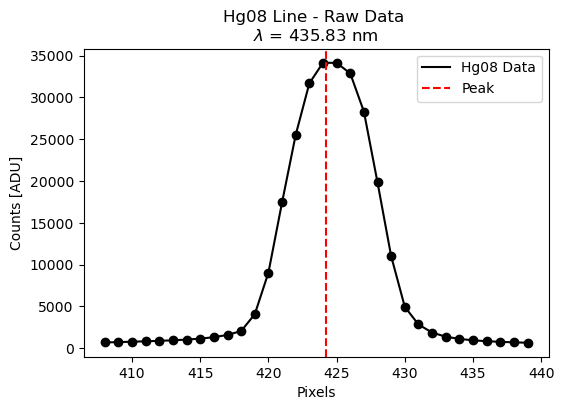

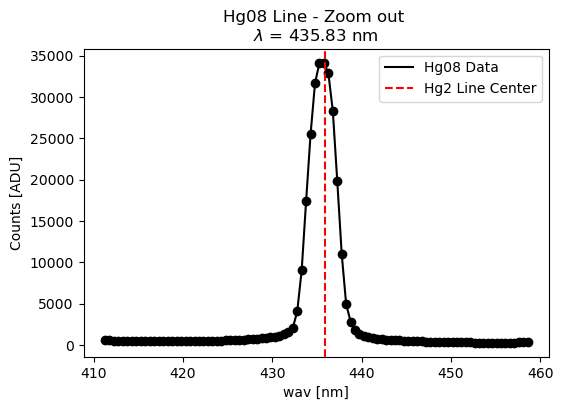

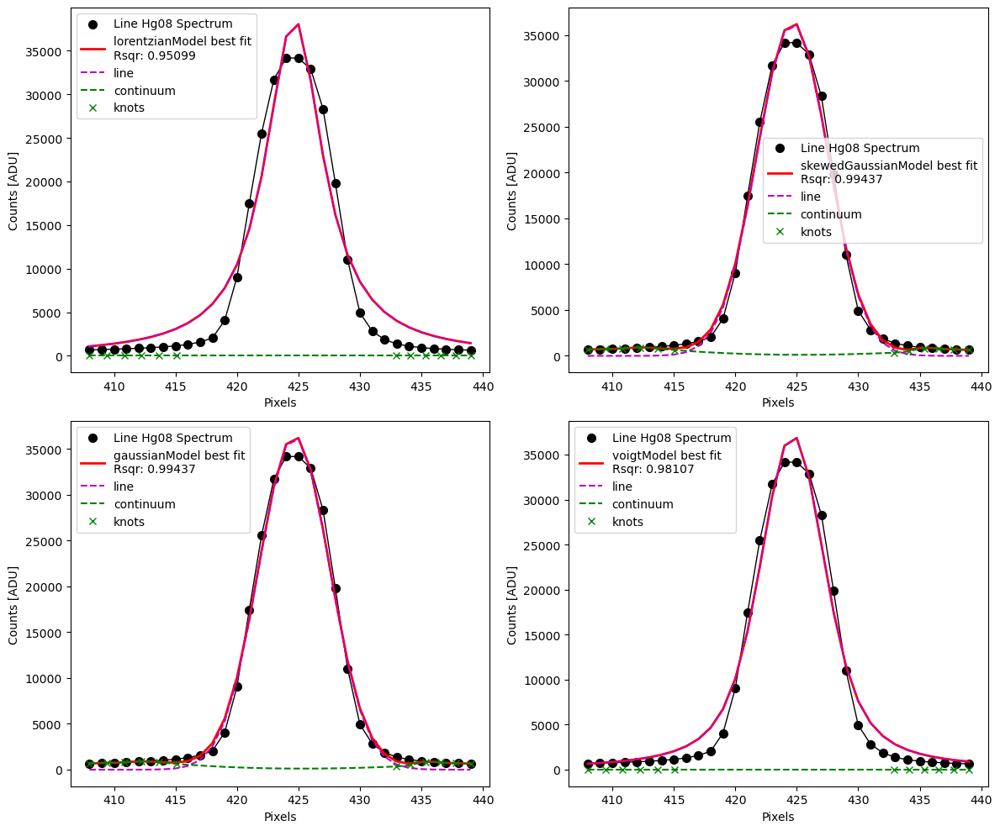

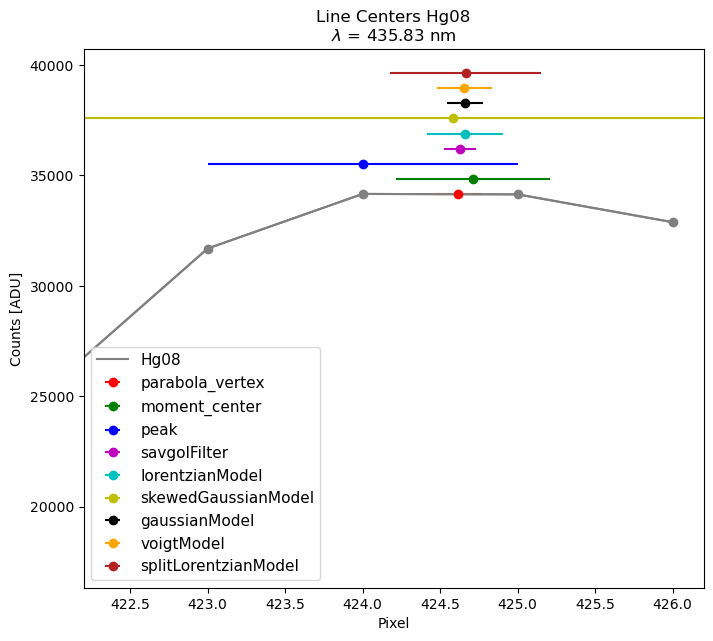

In [181]:
peak = 424.2
exptime = 17

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3, nknots=6)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg09

In [182]:
name = 'Hg09'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
7,2,546.0735,651.0,12041.0,6.0,650.474205,650.272826,650.279613,1.0,0.086412,0.111897,0.508903,833024.367911,/Users/esteves/Downloads/spectrometer_local/ex...,-11390.525795,Hg09


Dark subtraction
Flat fielding
Saving results to .//results/Hg09.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Hg09   546.0735      17  44077.114618  7.167932   
1  20250311T153442  Hg09   546.0735       2  11897.075841  7.226004   
2  20250311T153442  Hg09   546.0735      12  31364.357030  6.914962   
3  20250311T153442  Hg09   546.0735      12  31364.357030  6.692904   
4  20250311T153442  Hg09   546.0735      12  31364.357030  6.518609   
5  20250311T153442  Hg09   546.0735      12  31364.357030  6.558211   
6  20250311T153442  Hg09   546.0735      12  31364.357030  6.519014   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      651.085626  0.068139      NaN    651.817514  ...            0.995668   
1      650.485095  0.051130      NaN    651.198320  ...            0.971800   
2      650.666197  0.034738      NaN    651.392100  ...            0.990578   
3      650.666197  0.034738      NaN    651.392100  ...            0.991623   
4      650.666197  0.034738      NaN    651.392100  ...            0.990428   
5      650.666197  0.034738      NaN    651.392100  ...            0.989540   
6      650.666197  0.034738      NaN    651.392100  ...            0.990044   

  gaussianModel                      voigtModel                      \
         center     error  rsquared      center     error  rsquared   
0    651.049567  0.110187  0.995437  651.085327  0.175783  0.985281   
1    650.402640  0.217306  0.982896  650.471143  0.249945  0.973203   
2    650.634027  0.141869  0.991023  650.616192  0.196389  0.978649   
3    650.533657       NaN  0.991623  650.632499  0.167853  0.981096   
4    650.470610  0.109458  0.990428  650.581919  0.148051  0.980385   
5    650.532212  0.097173  0.989554  650.596504  0.132690  0.979706   
6    650.503297  0.086550  0.990044  650.590337  0.136386  0.979995   

  splitLorentzianModel                      
                center     error  rsquared  
0           651.067894  0.406847  0.966705  
1           650.295235  0.485350  0.950081  
2           650.542315  0.492871  0.951319  
3           649.716974  0.341560  0.967106  
4           649.717038  0.319160  0.967106  
5           649.766475  0.311121  0.966424  
6           649.717000  0.309731  0.967106  

[7 rows x 33 columns]

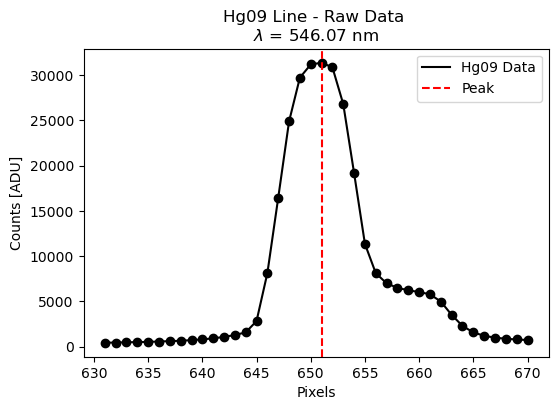

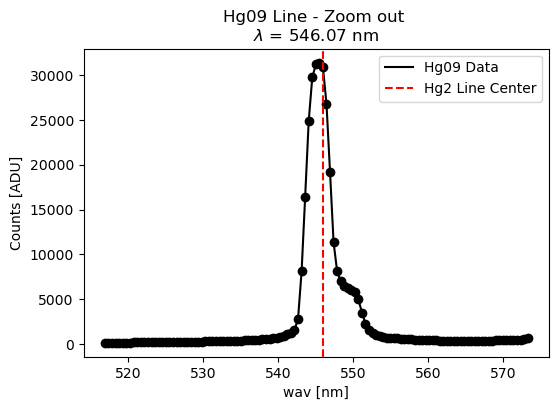

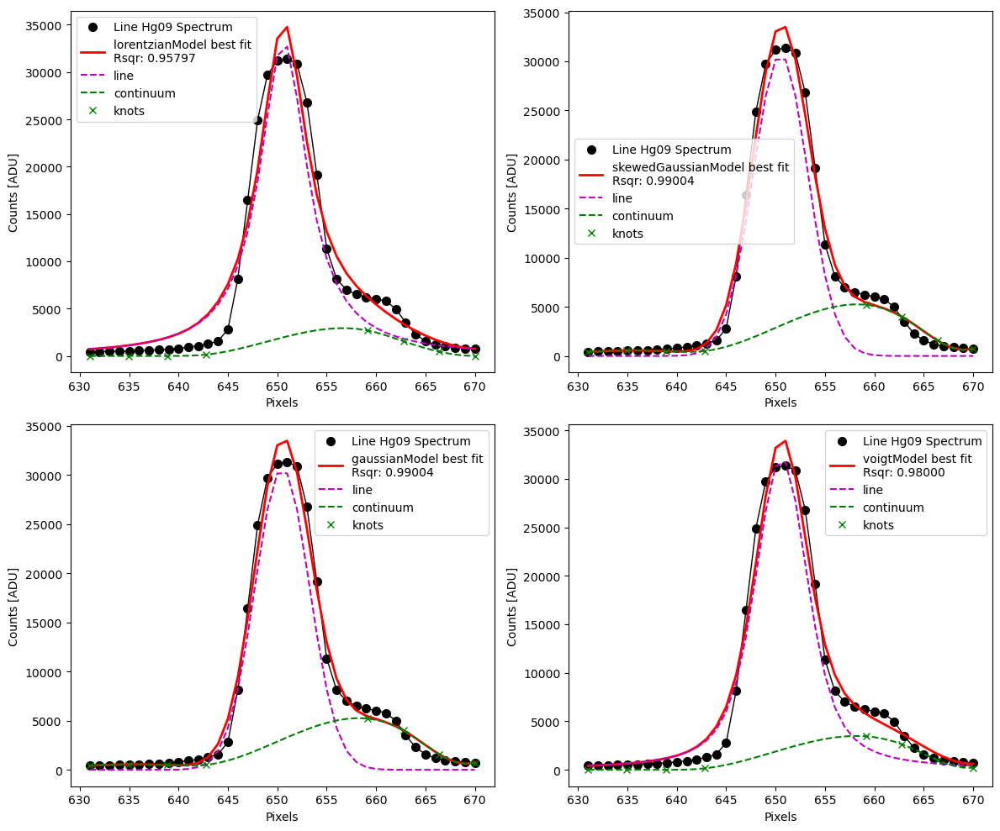

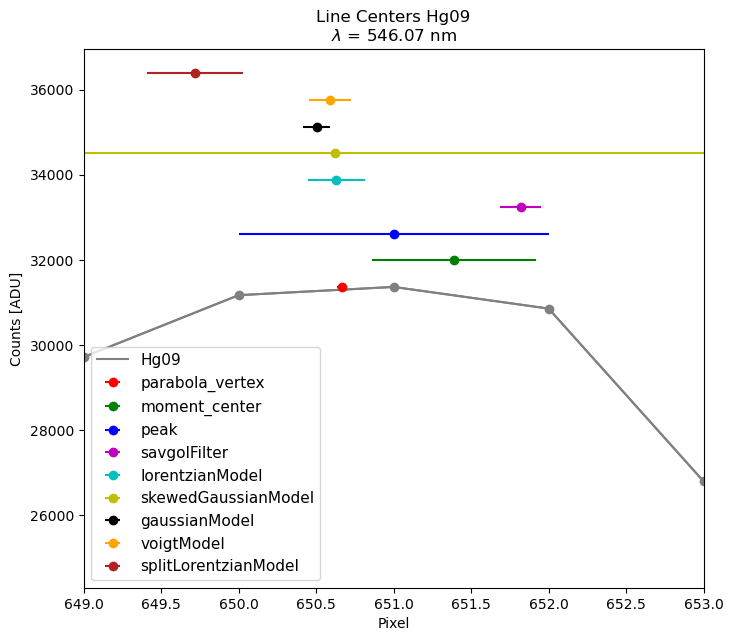

In [188]:
name = 'Hg09'
peak = 651.0
exptime = 12

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=20)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.75, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Hg10

In [189]:
name = 'Hg10'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
8,2,576.9598,718.0,5379.0,8.0,718.0922,718.129494,718.123389,1.0,0.223915,0.12214,0.690952,36120.334542,/Users/esteves/Downloads/spectrometer_local/ex...,-4660.9078,Hg10


Dark subtraction
Flat fielding
Saving results to .//results/Hg10.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Hg10   576.9598      37  33528.648933  9.894720   
1  20250311T153442  Hg10   576.9598      12  10875.449106  9.400241   
2  20250311T153442  Hg10   576.9598      12  10875.449106  9.317129   
3  20250311T153442  Hg10   576.9598      12  10875.449106  9.054366   
4  20250311T153442  Hg10   576.9598      22  20018.685946  9.069191   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      718.347143  0.159140      NaN    718.363006  ...            0.988482   
1      718.278092  0.156440      NaN    718.295699  ...            0.988463   
2      718.278092  0.156440      NaN    718.520547  ...            0.991120   
3      718.278092  0.156440      NaN    718.520547  ...            0.990909   
4      718.297979  0.157221      NaN    718.539833  ...            0.991128   

  gaussianModel                      voigtModel                      \
         center     error  rsquared      center     error  rsquared   
0    718.547747  0.480486  0.986327  718.302978  0.291222  0.985149   
1    718.288740  0.345693  0.989071  718.214744  0.294811  0.984427   
2    718.287105  0.230295  0.991050  718.213945  0.218217  0.986526   
3    718.231441       NaN  0.990908  718.273247  0.185046  0.985641   
4    718.260806      None  0.991128  718.301152  0.184407  0.985742   

  splitLorentzianModel                      
                center     error  rsquared  
0           718.201896  0.500082  0.971032  
1           717.880408  0.483911  0.975146  
2           718.108219  0.407834  0.974803  
3           718.054989  0.393498  0.975096  
4           717.998923  0.389111  0.975159  

[5 rows x 33 columns]

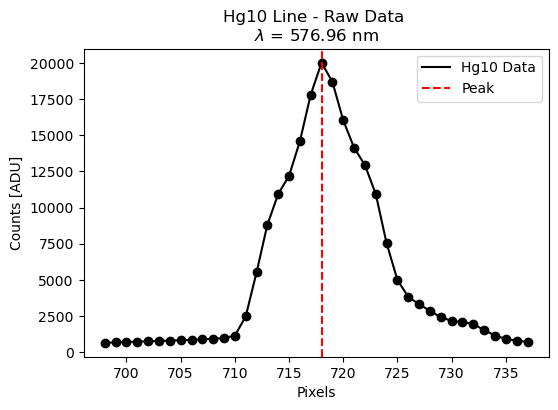

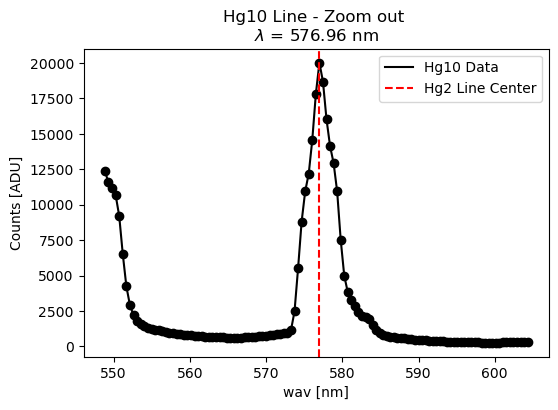

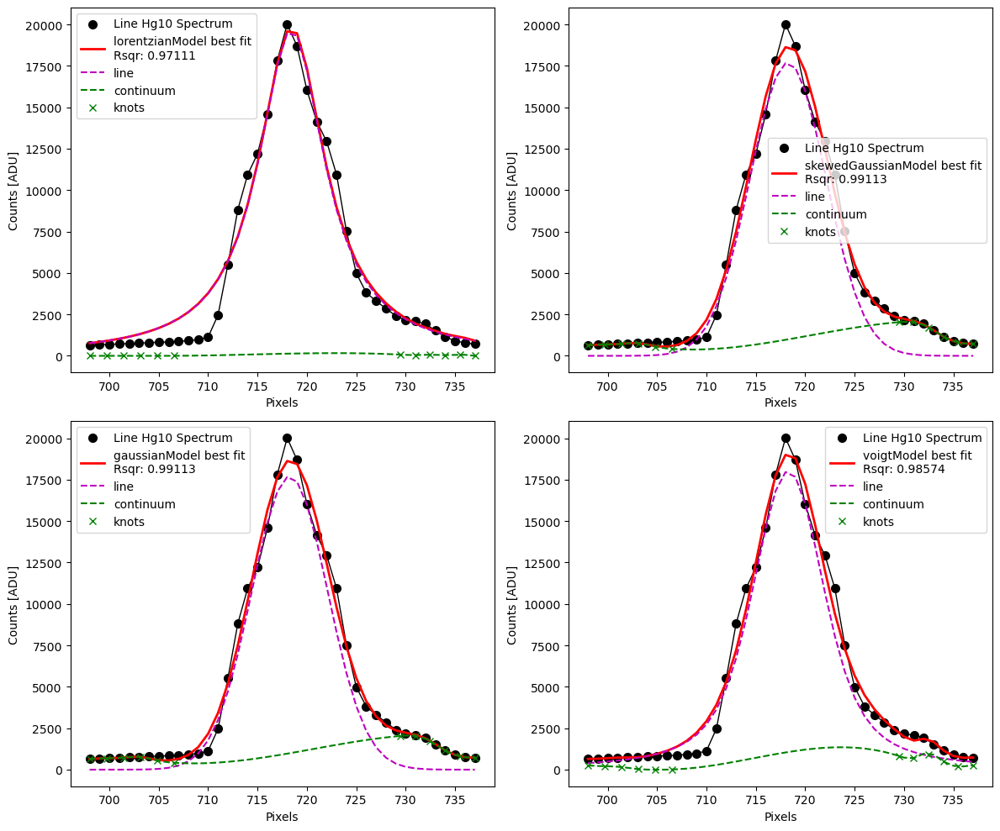

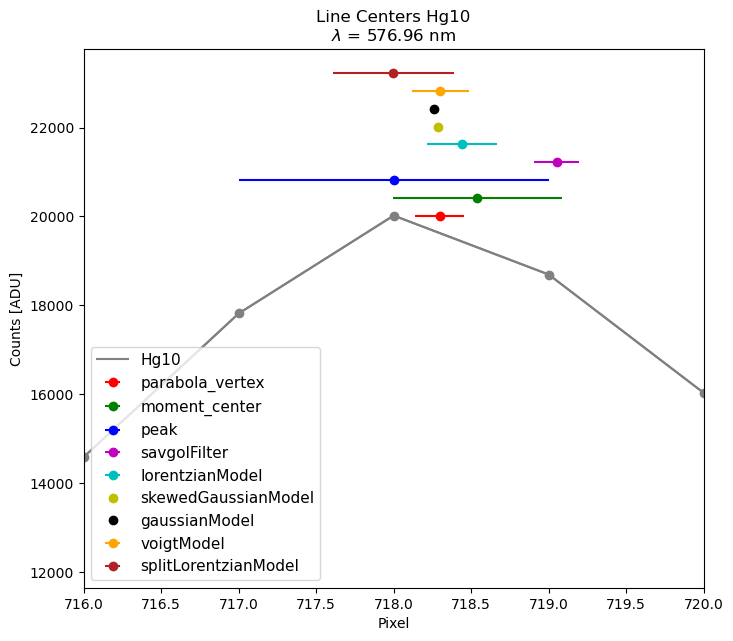

In [199]:
name = 'Hg10'

peak = 718.0
exptime = 22

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=20)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3.0, nknots=6)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar01

In [34]:
name = 'Ar01'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name


Dark subtraction
Flat fielding
Saving results to .//results/Ar01.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar01   696.5431      82  58224.879754  7.676787   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0       981.43035  0.122437      NaN    981.386275  ...            0.991303   

  gaussianModel                      voigtModel                     \
         center     error  rsquared      center    error  rsquared   
0    981.501595  0.170521  0.991303  981.572557  0.17177  0.989474   

  splitLorentzianModel                      
                center     error  rsquared  
0           982.050427  0.329147  0.980598  

[1 rows x 33 columns]

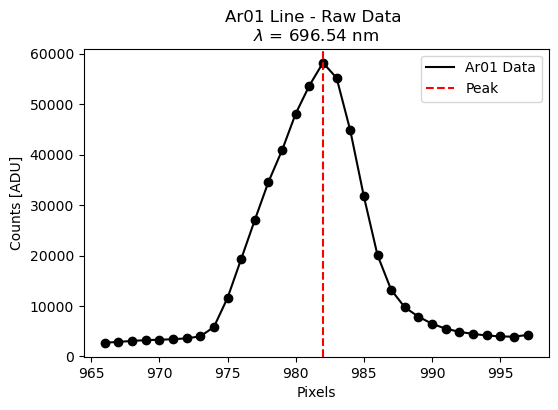

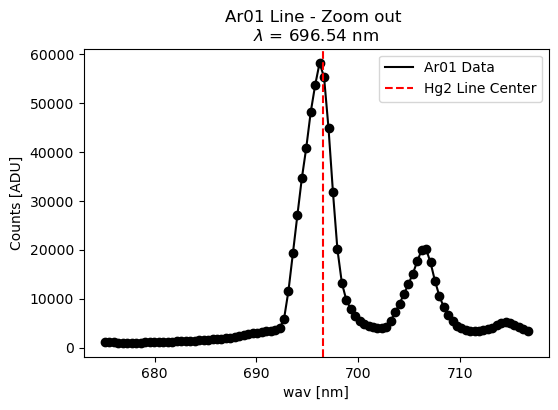

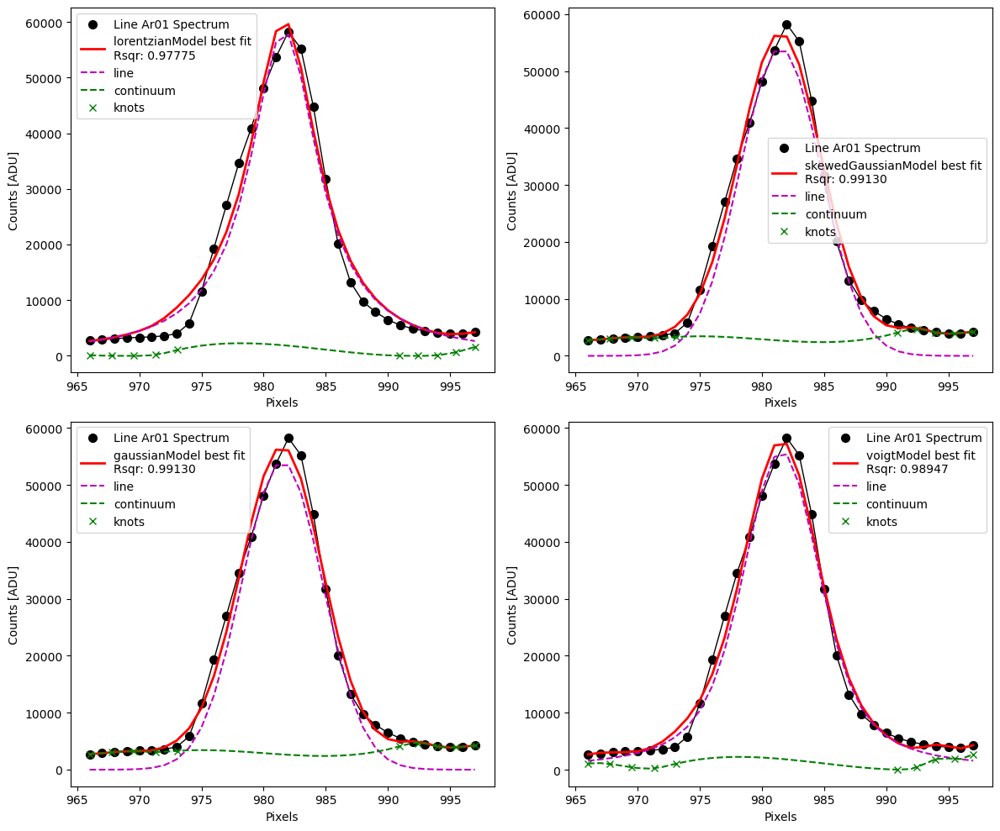

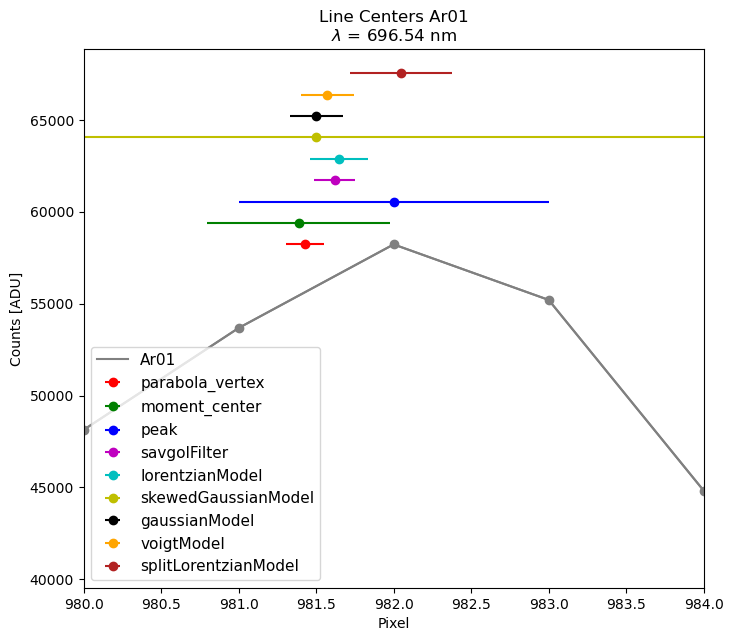

In [35]:
peak = 982.0
exptime = 82

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3.0, nknots=5)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar02

In [36]:
name = 'Ar02'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name


Dark subtraction
Flat fielding
Saving results to .//results/Ar02.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar02   706.7218      42  10273.784468  6.208813   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      1005.19299  0.142081      NaN   1004.983622  ...            0.995742   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1005.431995  0.128385  0.995742  1005.531869  0.078853  0.997899   

  splitLorentzianModel                      
                center     error  rsquared  
0          1005.782641  0.028269  0.999883  

[1 rows x 33 columns]

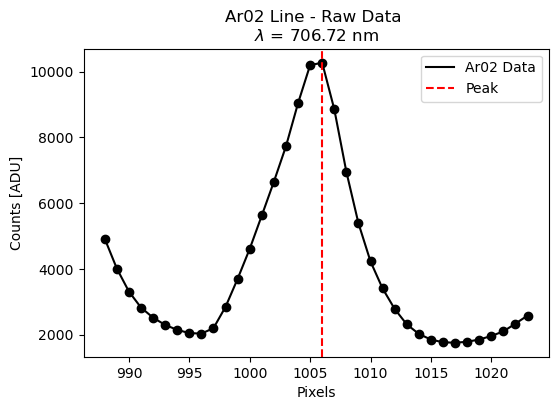

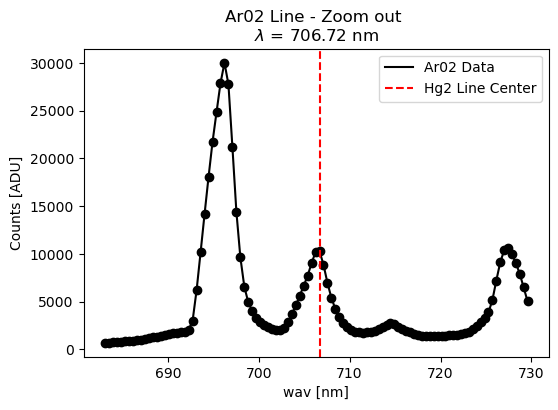

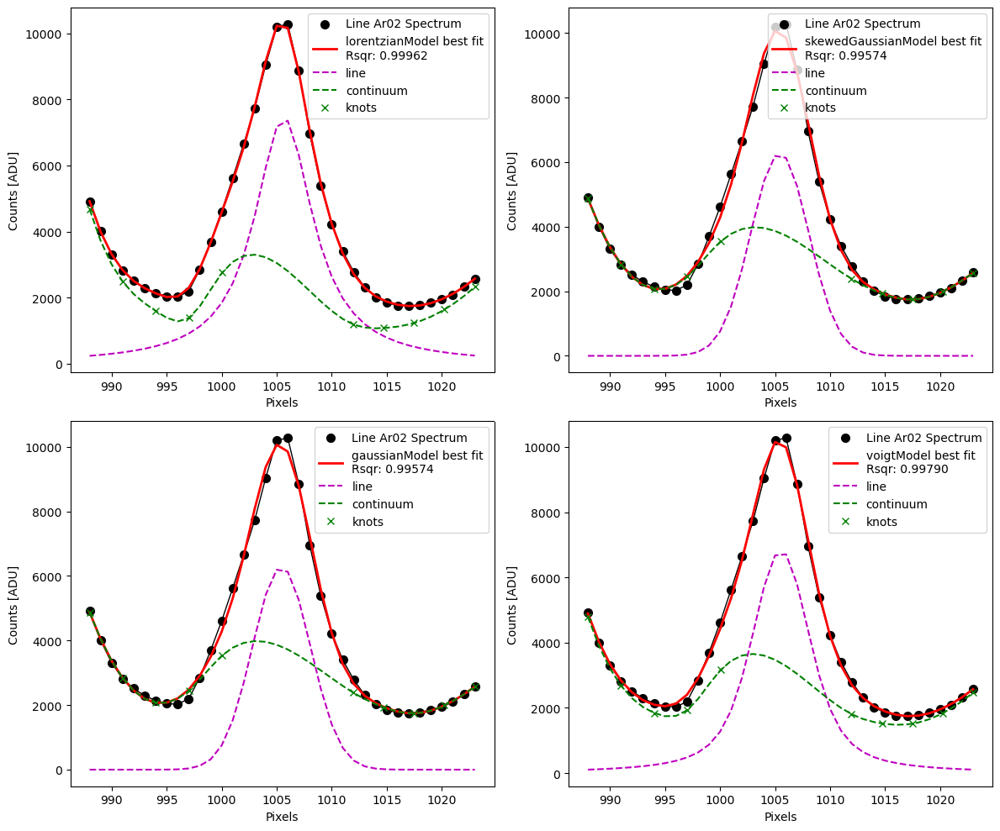

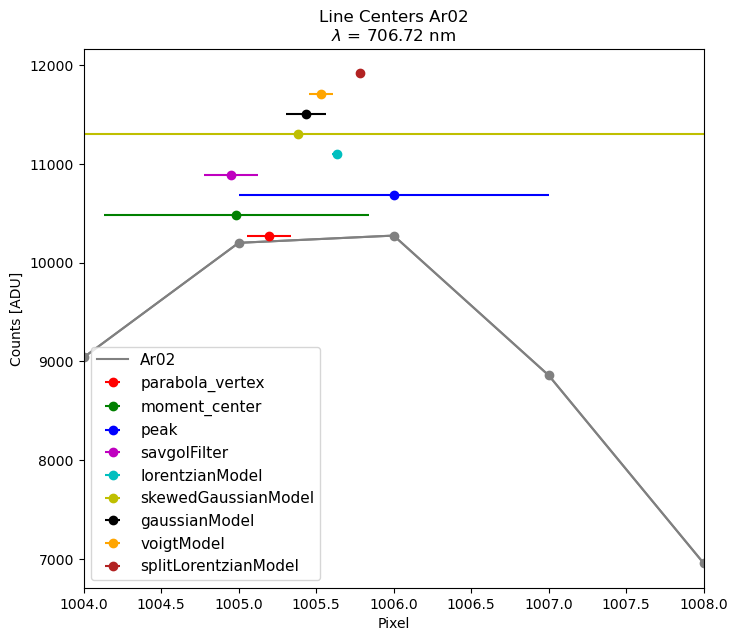

In [37]:
peak = 1006.0
exptime = 42

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.0, nknots=5)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar03

In [38]:
name = 'Ar03'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name


Dark subtraction
Flat fielding
Saving results to .//results/Ar03.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar03   714.7042     342  21952.504376  5.019097   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1023.989835  0.165957      NaN   1021.181302  ...            0.999551   

  gaussianModel                     voigtModel                      \
         center     error  rsquared     center     error  rsquared   
0   1024.288235  0.052719  0.998922  1024.2433  0.044644  0.999199   

  splitLorentzianModel                         
                center        error  rsquared  
0           1013.19755  3252.447294  0.899394  

[1 rows x 33 columns]

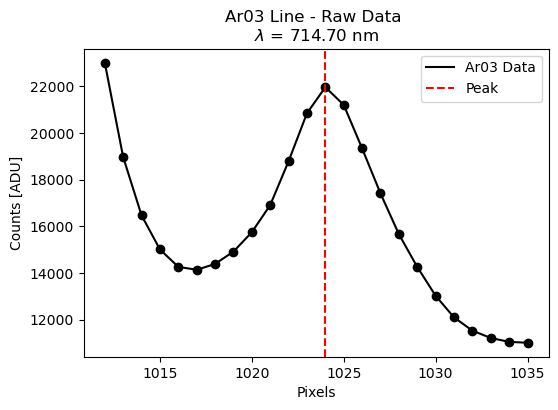

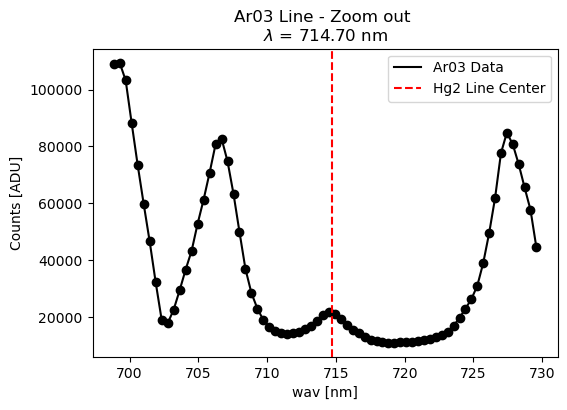

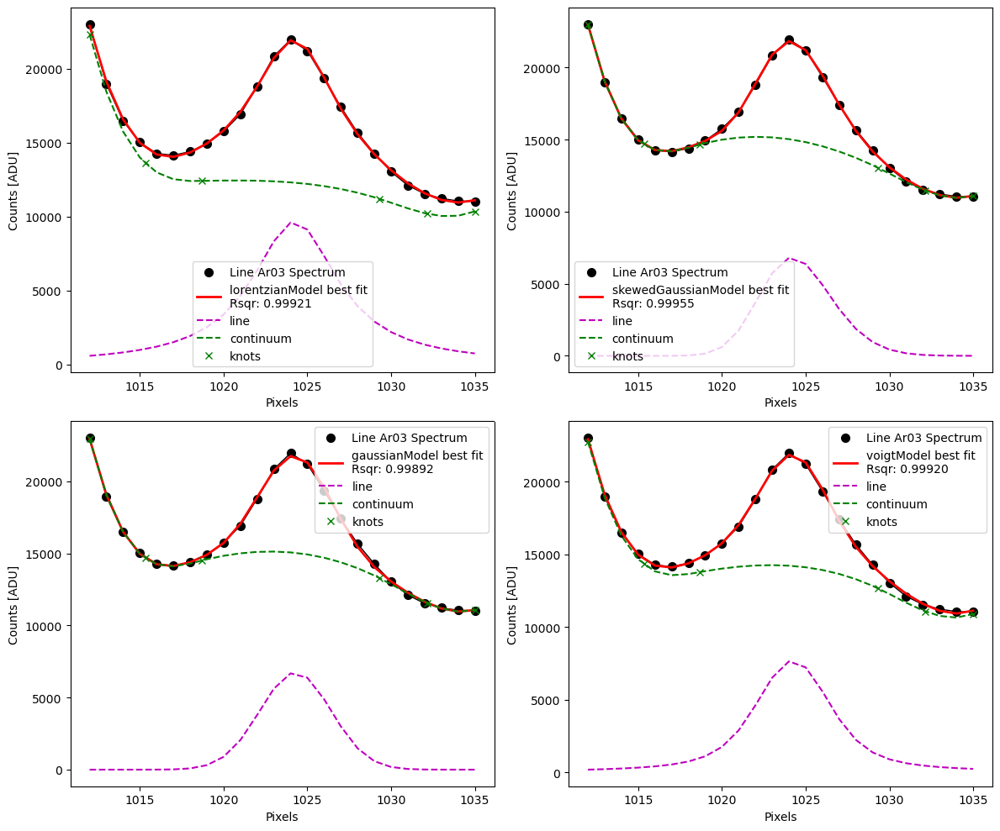

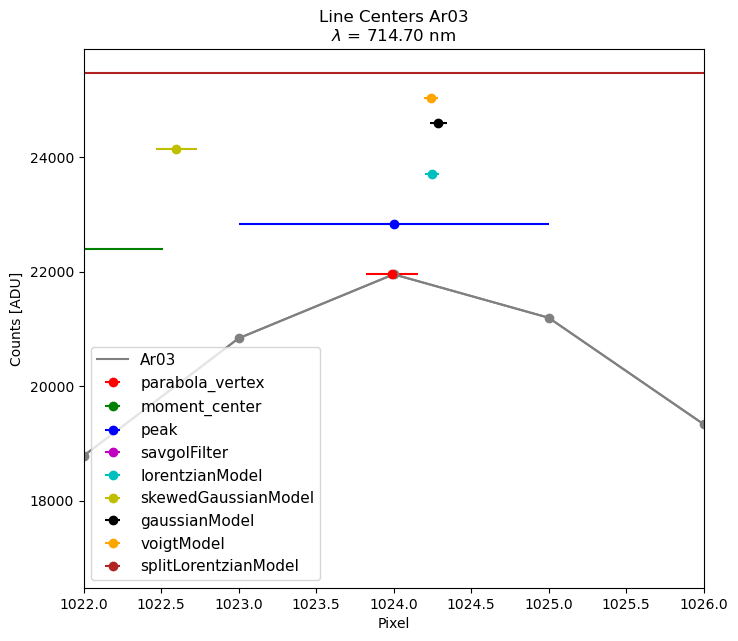

In [39]:
peak = 1024.0
exptime = 342

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=12)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar04

In [244]:
name = 'Ar04'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
9,22,727.2936,1054.0,5177.0,7.0,1054.103395,1054.245722,1054.393441,1.0,0.069337,0.064797,0.559972,18086.775696,/Users/esteves/Downloads/spectrometer_local/ex...,-4122.896605,Ar04


Dark subtraction
Flat fielding
Saving results to .//results/Ar04.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar04   727.2936      32   8105.066524  7.062446   
1  20250311T153442  Ar04   727.2936      22   5555.787023  7.068903   
2  20250311T153442  Ar04   727.2936      22   5555.787023  7.064313   
3  20250311T153442  Ar04   727.2936      22   5555.787023  7.066197   
4  20250311T153442  Ar04   727.2936      42  10643.148604  7.063698   
5  20250311T153442  Ar04   727.2936     102  25951.889266  7.043370   
6  20250311T153442  Ar04   727.2936     142  36135.943611  7.030982   
7  20250311T153442  Ar04   727.2936     192  48869.277457  7.009377   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1054.136175  0.104454      NaN   1054.296159  ...            0.998367   
1     1054.134526  0.103847      NaN   1054.292642  ...            0.998332   
2     1054.134526  0.103847      NaN   1054.273710  ...            0.996757   
3     1054.134526  0.103847      NaN   1054.281721  ...            0.998411   
4     1054.137254  0.104894      NaN   1054.286878  ...            0.996884   
5     1054.164108  0.109402      NaN   1054.325288  ...            0.997083   
6     1054.184858  0.113146      NaN   1054.347977  ...            0.998544   
7     1054.223571  0.121547      NaN   1054.388409  ...            0.998591   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1054.107923  0.082006  0.996682  1054.050457  0.082663  0.996674   
1   1054.103576  0.083111  0.996643  1054.046919  0.083351  0.996632   
2   1054.108507  0.075119  0.996757  1054.065340  0.076505  0.996699   
3   1054.112038  0.068705  0.996847  1054.077327  0.070565  0.996765   
4   1054.117728  0.068313  0.996884  1054.082029  0.070062  0.996809   
5   1054.154222  0.065904  0.997083  1054.121538  0.067701  0.997006   
6   1054.181284  0.063984  0.997249  1054.151921  0.065831  0.997171   
7   1054.231745  0.061246  0.997481  1054.207135  0.062977  0.997416   

  splitLorentzianModel                      
                center     error  rsquared  
0          1053.672993  0.115510  0.997257  
1          1053.668947  0.116574  0.997209  
2          1053.687029  0.113567  0.997162  
3          1053.699903  0.109766  0.997165  
4          1053.705672  0.108910  0.997213  
5          1053.755038  0.106706  0.997331  
6          1053.794493  0.104851  0.997435  
7          1053.866005  0.100974  0.997648  

[8 rows x 33 columns]

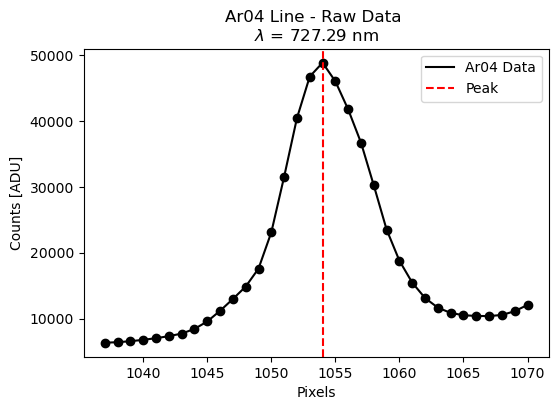

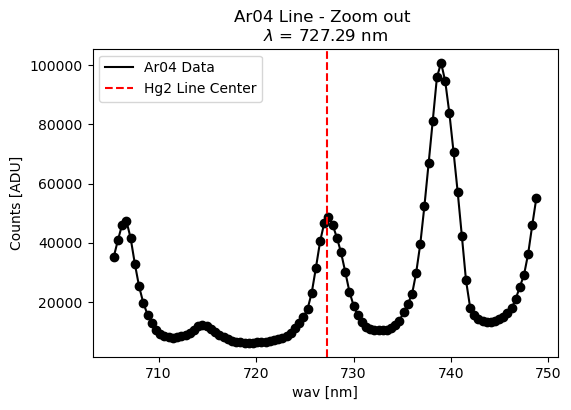

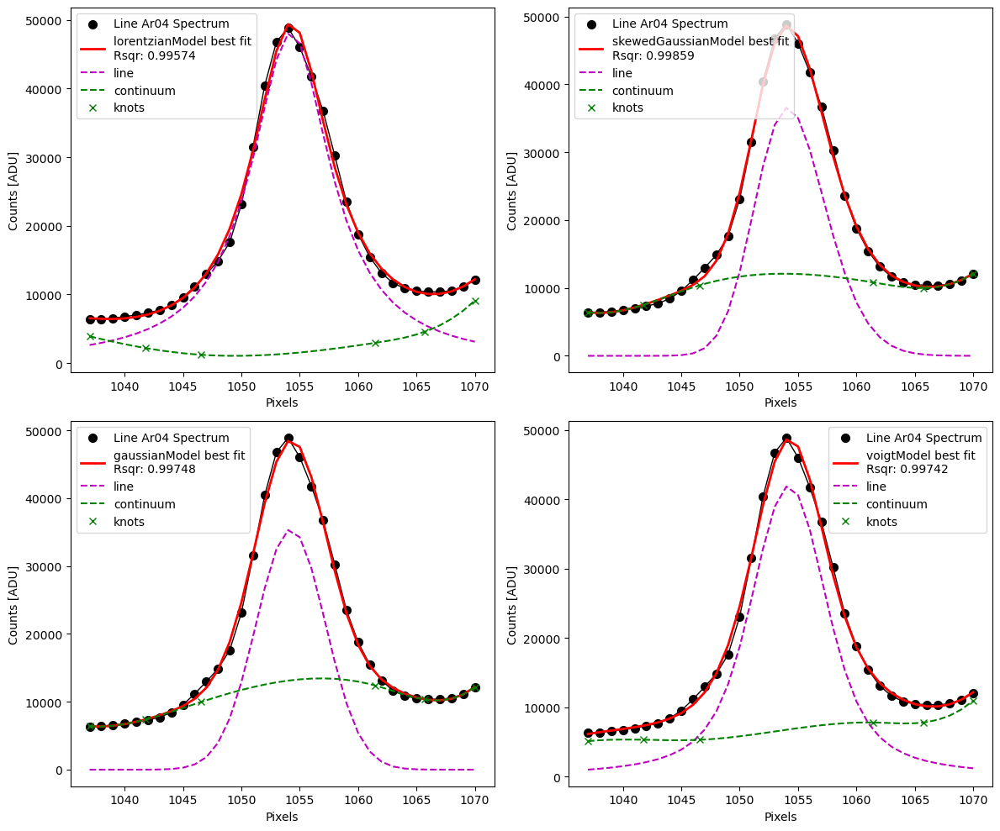

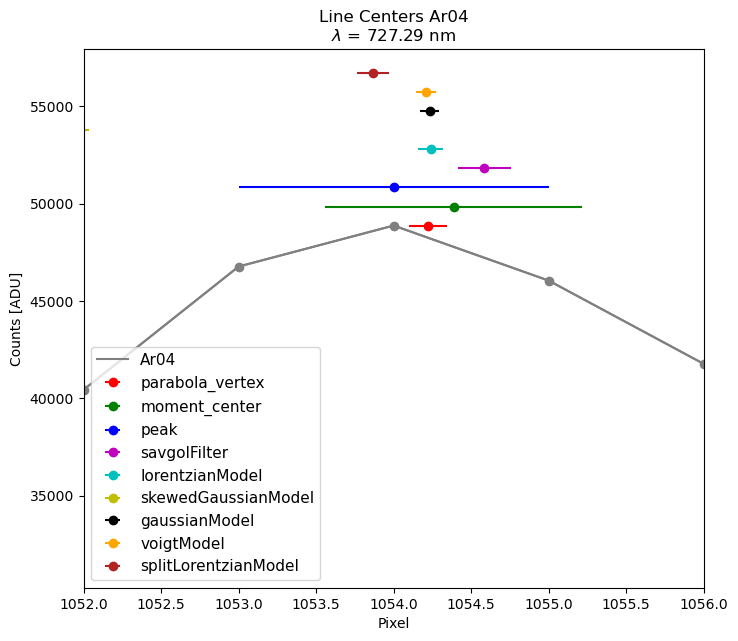

In [251]:
name = 'Ar04'
peak = 1054.0
exptime = 192

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=17)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar05

In [126]:
name = 'Ar05'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
10,9,738.398,1080.0,4946.0,7.0,1080.163469,1080.236487,1080.30003,1.0,0.052139,0.070084,0.538894,30847.152691,/Users/esteves/Downloads/spectrometer_local/ex...,-3865.836531,Ar05


Dark subtraction
Flat fielding
Saving results to .//results/Ar05.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar05    738.398     142  78391.425552  7.672410   
1  20250311T153442  Ar05    738.398     102  57404.572798  7.473093   
2  20250311T153442  Ar05    738.398     102  57404.572798  7.654707   
3  20250311T153442  Ar05    738.398     102  57404.572798  7.493695   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1080.713456  0.199452      NaN   1080.660280  ...            0.995841   
1     1080.302786  0.104195      NaN   1080.346012  ...            0.997768   
2     1080.302786  0.104195      NaN   1080.346012  ...            0.997690   
3     1080.302786  0.104195      NaN   1080.346012  ...            0.958661   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1080.779602  0.111199  0.995841  1080.704625  0.122130  0.994221   
1   1080.396319  0.078444  0.997475  1080.366594  0.094246  0.995976   
2   1080.382742  0.113864  0.997690  1080.380503  0.130559  0.996188   
3   1080.286391  0.163942  0.997842  1080.296329  0.180713  0.996540   

  splitLorentzianModel                      
                center     error  rsquared  
0          1080.642177  0.291049  0.984890  
1          1080.196841  0.260688  0.986529  
2          1080.189657  0.321295  0.986557  
3          1080.110006  0.324313  0.988682  

[4 rows x 33 columns]

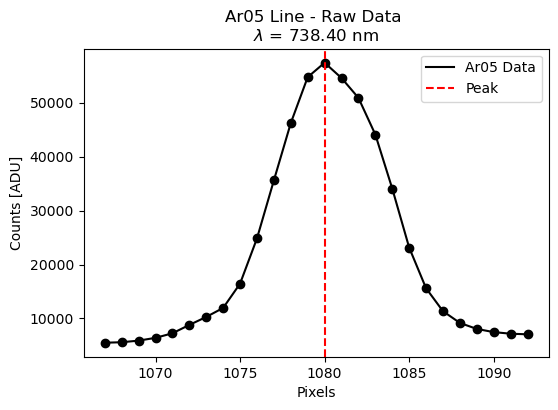

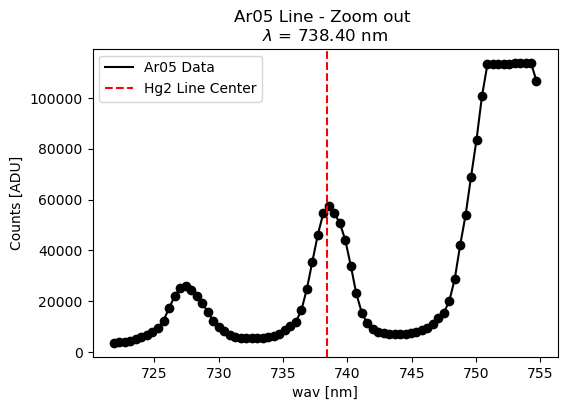

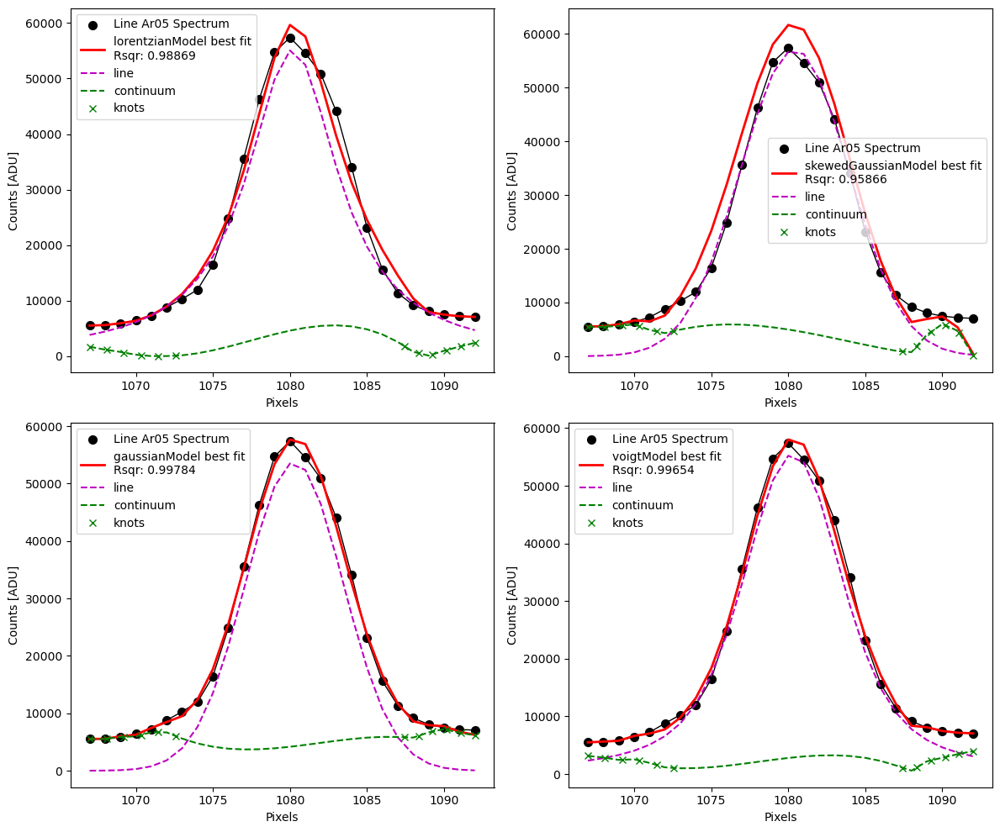

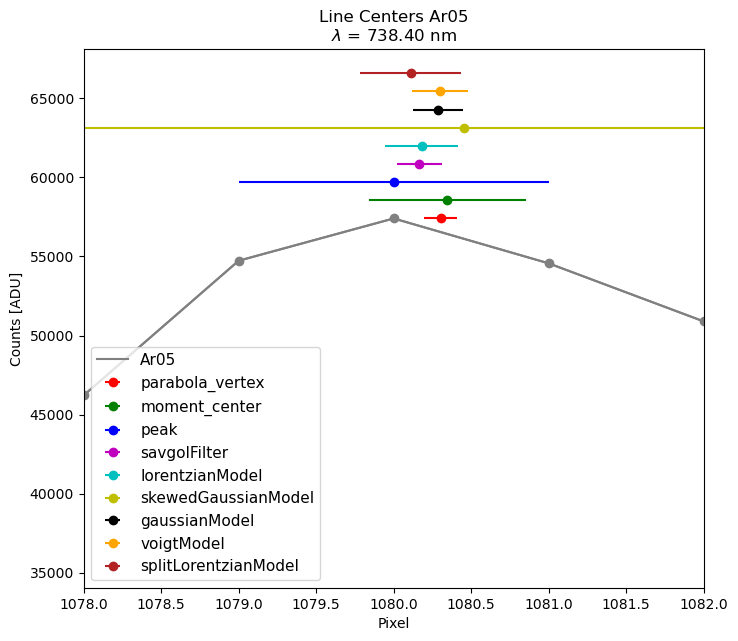

In [134]:
name = 'Ar05'
peak = 1080.0
exptime = 102

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=13)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=6)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar06

In [44]:
name = 'Ar06'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
11,2,750.3869,1109.0,7490.0,7.0,1109.171978,1108.958222,1108.966564,1.0,0.027678,0.05094,0.57241,100669.395762,/Users/esteves/Downloads/spectrometer_local/ex...,-6380.828022,Ar06


Dark subtraction
Flat fielding
Saving results to .//results/Ar06.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar06   750.3869       3  12307.378354  7.761919   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1109.042484  0.058172      NaN   1109.152259  ...            0.998327   

  gaussianModel                      voigtModel                      \
         center     error rsquared       center     error  rsquared   
0   1109.059677  0.121062  0.99836  1109.122474  0.259817  0.988844   

  splitLorentzianModel                      
                center     error  rsquared  
0          1109.231077  0.508237  0.965111  

[1 rows x 33 columns]

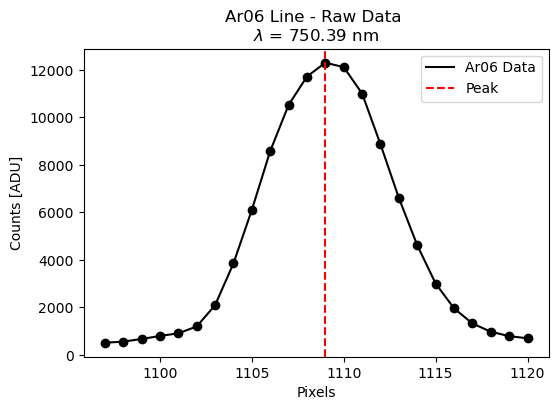

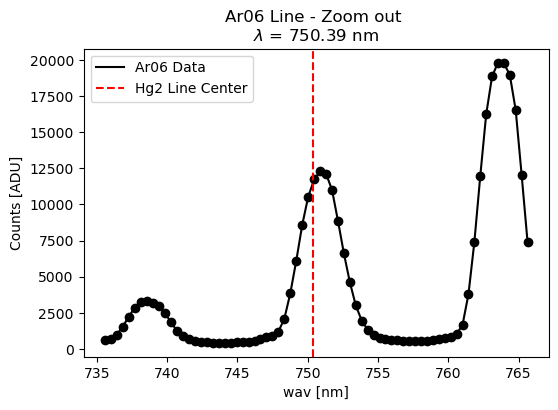

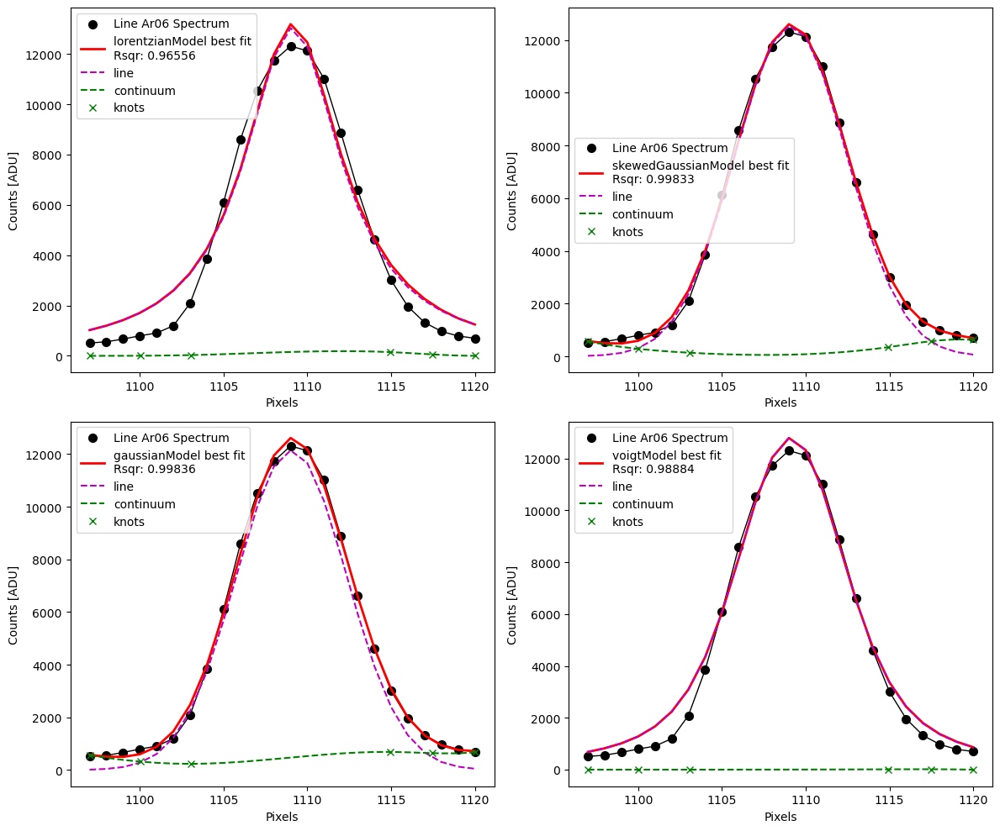

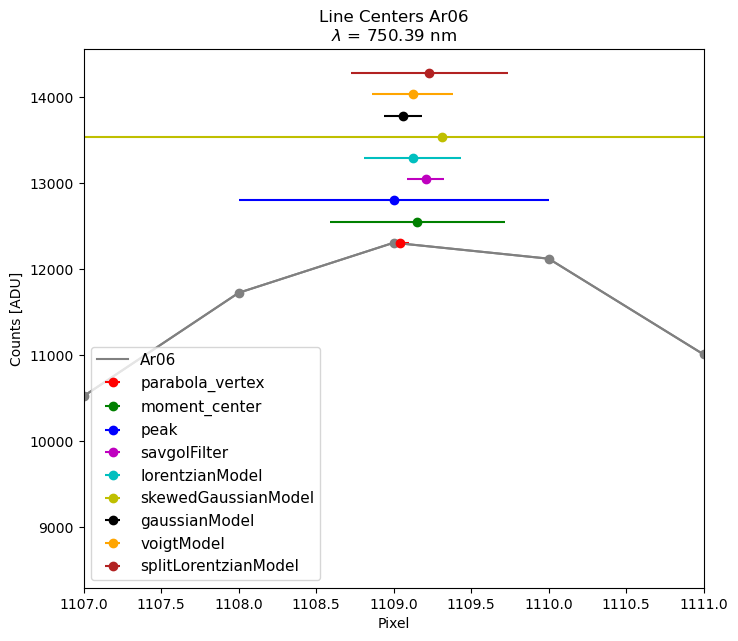

In [45]:
peak = 1109.0
exptime = 3

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=12)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2, nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar07

In [46]:
name = 'Ar07'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
12,2,763.511,1139.0,10398.0,7.0,1139.5228,1139.40637,1139.410519,1.0,0.042305,0.075217,0.549323,418524.09726,/Users/esteves/Downloads/spectrometer_local/ex...,-9258.4772,Ar07


Dark subtraction
Flat fielding
Saving results to .//results/Ar07.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar07    763.511       2  15172.376832  7.326627   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0      1139.47145  0.089624      NaN   1139.959312  ...            0.994309   

  gaussianModel                       voigtModel                    \
         center     error  rsquared       center    error rsquared   
0   1139.511081  0.075451  0.994309  1139.527876  0.11349   0.9825   

  splitLorentzianModel                      
                center     error  rsquared  
0          1139.429415  0.384279  0.953771  

[1 rows x 33 columns]

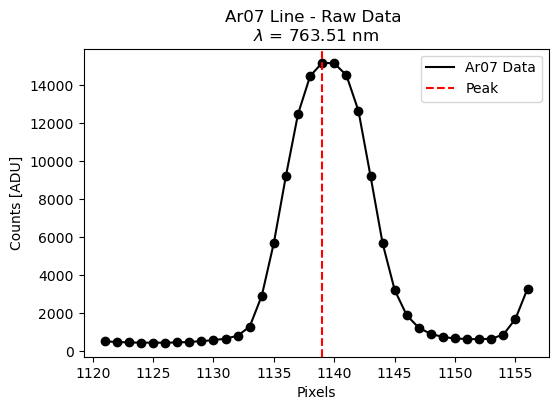

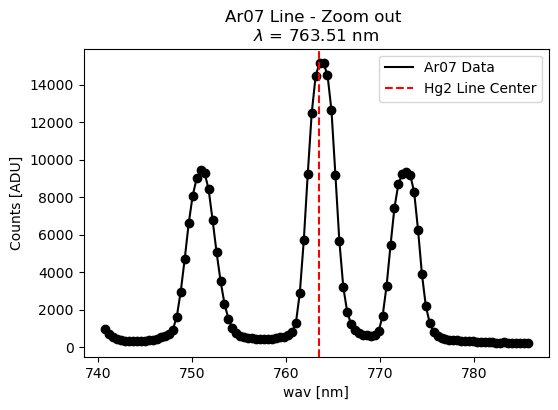

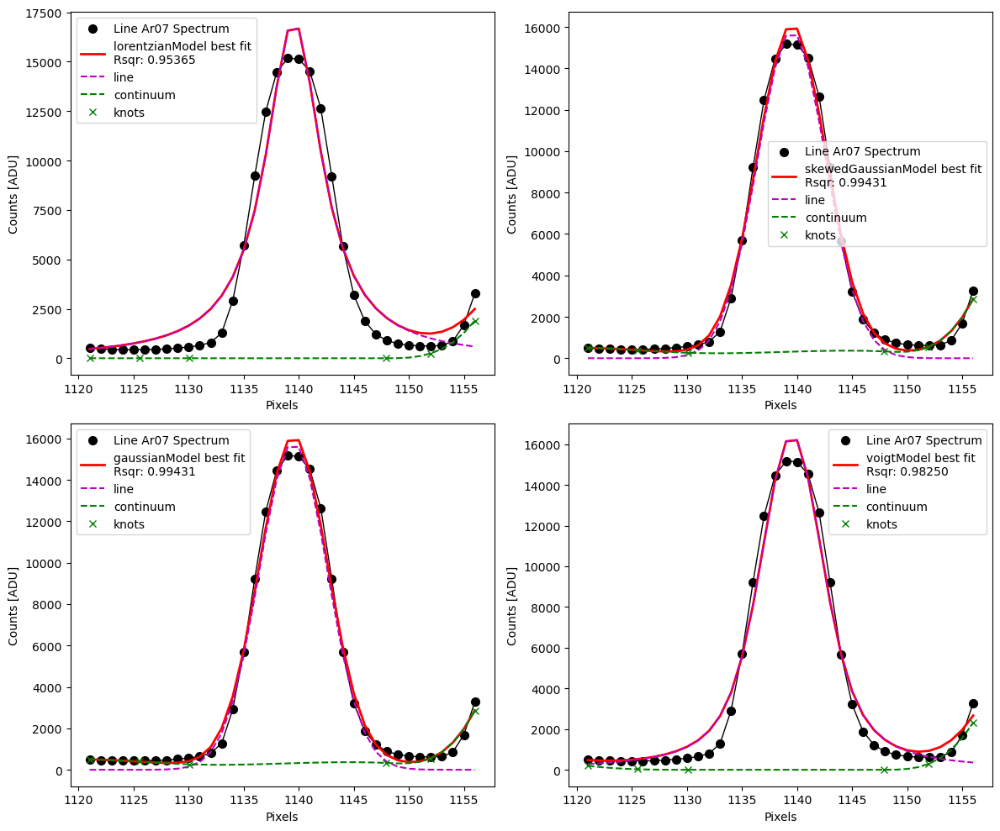

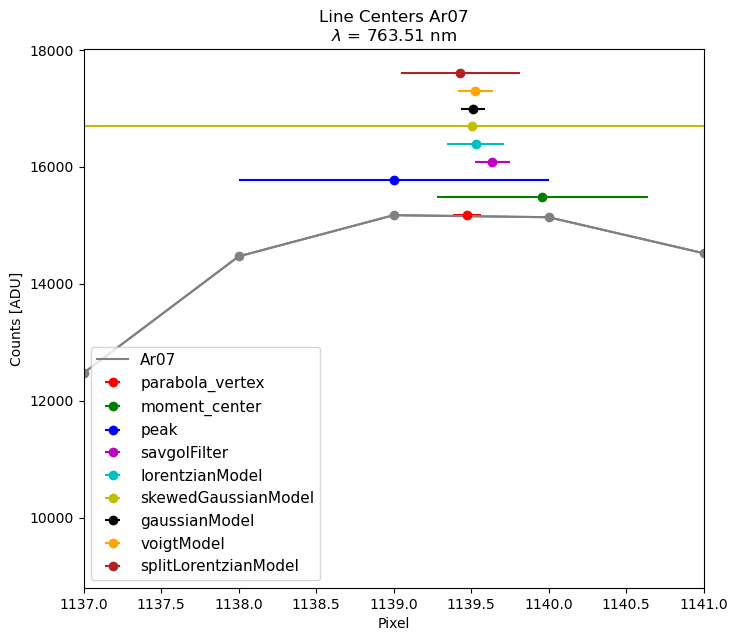

In [47]:
peak = 1139.0
exptime = 2

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3, nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar08

In [48]:
name = 'Ar08'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
13,2,772.3761,1161.0,6907.0,7.0,1160.803836,1160.594694,1160.56992,1.0,0.049857,0.085869,0.550726,153029.30619,/Users/esteves/Downloads/spectrometer_local/ex...,-5746.196164,Ar08


Dark subtraction
Flat fielding
Saving results to .//results/Ar08.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                  \
         timestamp  name wavelength exptime  peak_height      fwhm   
0  20250311T153442  Ar08    772.376       2  9365.581818  7.525617   

  parabola_vertex                   moment_center  ... skewedGaussianModel  \
           center    error rsquared        center  ...            rsquared   
0     1160.675416  0.03642      NaN   1160.618247  ...            0.992699   

  gaussianModel                     voigtModel                      \
         center     error rsquared      center     error  rsquared   
0   1160.713278  0.217039  0.99279  1160.69943  0.313877  0.976419   

  splitLorentzianModel                      
                center     error  rsquared  
0          1160.607967  0.694712  0.932042  

[1 rows x 33 columns]

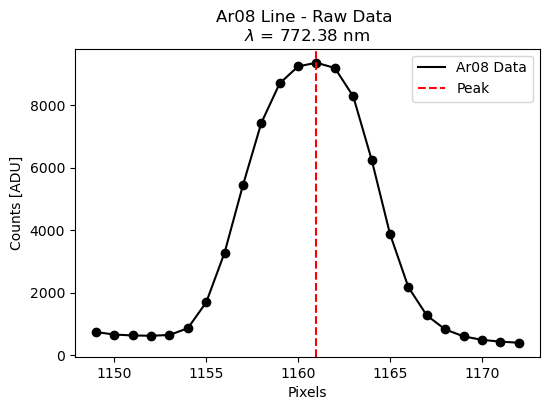

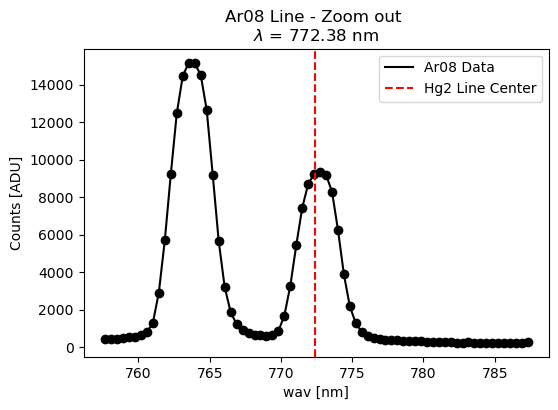

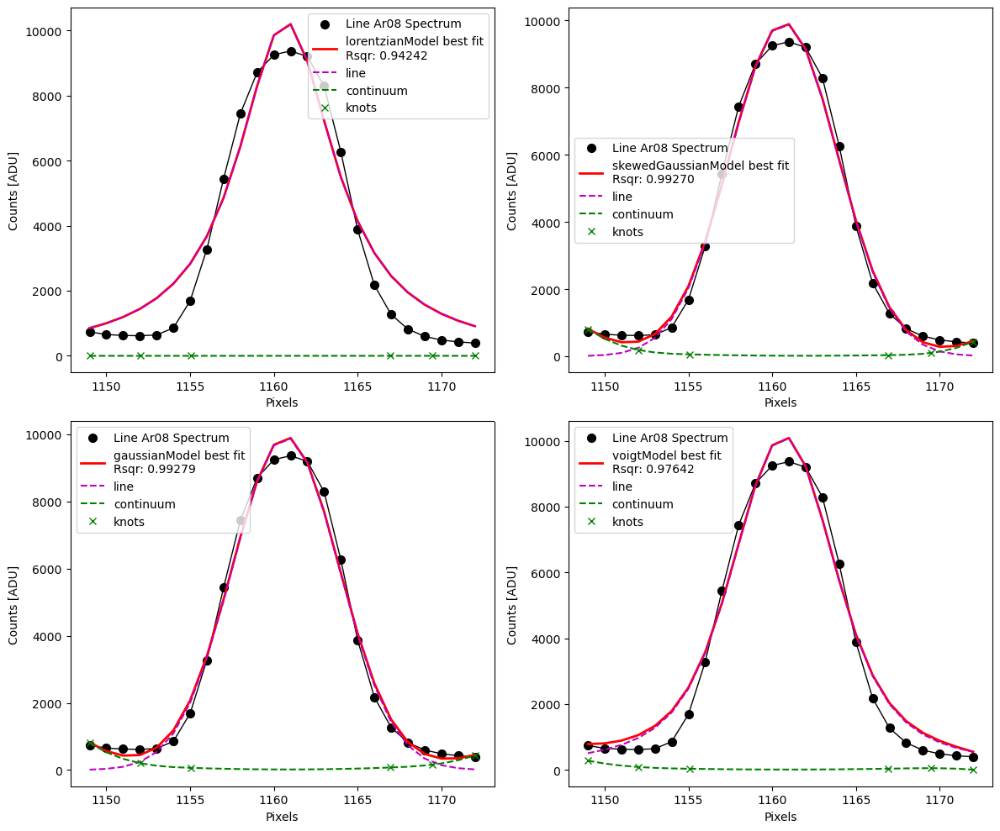

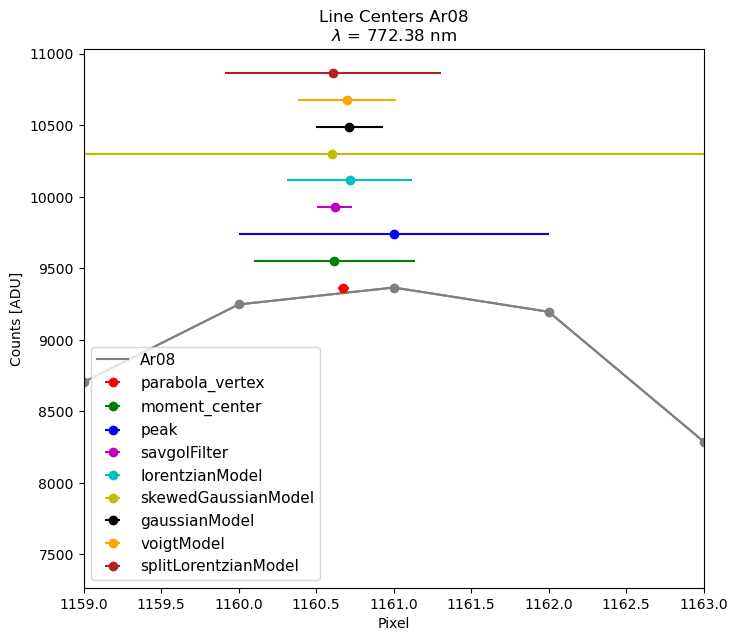

In [49]:
peak = 1161.0
exptime = 2

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=12)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2, nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar09

In [50]:
name = 'Ar09'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
14,2,794.8176,1215.0,4505.0,7.0,1214.927279,1214.655323,1215.536025,1.0,0.057898,0.237173,0.786041,84361.788801,/Users/esteves/Downloads/spectrometer_local/ex...,-3290.072721,Ar09


Dark subtraction
Flat fielding
Saving results to .//results/Ar09.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar09   794.8176      42  52190.598067  7.812997   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1214.742336  0.057841      NaN   1215.032508  ...            0.989527   

  gaussianModel                       voigtModel                     \
         center     error  rsquared       center    error  rsquared   
0   1214.773724  0.423489  0.989521  1214.908044  0.39947  0.978087   

  splitLorentzianModel                      
                center     error  rsquared  
0           1215.05043  0.702296  0.951557  

[1 rows x 33 columns]

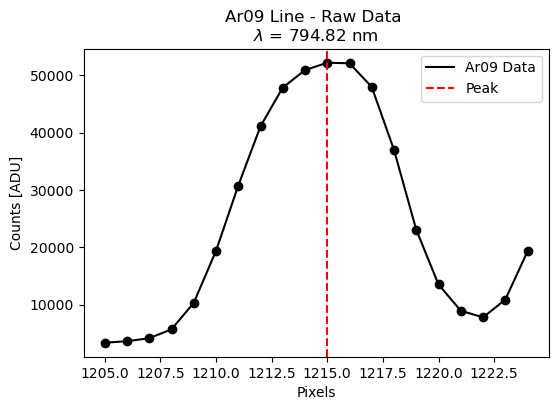

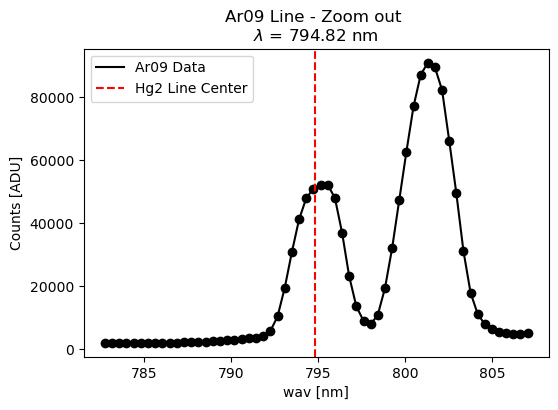

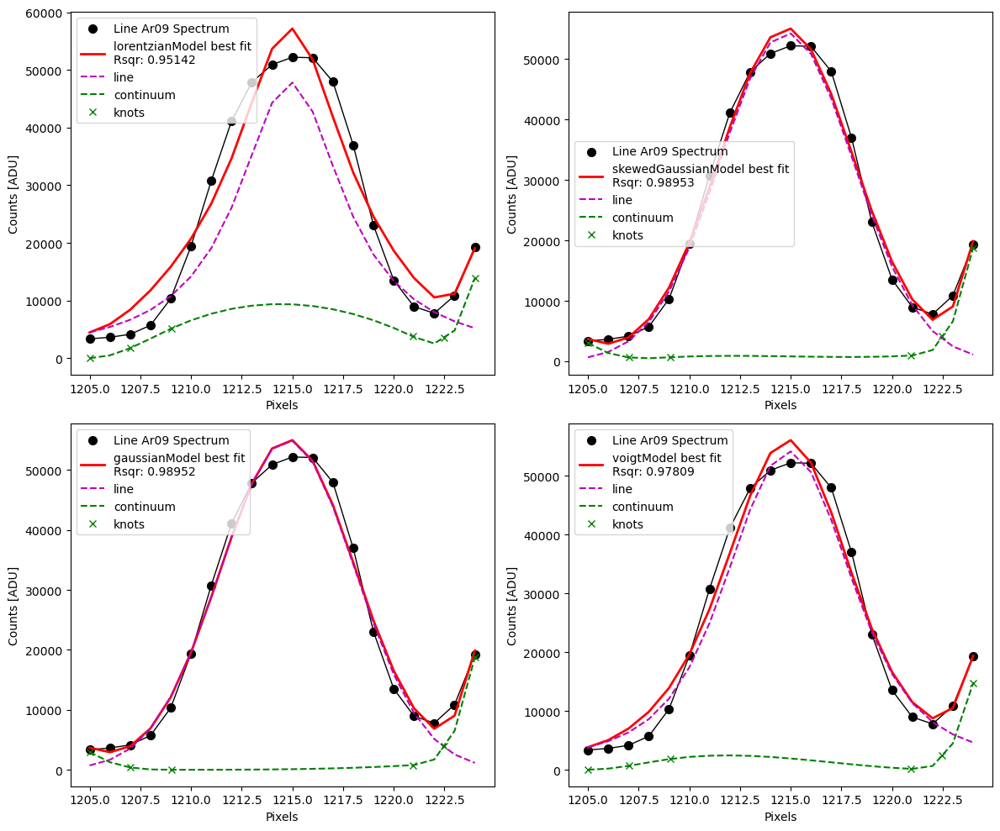

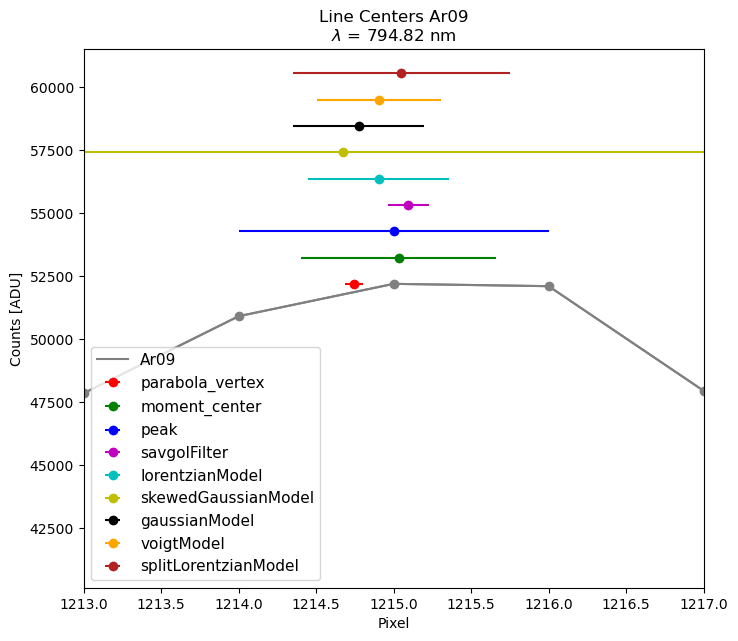

In [51]:
peak = 1215.0
exptime = 42

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=10)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2., nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

In [52]:
ar01.peak_height

52190.59806732903

## Ar10

In [132]:
name = 'Ar10'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
15,2,800.6158,1230.0,6026.0,7.0,1229.854622,1229.735443,1229.215501,1.0,0.036166,0.133893,0.753816,96481.989405,/Users/esteves/Downloads/spectrometer_local/ex...,-4796.145378,Ar10


Dark subtraction
Flat fielding


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


Saving results to .//results/Ar10.csv


line_info                                                    \
          timestamp  name wavelength exptime   peak_height       fwhm   
0   20250311T153442  Ar10    800.616      12  25928.954897   7.823318   
1   20250311T153442  Ar10    800.616       2   9824.924302   8.058579   
2   20250311T153442  Ar10    800.616       2   9824.924302  20.696543   
3   20250311T153442  Ar10    800.616       2   9824.924302  19.622577   
4   20250311T153442  Ar10    800.616       2   9824.924302   8.067247   
5   20250311T153442  Ar10    800.616       2   9824.924302   7.762884   
6   20250311T153442  Ar10    800.616       2   9824.924302  69.983897   
7   20250311T153442  Ar10    800.616       5  10637.454027  85.780944   
8   20250311T153442  Ar10    800.616       2   9824.924302   7.828521   
9   20250311T153442  Ar10    800.616     102  57404.572798   7.473093   
10  20250311T153442  Ar10    800.616     102  57404.572798   7.654707   
11  20250311T153442  Ar10    800.616       2   9824.924302   7.828521   

   parabola_vertex                    moment_center  ... skewedGaussianModel  \
            center     error rsquared        center  ...            rsquared   
0      1229.838155  0.046129      NaN   1227.174484  ...            0.997056   
1      1229.824982  0.044474      NaN   1229.303888  ...            0.996810   
2      1229.824982  0.044474      NaN   1228.115280  ...            0.959360   
3      1229.824982  0.044474      NaN   1228.153303  ...            0.993635   
4      1229.824982  0.044474      NaN   1228.153303  ...            0.987981   
5      1229.824982  0.044474      NaN   1228.153303  ...            0.995408   
6      1229.824982  0.044474      NaN   1227.655604  ...            0.996186   
7      1229.821267  0.044745      NaN   1227.648071  ...            0.996198   
8      1229.824982  0.044474      NaN   1228.153303  ...            0.996564   
9      1080.302786  0.104195      NaN   1080.346012  ...            0.997768   
10     1080.302786  0.104195      NaN   1080.346012  ...            0.997690   
11     1229.824982  0.044474      NaN   1228.153303  ...            0.996564   

   gaussianModel                             voigtModel                      \
          center           error  rsquared       center     error  rsquared   
0    1229.912858        0.119916  0.997057  1229.880225  0.200958  0.990537   
1    1229.851682        0.195028  0.996475  1229.920359  0.524309  0.960997   
2    1228.721864      468.575327  0.452443  1229.870229  0.208126  0.986654   
3    1229.164369      258.991765  0.466682  1229.711811  0.635361  0.937580   
4    1229.928429        0.252591  0.994557  1229.846316  0.277216  0.985333   
5    1229.914875        0.149981  0.995404  1229.864647  0.192332  0.989200   
6    1239.588300  3192130.353314  0.160208  1229.865429  0.264325  0.988853   
7    1240.753995  4494234.611134  0.155236  1229.862221  0.237175  0.988870   
8    1229.898139             NaN  0.996564  1229.866390  0.235920  0.989464   
9    1080.396319        0.078444  0.997475  1080.366594  0.094246  0.995976   
10   1080.382742        0.113864  0.997690  1080.380503  0.130559  0.996188   
11   1229.898139            None  0.996564  1229.866390  0.235920  0.989464   

   splitLorentzianModel                       
                 center      error  rsquared  
0           1230.221127   0.544028  0.966819  
1           1230.137154   0.526233  0.965096  
2           1229.732827  13.795853  0.568404  
3           1229.743906  16.916925  0.436449  
4           1230.321995   0.520711  0.964941  
5           1230.165606   0.483510  0.965937  
6           1230.125183   0.561999  0.963965  
7           1230.152162   0.592634  0.965218  
8           1230.163123   0.533106  0.966137  
9           1080.196841   0.260688  0.986529  
10          1080.189657   0.321295  0.986557  
11          1230.163123   0.533106  0.966137  

[12 rows x 33 columns]

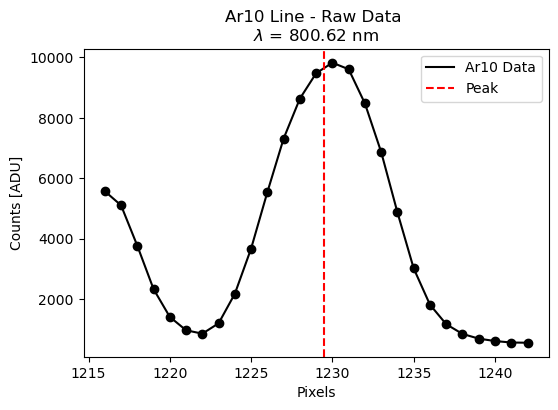

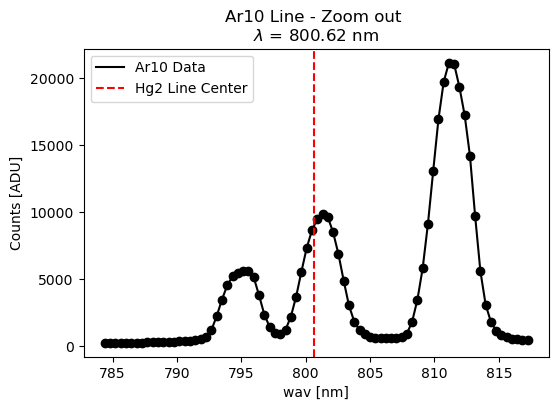

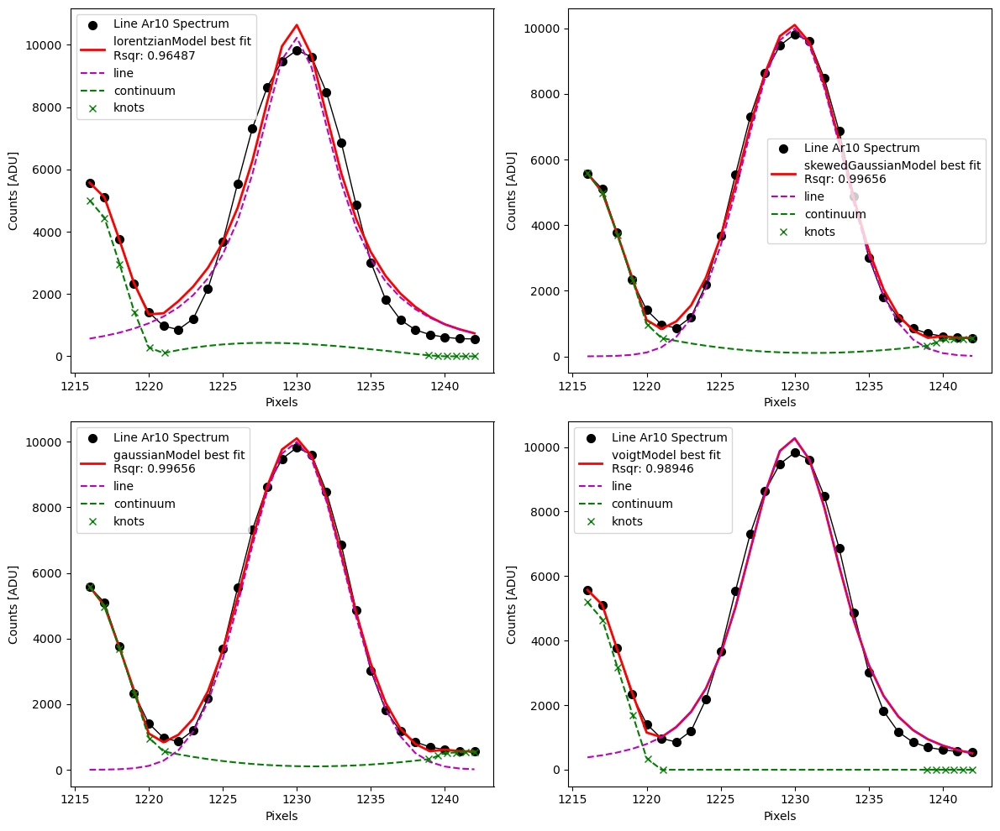

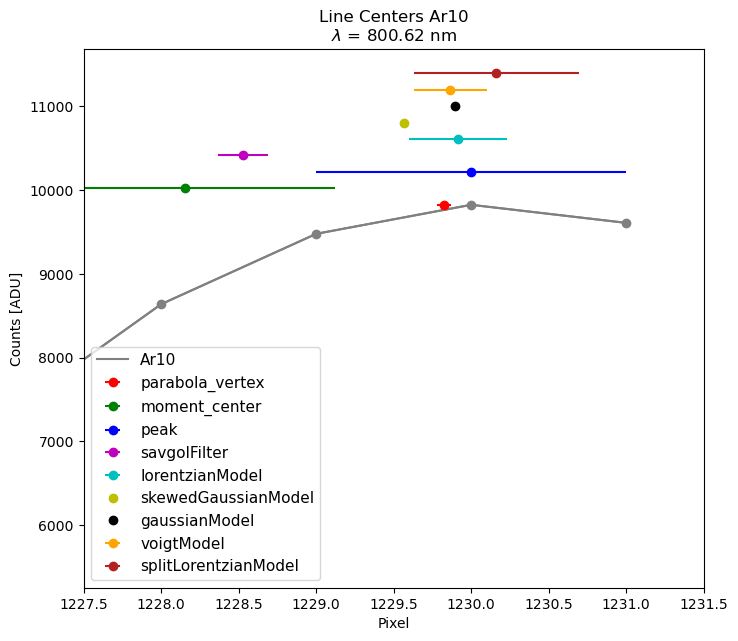

In [133]:
name = 'Ar10'
peak = 1229.5
exptime = 2

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=13.5)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3, nknots=6)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

In [123]:
ar01.peak_height

9824.924301936922

## Ar11

In [139]:
name = 'Ar11'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
16,2,811.143837,1254.0,10021.0,8.0,1254.494142,1254.530091,1254.505159,1.0,0.067855,0.05606,0.601561,279567.806197,/Users/esteves/Downloads/spectrometer_local/ex...,-8766.505858,Ar11


Dark subtraction
Flat fielding
Saving results to .//results/Ar11.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                    \
         timestamp  name wavelength exptime    peak_height      fwhm   
0  20250311T153442  Ar11    811.531       2   21138.957140  8.368512   
1  20250311T153442  Ar11    811.531       2   21138.957140  8.104565   
2  20250311T153442  Ar11    811.531       2   21138.957140  8.055279   
3  20250311T153442  Ar11    811.531       2  103807.961729  7.751469   
4  20250311T153442  Ar11    811.531       2   21138.957140  8.055279   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1254.439379  0.145046      NaN   1254.425885  ...            0.996787   
1     1254.439379  0.145046      NaN   1254.425885  ...            0.998041   
2     1254.439379  0.145046      NaN   1254.425885  ...            0.997917   
3       69.557327  0.146888      NaN     69.684309  ...            0.985174   
4     1254.439379  0.145046      NaN   1254.425885  ...            0.997917   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1254.542292  0.167739  0.991268  1254.523480  0.278444  0.971645   
1   1254.552807  0.107512  0.998041  1254.543842  0.197193  0.986194   
2   1254.546679  0.069955  0.997917  1254.543794  0.151567  0.986194   
3     69.635332  0.427786  0.982009    69.600359  0.299097  0.972881   
4   1254.546679  0.069955  0.997917  1254.543794  0.151567  0.986194   

  splitLorentzianModel                      
                center     error  rsquared  
0          1254.493687  0.522965  0.948062  
1          1254.473548  0.454153  0.962051  
2          1254.509093  0.436133  0.959146  
3            69.533505  0.781680  0.910342  
4          1254.509093  0.436133  0.959146  

[5 rows x 33 columns]

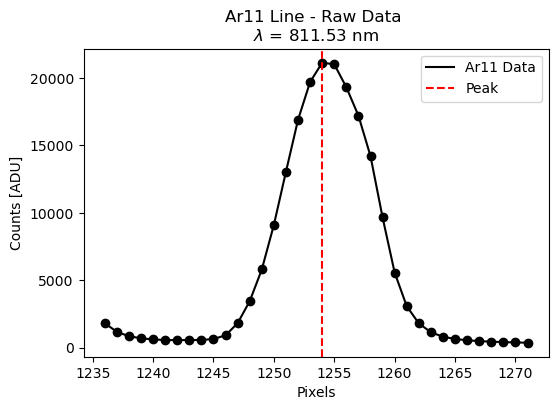

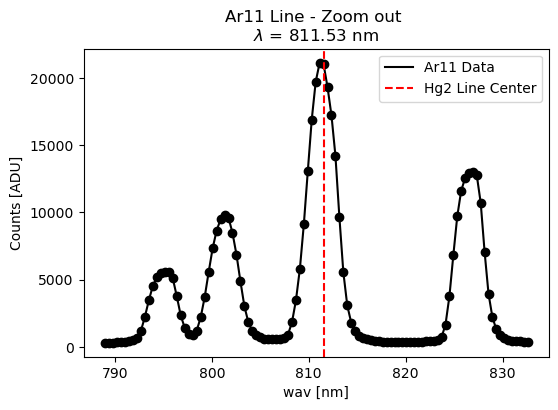

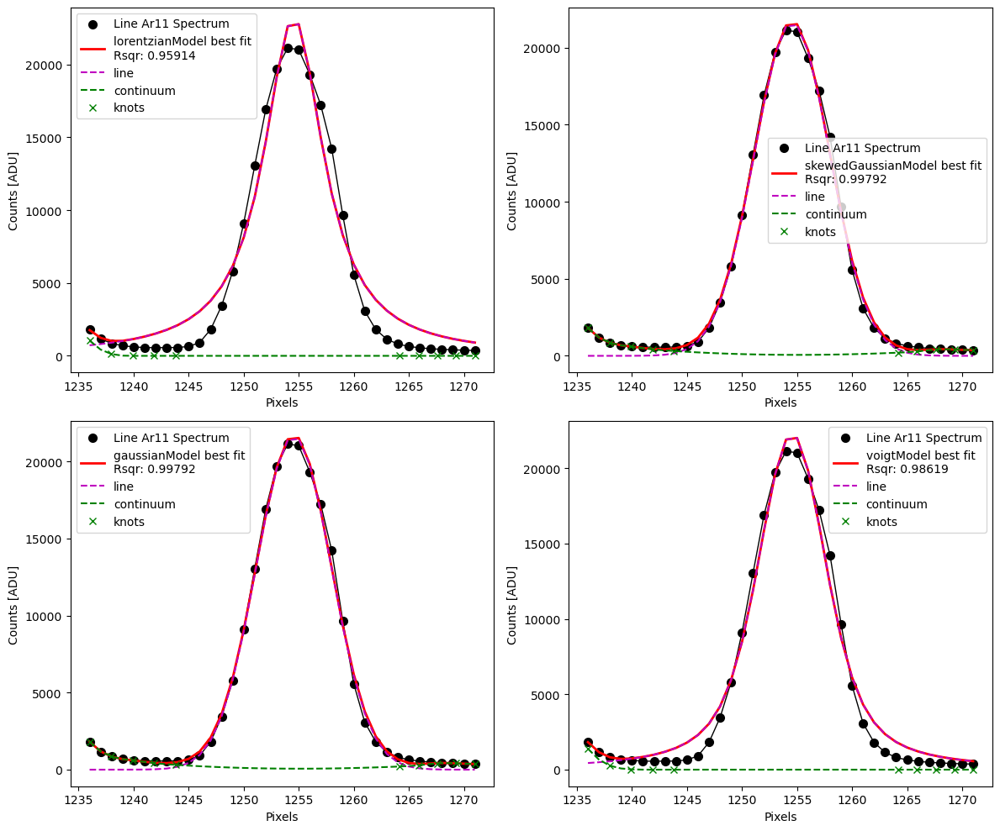

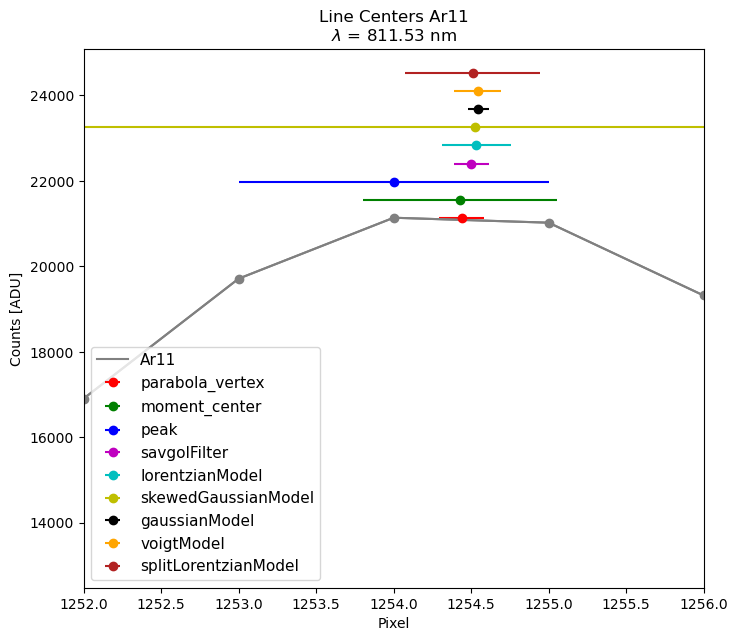

In [140]:
name = 'Ar11'
peak = 1254.0
exptime = 2

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3, nknots=5)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar12

In [95]:
name = 'Ar12'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
17,2,826.4518,1293.0,6967.0,8.0,1292.148759,1292.048974,1292.010276,1.0,0.107917,0.099744,0.56532,186667.02116,/Users/esteves/Downloads/spectrometer_local/ex...,-5674.851241,Ar12


Dark subtraction
Flat fielding
Saving results to .//results/Ar12.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar12   826.4518       2  21138.957140  8.397801   
1  20250311T153442  Ar12   826.4518       2  21138.957140  8.389557   
2  20250311T153442  Ar12   826.4518       2  21138.957140  8.368512   
3  20250311T153442  Ar12   826.4518       2  13004.242058  7.633694   
4  20250311T153442  Ar12   826.4518      17  71504.199396  9.212334   
5  20250311T153442  Ar12   826.4518      12  50336.092052  9.364553   
6  20250311T153442  Ar12   826.4518       2  13004.242058  7.633694   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1254.439379  0.145046      NaN   1254.456908  ...            0.991071   
1     1254.439379  0.145046      NaN   1254.484078  ...            0.990390   
2     1254.439379  0.145046      NaN   1254.425885  ...            0.996787   
3     1292.174152  0.078822      NaN   1292.160124  ...            0.989467   
4     1330.053618  0.146581      NaN   1330.083972  ...            0.995676   
5     1330.024270  0.144512      NaN   1330.059442  ...            0.995731   
6     1292.174152  0.078822      NaN   1292.160124  ...            0.989467   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1254.505359  0.531942  0.974204  1254.507674  0.563052  0.963370   
1   1254.507579  0.184380  0.992805  1254.521927  0.526891  0.928920   
2   1254.542292  0.167739  0.991268  1254.523480  0.278444  0.971645   
3   1292.142061  0.147059  0.989439  1292.125842  0.241927  0.967955   
4   1330.171028  0.106741  0.995874  1330.095935  0.235352  0.976862   
5   1330.122146  0.111913  0.995702  1330.132657  0.322498  0.965645   
6   1292.142061  0.147059  0.989439  1292.125842  0.241927  0.967955   

  splitLorentzianModel                      
                center     error  rsquared  
0          1254.511651  0.663914  0.947650  
1          1254.483605  0.473446  0.956530  
2          1254.493687  0.522965  0.948062  
3          1292.178377  0.792582  0.884686  
4          1330.043751  0.656887  0.924536  
5          1330.044041  0.582789  0.946358  
6          1292.178377  0.792582  0.884686  

[7 rows x 33 columns]

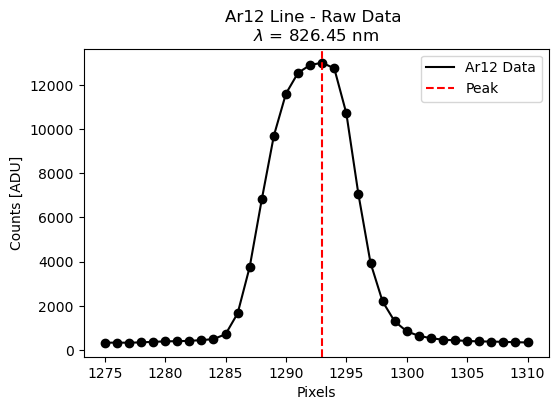

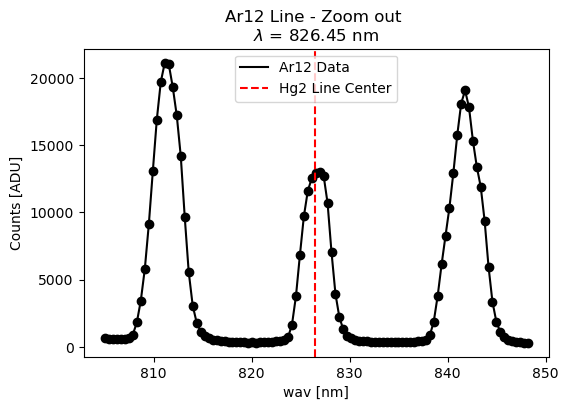

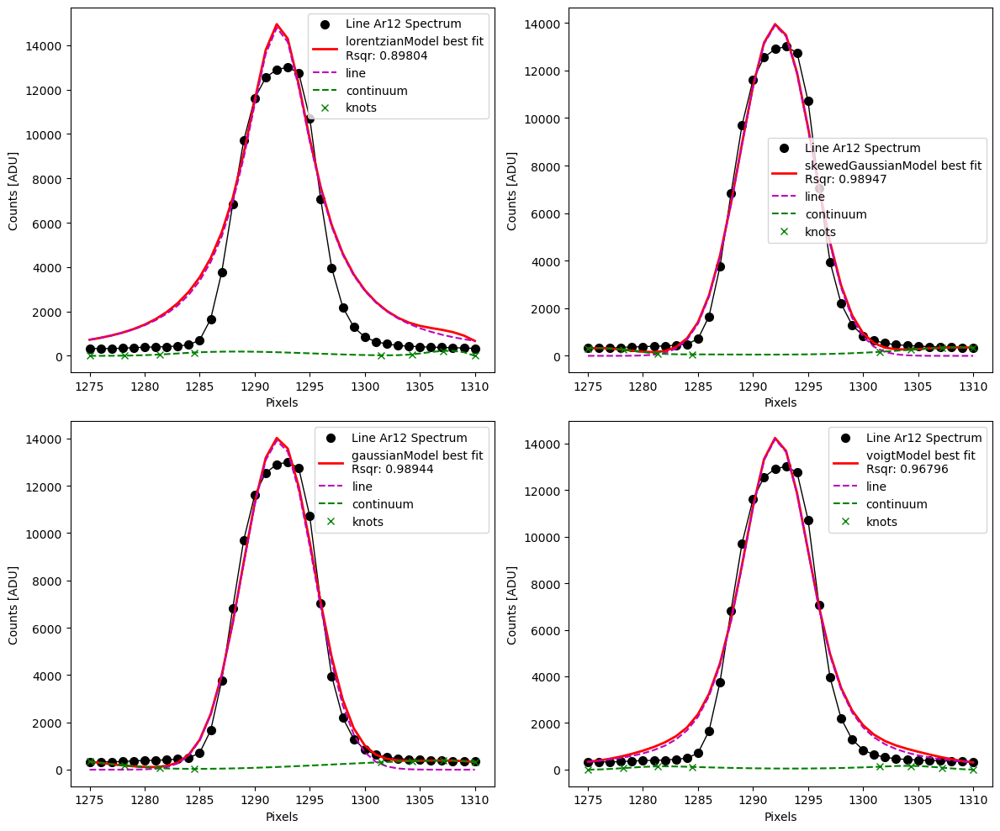

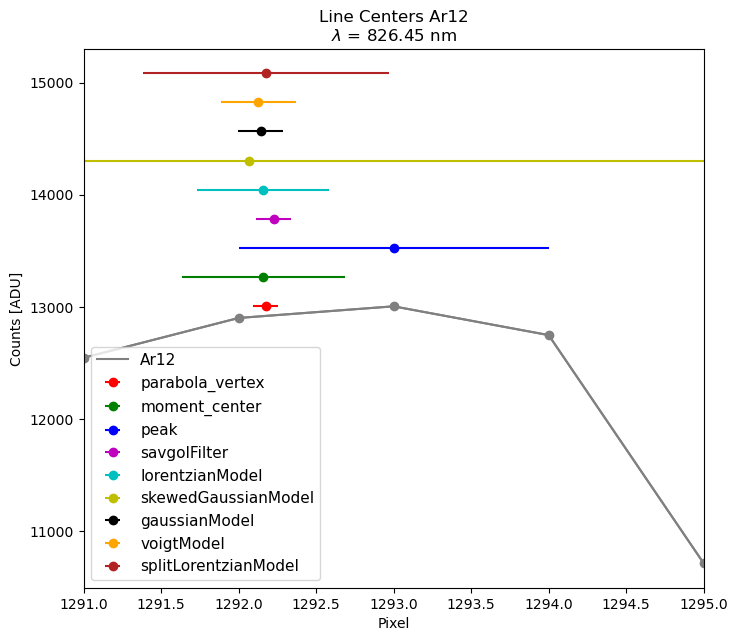

In [96]:
peak = 1293.0
exptime = 2

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar13

In [109]:
name = 'Ar13'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
18,2,841.6429,1330.0,9199.0,9.0,1330.039028,1330.031003,1329.99825,1.0,0.143976,0.076439,0.674084,157323.136365,/Users/esteves/Downloads/spectrometer_local/ex...,-7868.960972,Ar13


Dark subtraction
Flat fielding
Saving results to .//results/Ar13.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                    \
         timestamp  name wavelength exptime    peak_height      fwhm   
0  20250311T153442  Ar13    842.465      32  132220.726786  9.557518   
1  20250311T153442  Ar13    842.465      17   71504.199396  9.212334   
2  20250311T153442  Ar13    842.465      12   50336.092052  9.364553   
3  20250311T153442  Ar13    842.465      32  132220.726786  9.301464   
4  20250311T153442  Ar13    842.465      22    5555.787023  7.068903   
5  20250311T153442  Ar13    842.465      22    5555.787023  7.064313   
7  20250311T153442  Ar13    842.465      32  132220.726786  9.557518   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1330.228458  0.168916      NaN   1330.311159  ...            0.995144   
1     1330.053618  0.146581      NaN   1330.083972  ...            0.995676   
2     1330.024270  0.144512      NaN   1330.059442  ...            0.995731   
3     1330.228458  0.168916      NaN   1330.311159  ...            0.995323   
4     1054.134526  0.103847      NaN   1054.292642  ...            0.998332   
5     1054.134526  0.103847      NaN   1054.273710  ...            0.996757   
7     1330.228458  0.168916      NaN   1330.311159  ...            0.995144   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1330.335599  0.131834  0.994658  1330.372444  0.254365  0.975299   
1   1330.171028  0.106741  0.995874  1330.095935  0.235352  0.976862   
2   1330.122146  0.111913  0.995702  1330.132657  0.322498  0.965645   
3   1330.387226  0.210577  0.995323  1330.332652  0.254875  0.982902   
4   1054.103576  0.083111  0.996643  1054.046919  0.083351  0.996632   
5   1054.108507  0.075119  0.996757  1054.065340  0.076505  0.996699   
7   1330.335599  0.131834  0.994658  1330.372444  0.254365  0.975299   

  splitLorentzianModel                      
                center     error  rsquared  
0          1330.356842  0.576483  0.949430  
1          1330.043751  0.656887  0.924536  
2          1330.044041  0.582789  0.946358  
3          1330.210700  0.495487  0.962534  
4          1053.668947  0.116574  0.997209  
5          1053.687029  0.113567  0.997162  
7          1330.356842  0.576483  0.949430  

[7 rows x 33 columns]

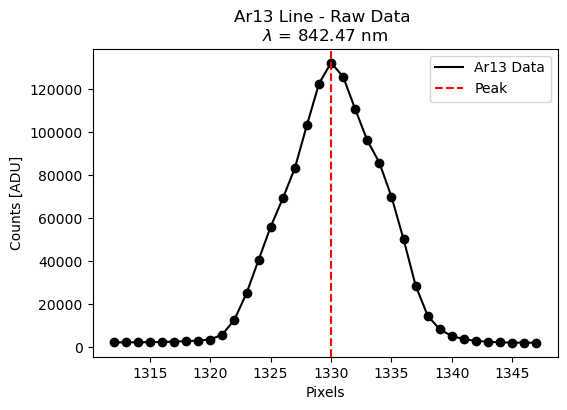

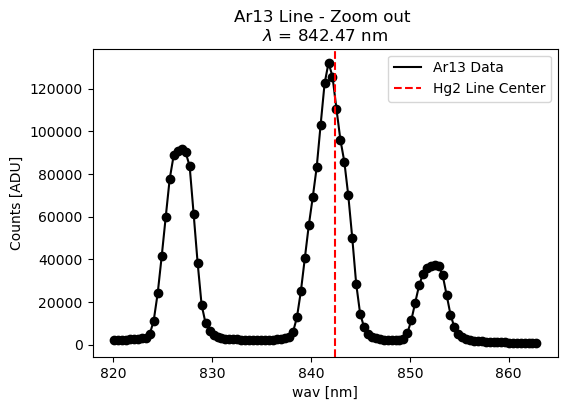

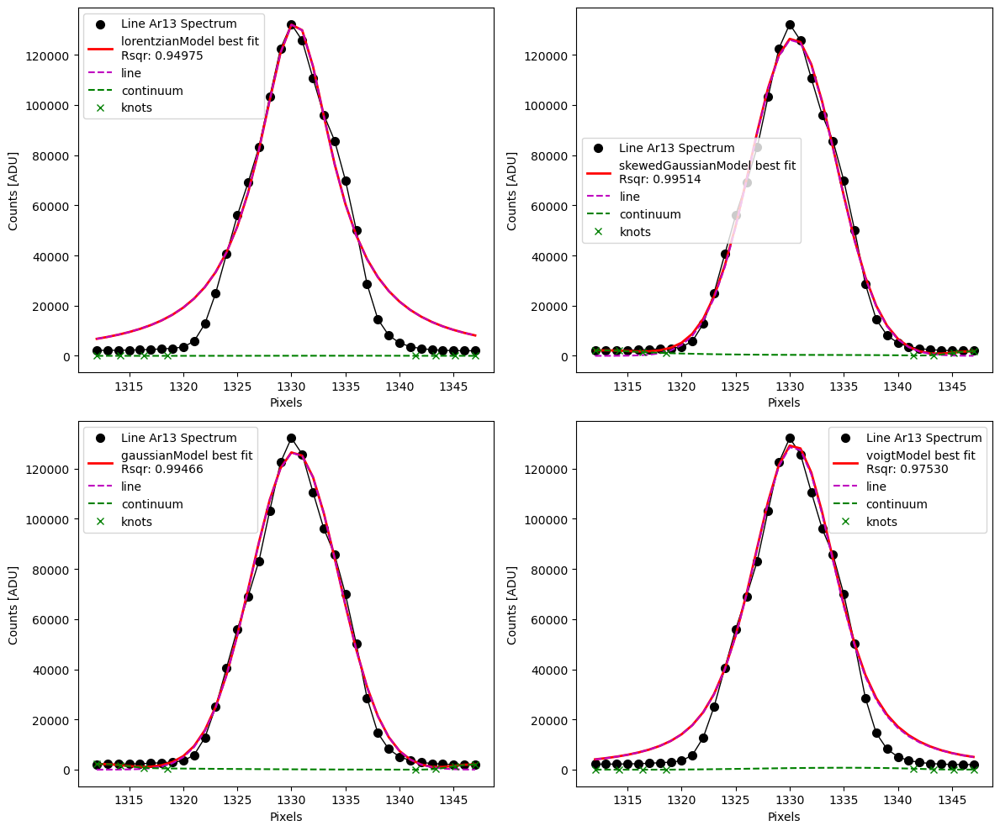

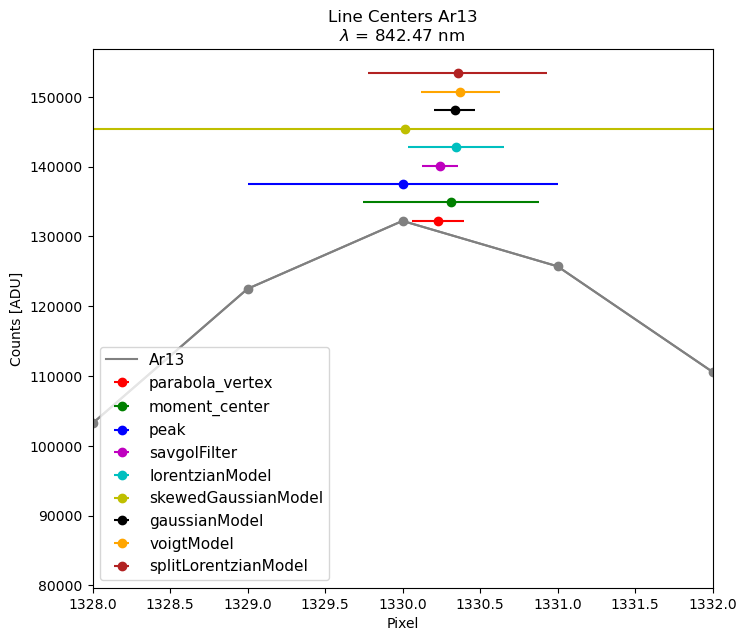

In [111]:
name = 'Ar13'
peak = 1330.0
exptime = 32

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3.0, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar14

In [200]:
name = 'Ar14'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
19,32,866.794,1394.0,4733.0,8.0,1393.48181,1393.24794,1393.233905,1.0,0.121836,0.120134,0.553404,45861.674213,/Users/esteves/Downloads/spectrometer_local/ex...,-3339.51819,Ar14


Dark subtraction
Flat fielding


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


Saving results to .//results/Ar14.csv


line_info                                                     \
          timestamp  name wavelength exptime   peak_height        fwhm   
0   20250311T153442  Ar14    852.144      27   6280.213929    8.448609   
1   20250311T153442  Ar14    852.144      27   6280.213929    8.529557   
2   20250311T153442  Ar14    852.144      27   6280.213929    8.488595   
3   20250311T153442  Ar14    852.144      27   6280.213929    8.481423   
4   20250311T153442  Ar14    852.144      27  31513.227310    5.130365   
5   20250311T153442  Ar14    852.144      27  31513.227310  247.972096   
6   20250311T153442  Ar14    852.144      37  43272.874531  176.650632   
7   20250311T153442  Ar14    852.144      37  43272.874531    8.042279   
8   20250311T153442  Ar14    852.144      37  43272.874531    7.955204   
9   20250311T153442  Ar14    852.144      42  49151.329786    7.962407   
10  20250311T153442  Ar14    852.144      42  49151.329786    7.960620   
11  20250311T153442  Ar14    852.144      42  49151.329786    7.960620   

   parabola_vertex                    moment_center  ... skewedGaussianModel  \
            center     error rsquared        center  ...            rsquared   
0      1393.526812  0.158742      NaN   1392.676862  ...            0.987809   
1      1393.526812  0.158742      NaN   1393.299145  ...            0.988925   
2      1393.526812  0.158742      NaN   1393.228569  ...            0.988828   
3      1393.526812  0.158742      NaN   1393.173092  ...            0.988668   
4      1356.280166  0.062683      NaN   1354.202523  ...            0.757179   
5      1356.280166  0.062683      NaN   1354.031154  ...           -0.224893   
6      1356.300071  0.060545      NaN   1353.251738  ...            0.076162   
7      1356.300071  0.060545      NaN   1353.251738  ...            0.967715   
8      1356.300071  0.060545      NaN   1356.150642  ...            0.988471   
9      1356.310627  0.059351      NaN   1356.160090  ...            0.988571   
10     1356.310627  0.059351      NaN   1356.181216  ...            0.988679   
11     1356.310627  0.059351      NaN   1356.181216  ...            0.988679   

   gaussianModel                           voigtModel                 \
          center         error  rsquared       center          error   
0    1393.340389  3.277466e-01  0.987809  1393.415084       0.272920   
1    1393.431040  2.960292e-01  0.988925  1393.481146       0.296049   
2    1393.426094  2.547745e-01  0.988828  1393.456601       0.268142   
3    1393.421861  2.325397e-01  0.988668  1393.427664       0.249162   
4    1333.499034  7.104633e+00  0.760957  1333.050901      11.093568   
5    1360.528861  4.140502e+08 -1.831701  1371.995547  127377.207217   
6    1358.144848  2.554002e+08  0.258860  1355.248534    1913.090608   
7    1356.288345  2.055375e-01  0.967728  1356.287771       0.236616   
8    1356.318383  1.651558e-01  0.988471  1356.323548       0.216371   
9    1356.330922  1.630484e-01  0.988571  1356.335819       0.216404   
10   1356.326576  1.565114e-01  0.988679  1356.335578       0.210387   
11   1356.326576  1.565114e-01  0.988679  1356.335578       0.210387   

             splitLorentzianModel                          
    rsquared               center         error  rsquared  
0   0.983573          1393.283191  4.215914e-01  0.965877  
1   0.983807          1393.216030  3.496889e-01  0.970039  
2   0.983648          1393.171578  4.135461e-01  0.969589  
3   0.983639          1393.059104  4.250840e-01  0.968395  
4   0.762422          1333.045416  9.588877e+00  0.758975  
5   0.220861          1356.374711  5.558382e-01  0.939286  
6   0.409160          1371.997031  6.887840e+07  0.259816  
7   0.950534          1342.358687  2.702717e+03  0.116898  
8   0.974663          1356.614674  5.560687e-01  0.941749  
9   0.974745          1356.626080  5.563276e-01  0.941818  
10  0.974951          1356.664095  5.550689e-01  0.942267  
11  0.974951          1356.664095  5.550689e-01  0.942267  

[1

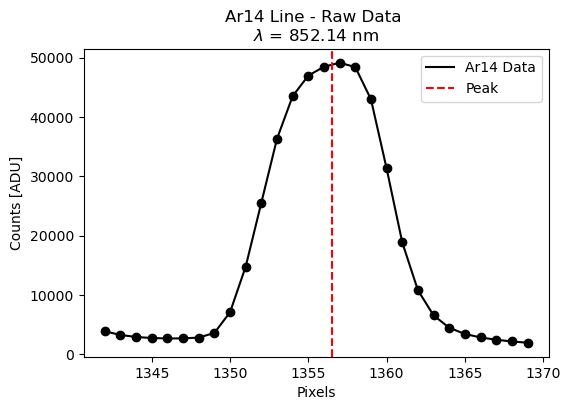

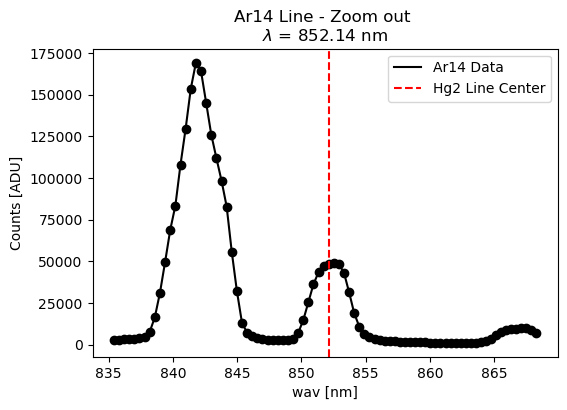

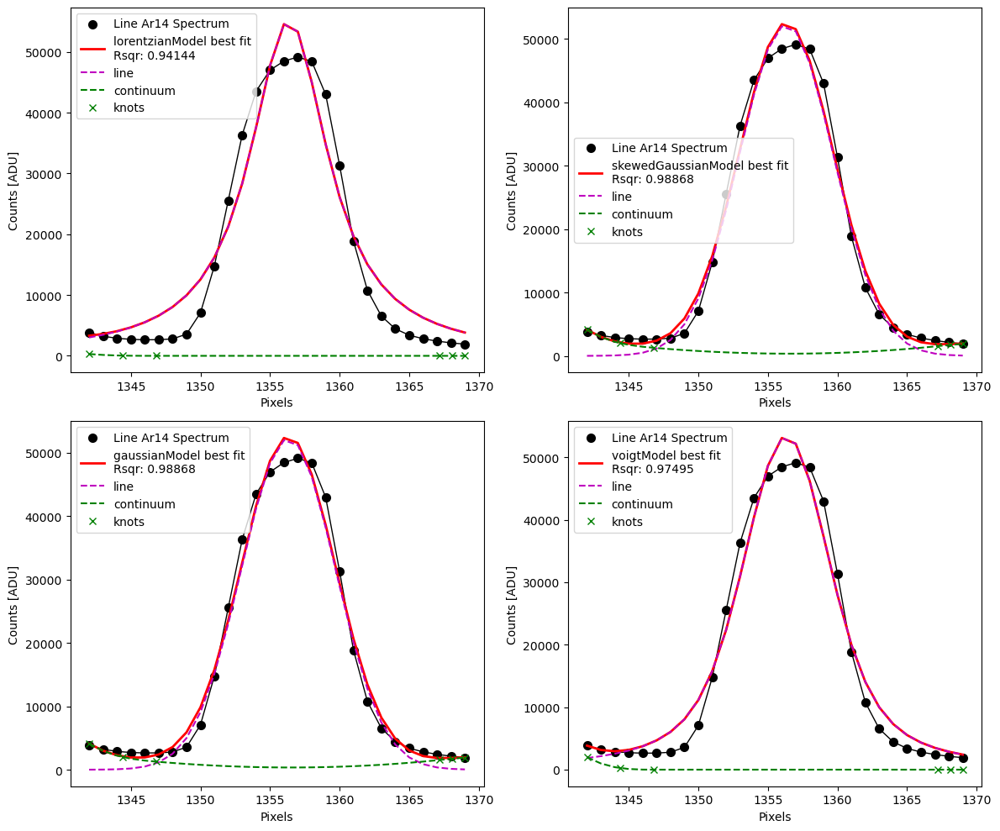

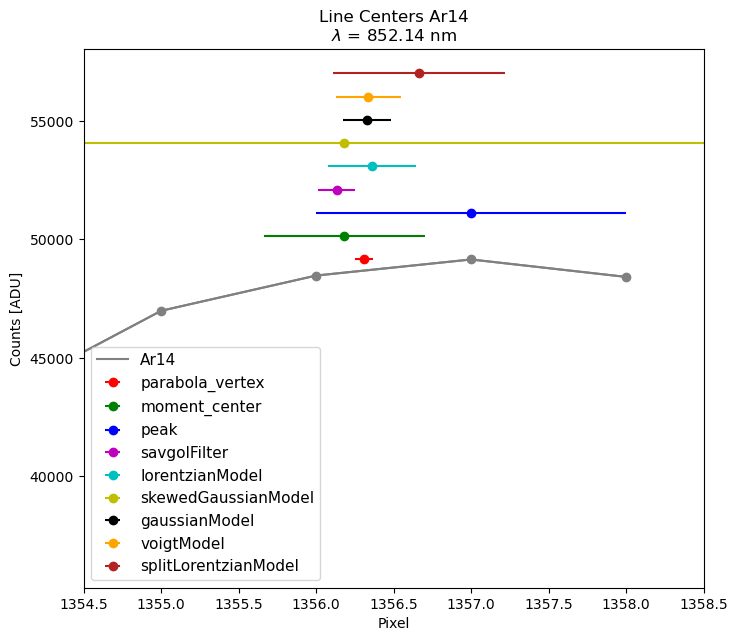

In [219]:
name = 'Ar14'

peak = 1356.5
exptime = 42

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=14)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3.0, nknots=3)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar15

In [202]:
name = 'Ar15'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
20,2,912.2967,1512.0,11017.0,9.0,1510.841125,1510.782938,1510.774372,1.0,0.201453,0.138019,0.595365,984203.208661,/Users/esteves/Downloads/spectrometer_local/ex...,-9506.158875,Ar15


Dark subtraction
Flat fielding
Saving results to .//results/Ar15.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar15    866.794       2  40966.015354  8.236525   
1  20250311T153442  Ar15    866.794      42   9775.861073  8.442645   
2  20250311T153442  Ar15    866.794      82  19381.421388  8.459521   
3  20250311T153442  Ar15    866.794     122  28849.546003  8.456326   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1510.972198  0.117097      NaN   1510.849418  ...            0.980002   
1     1393.527310  0.158933      NaN   1392.685061  ...            0.987564   
2     1393.538458  0.157276      NaN   1392.709388  ...            0.987651   
3     1393.553285  0.154470      NaN   1392.721779  ...            0.987800   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1510.887049  0.311141  0.980002  1510.900465  0.347118  0.954038   
1   1393.345251  0.329965  0.987564  1393.421027  0.278012  0.983170   
2   1393.349800  0.285148  0.987651  1393.420954  0.275544  0.983774   
3   1393.364171  0.275114  0.987800  1393.434342  0.272361  0.983874   

  splitLorentzianModel                      
                center     error  rsquared  
0          1511.375612  0.680257  0.914078  
1          1393.278024  0.426744  0.965282  
2          1393.325830  0.414710  0.966529  
3          1393.328959  0.414726  0.966620  

[4 rows x 33 columns]

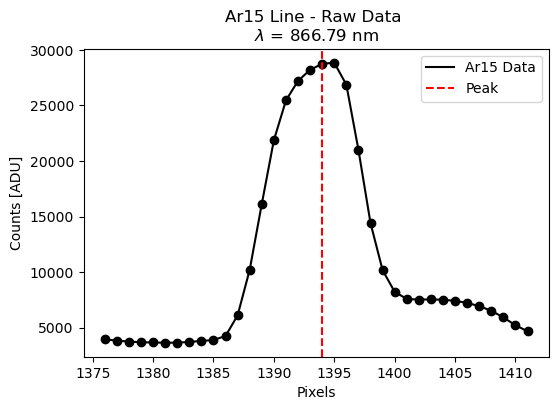

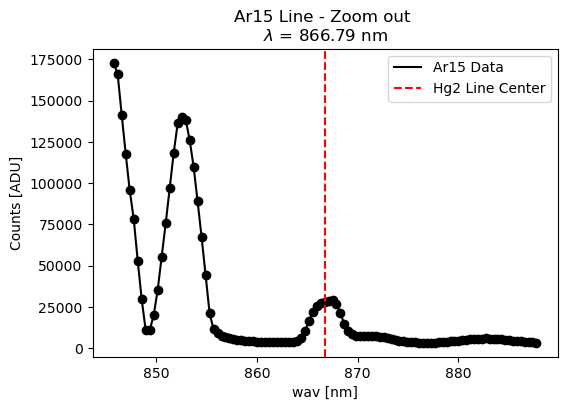

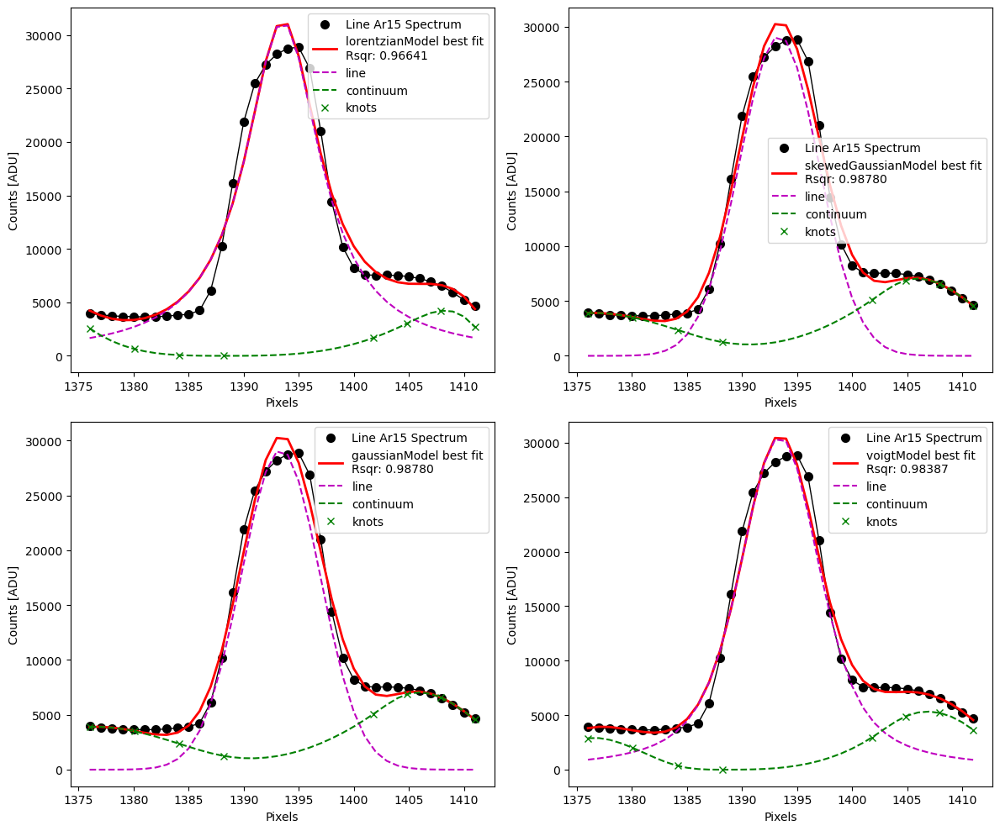

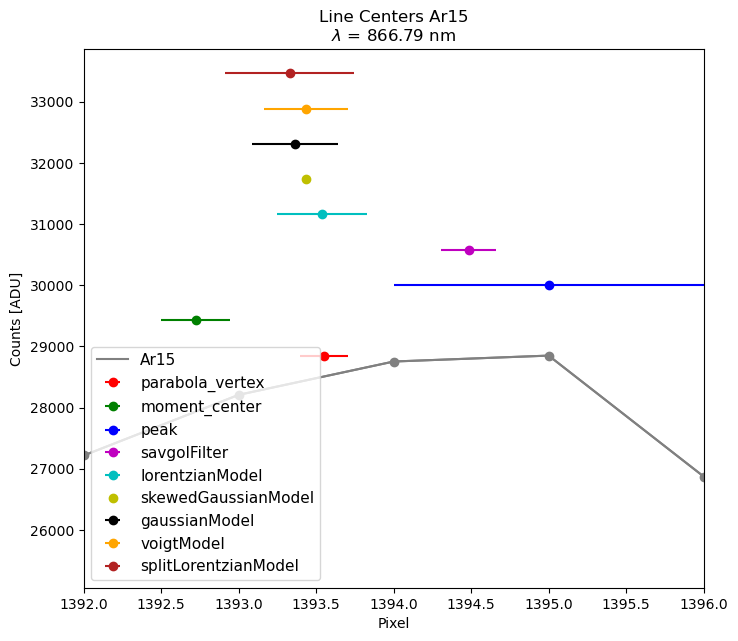

In [225]:
name = 'Ar15'
peak = 1394.0
exptime = 122

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.0, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar16

In [204]:
name = 'Ar16'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
21,3,922.4499,1539.0,4574.0,9.0,1537.512306,1537.590706,1537.585289,1.0,0.159316,0.142804,0.589081,67157.516133,/Users/esteves/Downloads/spectrometer_local/ex...,-3036.487694,Ar16


Dark subtraction
Flat fielding
Saving results to .//results/Ar16.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar16   912.2967       3  11669.850371  8.603585   
2  20250311T153442  Ar16   912.2967       3  53432.510441  8.231936   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1537.698513  0.144916      NaN   1537.634194  ...            0.979970   
2     1510.983071  0.115508      NaN   1510.860312  ...            0.980114   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1537.598546  0.365612  0.979970  1537.614753  0.362617  0.961035   
2   1510.899169  0.308949  0.980114  1510.912571  0.346464  0.954014   

  splitLorentzianModel                      
                center     error  rsquared  
0          1538.419449  0.648090  0.927548  
2          1511.381446  0.680106  0.913963  

[2 rows x 33 columns]

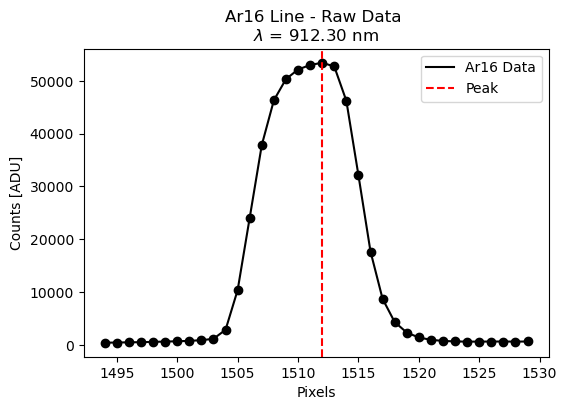

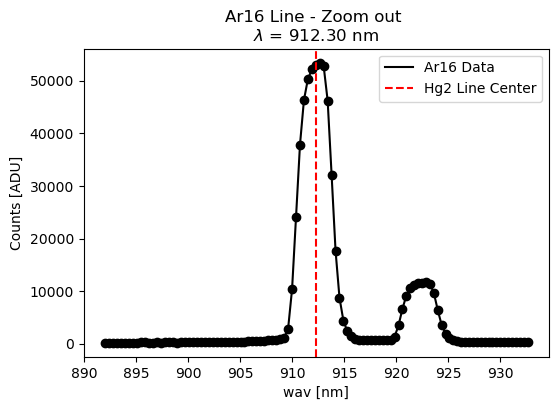

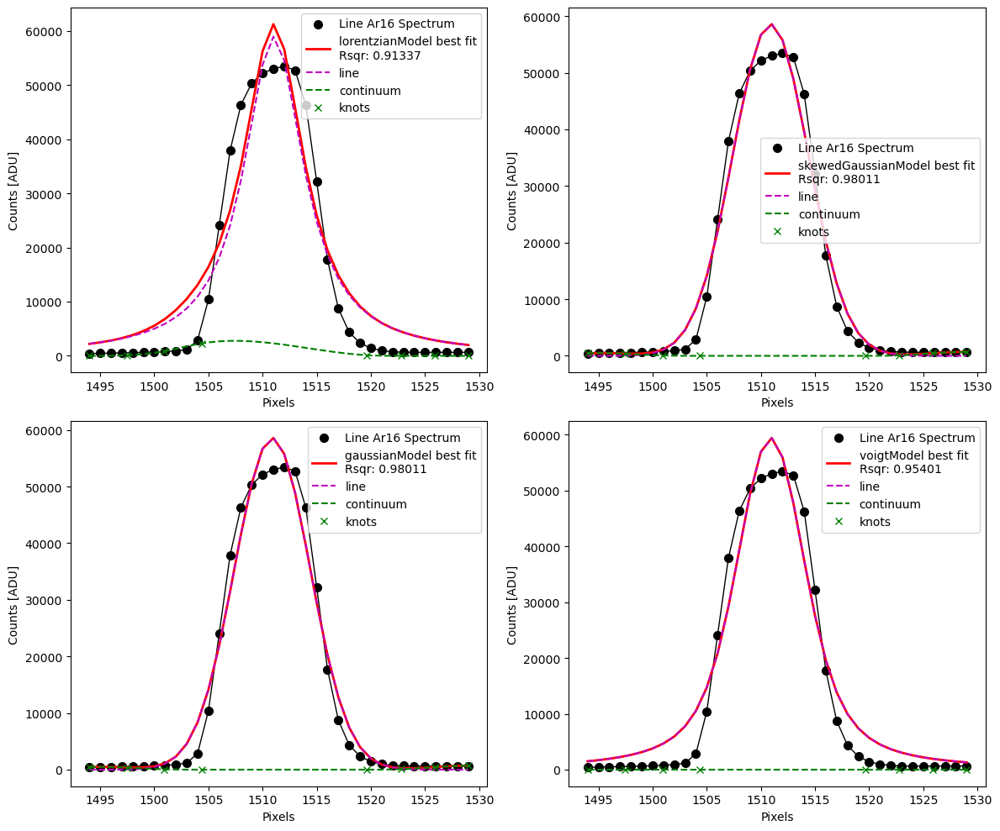

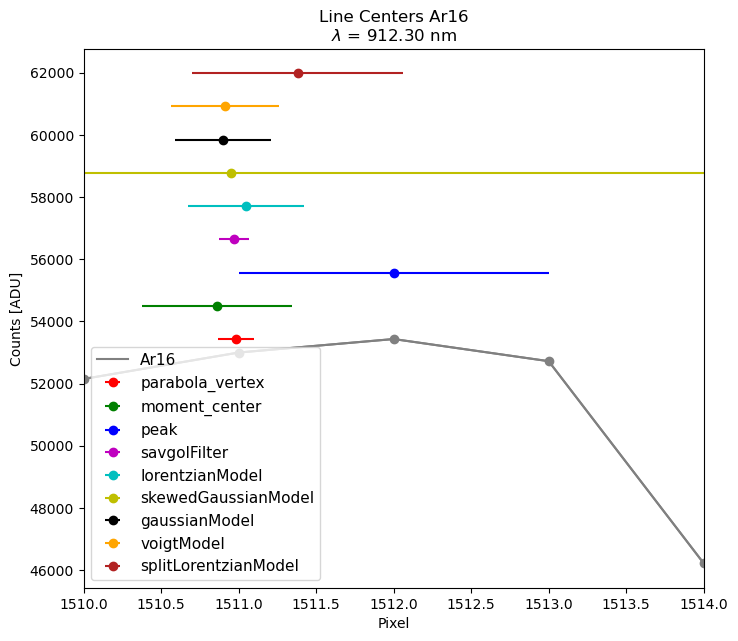

In [226]:
name = 'Ar16'
peak = 1512.0
exptime = 3

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.0, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar18

In [246]:
name = 'Ar17'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
22,102,935.422,1573.0,4589.0,9.0,1572.022059,1571.987667,1571.964473,1.0,0.196156,0.144585,0.597041,47487.698644,/Users/esteves/Downloads/spectrometer_local/ex...,-3016.977941,Ar17


Dark subtraction
Flat fielding
Saving results to .//results/Ar18.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar18    935.422      32   3814.748391  9.252388   
1  20250311T153442  Ar18    935.422      82  10159.042234  9.464890   
2  20250311T153442  Ar18    935.422     142  17289.701899  9.389845   
3  20250311T153442  Ar18    935.422     192  23201.491275  9.357082   
4  20250311T153442  Ar18    935.422     242  29118.650124  9.341319   
5  20250311T153442  Ar18    935.422     292  34831.769013  9.320488   
6  20250311T153442  Ar18    935.422      22   5555.787023  7.066197   
7  20250311T153442  Ar18    935.422      42  10643.148604  7.063698   
8  20250311T153442  Ar18    935.422     292  34831.769013  9.320488   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1571.864932  0.230951      NaN   1572.415382  ...            0.971964   
1     1572.048079  0.102000      NaN   1571.603255  ...            0.973445   
2     1572.047720  0.101421      NaN   1571.648420  ...            0.973319   
3     1572.049288  0.101314      NaN   1571.677807  ...            0.973108   
4     1572.050855  0.101070      NaN   1571.651336  ...            0.972977   
5     1572.050798  0.101197      NaN   1571.598640  ...            0.972806   
6     1054.134526  0.103847      NaN   1054.281721  ...            0.998411   
7     1054.137254  0.104894      NaN   1054.286878  ...            0.996884   
8     1572.050798  0.101197      NaN   1571.598640  ...            0.972806   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1571.920432  0.364316  0.971964  1571.970590  0.373527  0.964479   
1   1572.004056  0.413855  0.973445  1571.927828  0.398696  0.966547   
2   1571.998492  0.408192  0.973319  1571.923776  0.431743  0.966230   
3   1571.998672       NaN  0.973108  1571.924627  0.400208  0.965908   
4   1571.996782  0.406136  0.972977  1571.922596  0.414424  0.965646   
5   1571.990722  0.406618  0.972806  1571.916551       NaN  0.965201   
6   1054.112038  0.068705  0.996847  1054.077327  0.070565  0.996765   
7   1054.117728  0.068313  0.996884  1054.082029  0.070062  0.996809   
8   1571.990722  0.406618  0.972806  1571.916551      None  0.965201   

  splitLorentzianModel                      
                center     error  rsquared  
0          1572.142658  0.487860  0.948953  
1          1572.567718  0.482959  0.952064  
2          1572.454784  0.483249  0.950752  
3          1572.421861  0.485144  0.950018  
4          1572.362175  0.482383  0.949329  
5          1572.286519  0.461966  0.948275  
6          1053.699903  0.109766  0.997165  
7          1053.705672  0.108910  0.997213  
8          1572.286519  0.461966  0.948275  

[9 rows x 33 columns]

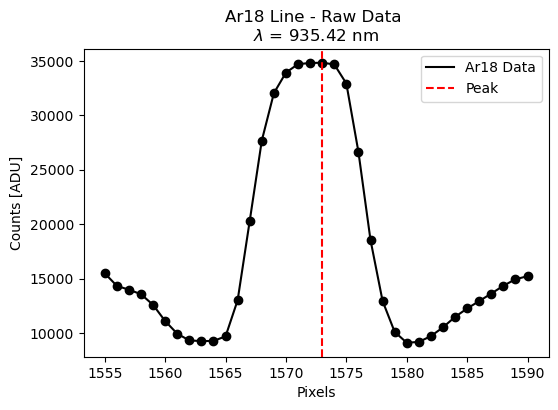

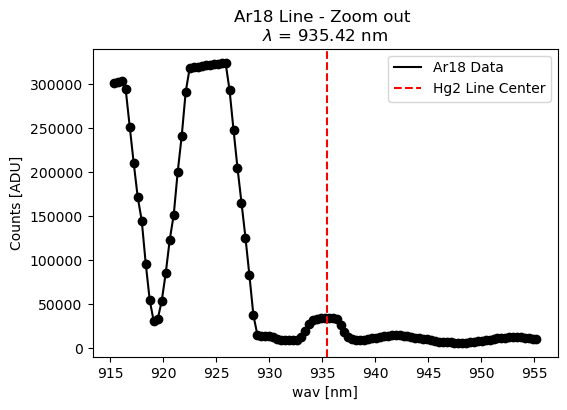

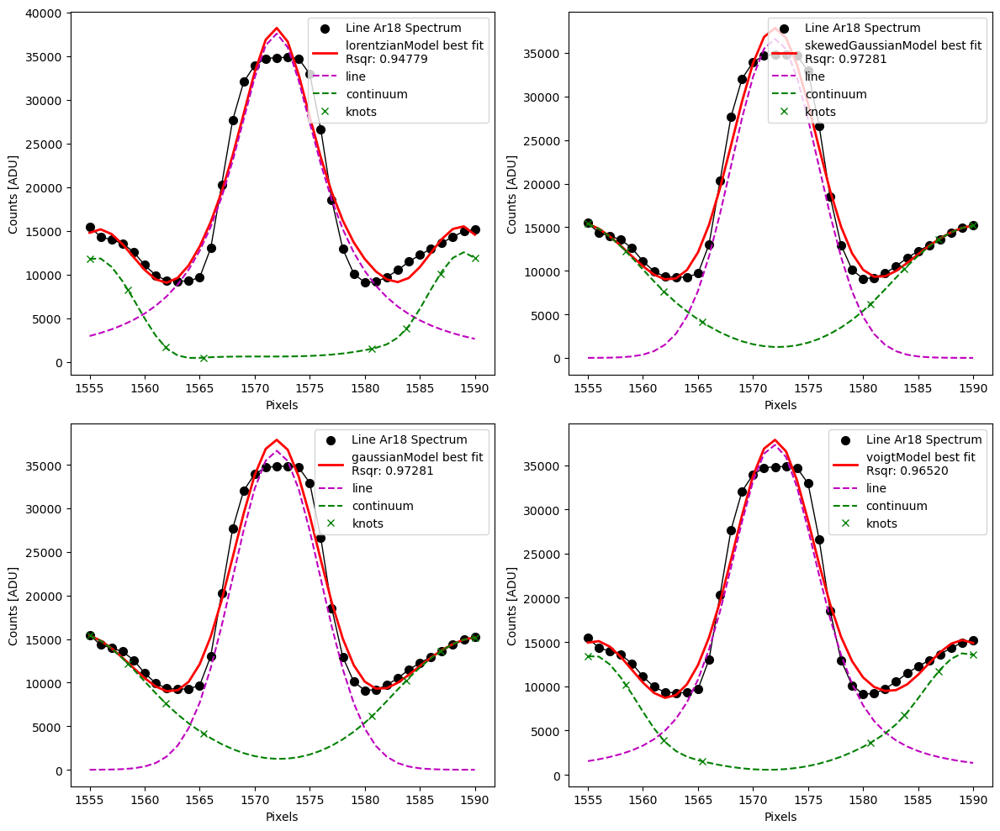

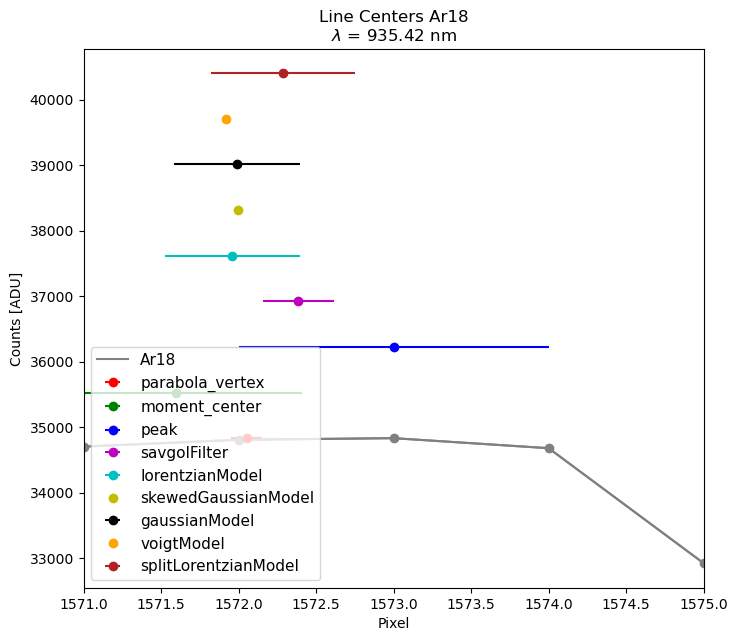

In [247]:
name = 'Ar18'
peak = 1573.0
exptime = 292

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.0, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar17

In [204]:
name = 'Ar17'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
21,3,922.4499,1539.0,4574.0,9.0,1537.512306,1537.590706,1537.585289,1.0,0.159316,0.142804,0.589081,67157.516133,/Users/esteves/Downloads/spectrometer_local/ex...,-3036.487694,Ar16


Dark subtraction
Flat fielding
Saving results to .//results/Ar17.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar17   922.4499       3  11669.850371  8.603585   
1  20250311T153442  Ar17   922.4499      32  63316.755147  8.563183   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1537.698513  0.144916      NaN   1537.634194  ...            0.979970   
1     1537.738804  0.138614      NaN   1537.660406  ...            0.980223   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1537.598546  0.365612  0.979970  1537.614753  0.362617  0.961035   
1   1537.642157  0.373332  0.980223  1537.653712  0.359484  0.959926   

  splitLorentzianModel                      
                center     error  rsquared  
0          1538.419449  0.648090  0.927548  
1          1538.449209  0.653955  0.925258  

[2 rows x 33 columns]

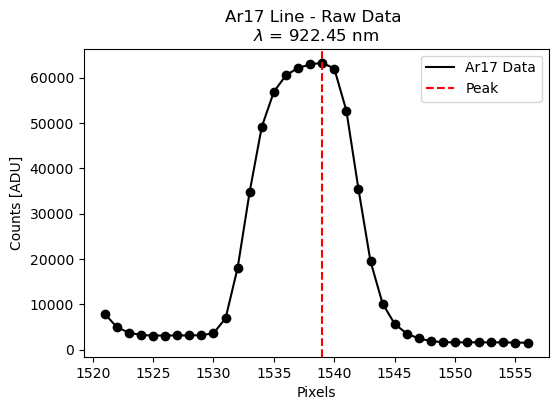

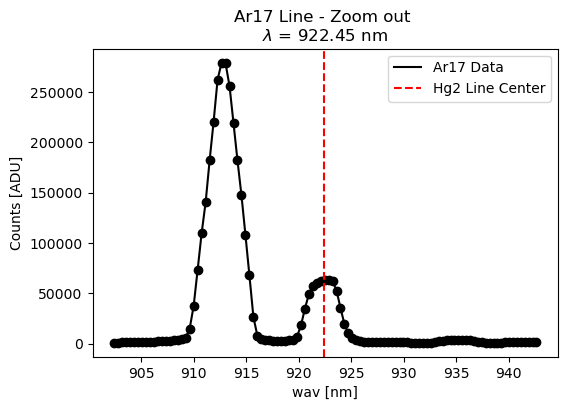

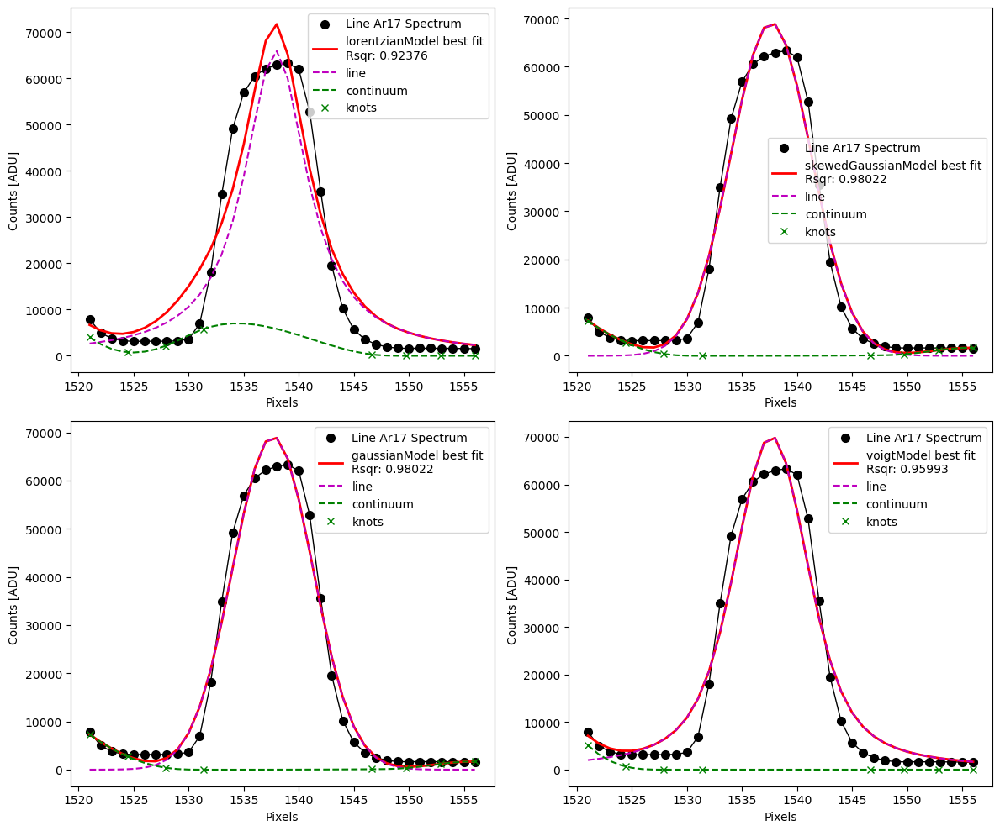

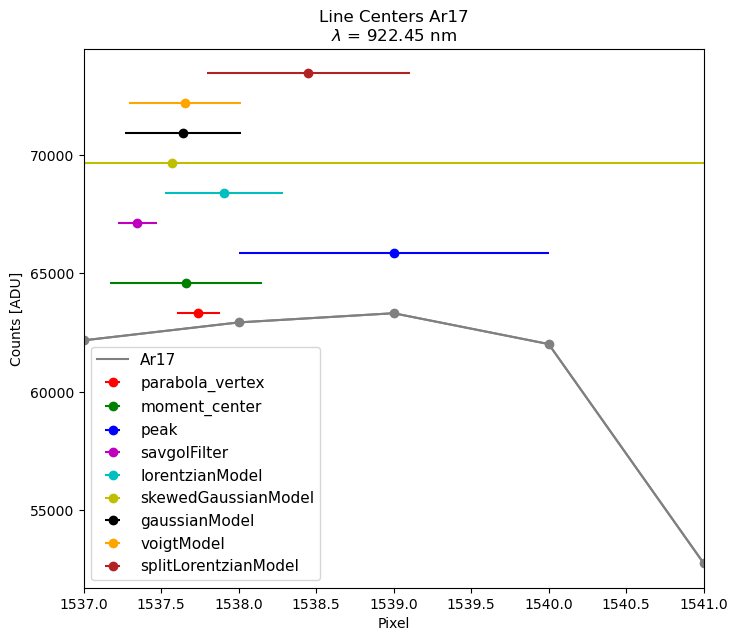

In [228]:
name = 'Ar17'
peak = 1539.0
exptime = 32

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.0, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar19

In [206]:
name = 'Ar19'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
23,6,965.7786,1653.0,4637.0,9.0,1653.976741,1654.07614,1654.09764,1.0,0.308901,0.15485,0.605359,84556.812319,/Users/esteves/Downloads/spectrometer_local/ex...,-2983.023259,Ar19


Dark subtraction
Flat fielding
Saving results to .//results/Ar19.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar19   965.7786       6  13925.355439  8.674656   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1654.018165  0.090174      NaN   1654.105684  ...            0.974155   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0    1654.11663  0.209176  0.974155  1654.118095  0.278627  0.948012   

  splitLorentzianModel                      
                center     error  rsquared  
0           1654.04017  0.712126  0.905459  

[1 rows x 33 columns]

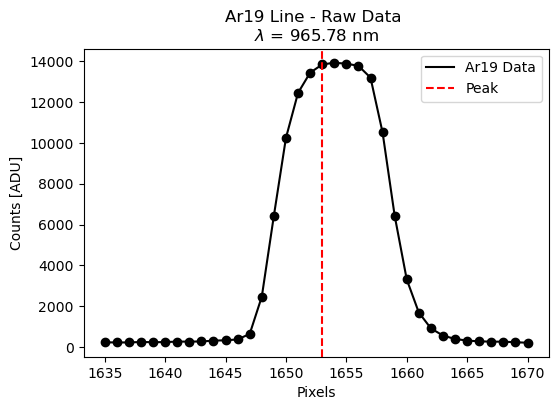

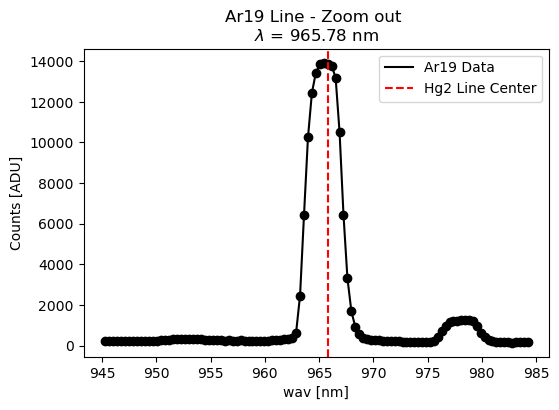

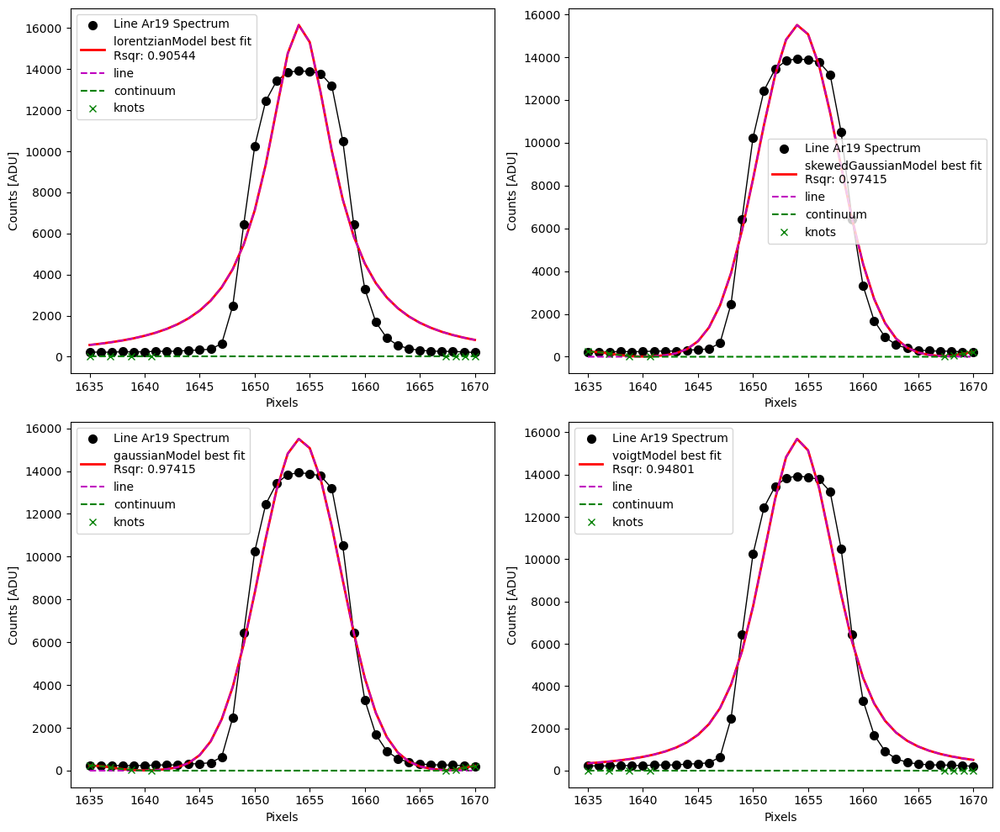

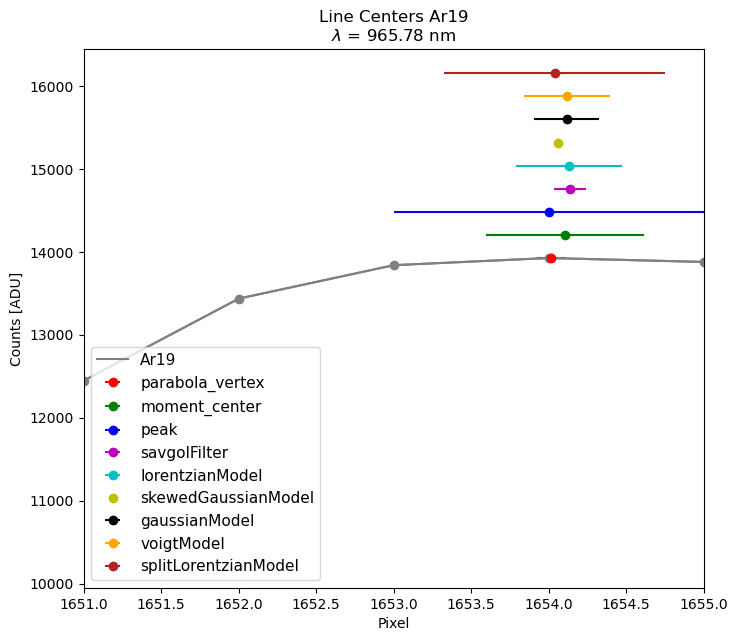

In [69]:
peak = 1653.0
exptime = 6

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=18)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=3.5, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

## Ar21

In [70]:
name = 'Ar21'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
25,192,1047.0,1885.0,5079.0,10.0,1883.676558,1883.882786,1883.897598,1.0,0.176181,0.152684,0.634601,81682.988486,/Users/esteves/Downloads/spectrometer_local/ex...,-3195.323442,Ar21


Dark subtraction
Flat fielding
Saving results to .//results/Ar21.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar21   1047.005     192  40524.570162  10.14483   

  parabola_vertex                   moment_center  ... skewedGaussianModel  \
           center    error rsquared        center  ...            rsquared   
0     1883.910479  0.07129      NaN   1883.891506  ...            0.980092   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1883.907169  0.354129  0.980092  1883.980935  0.375745  0.970168   

  splitLorentzianModel                      
                center     error  rsquared  
0          1883.677861  0.692685  0.940868  

[1 rows x 33 columns]

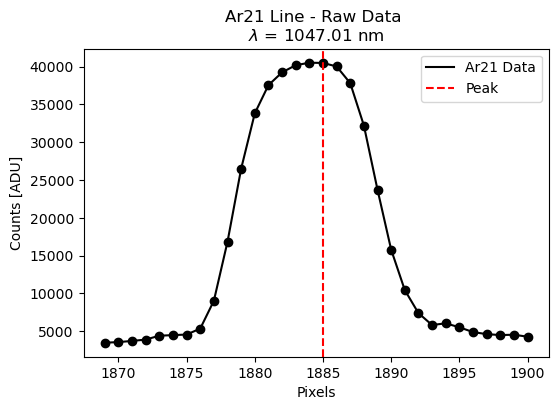

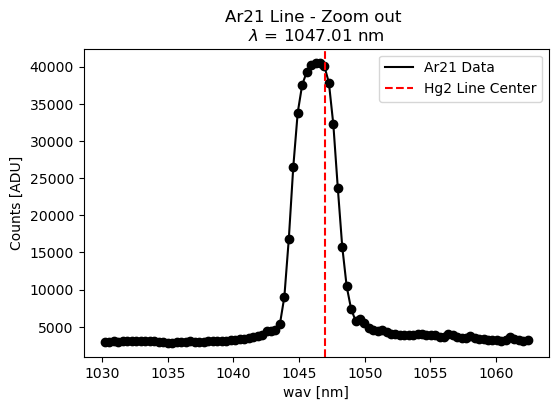

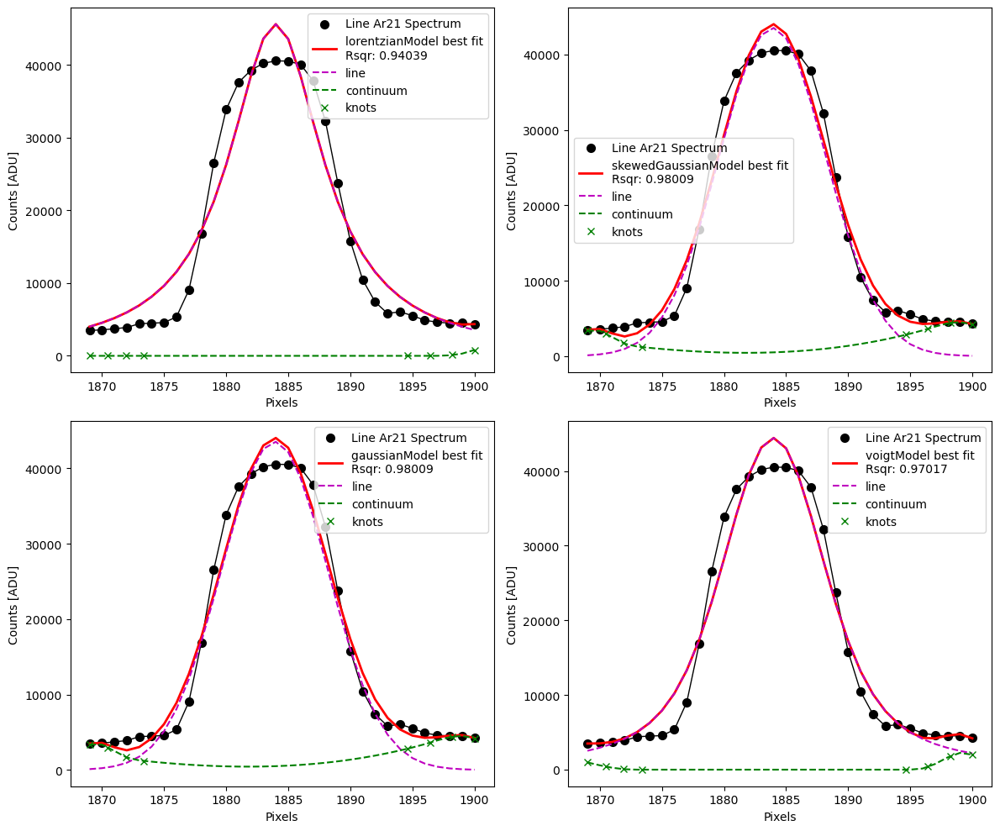

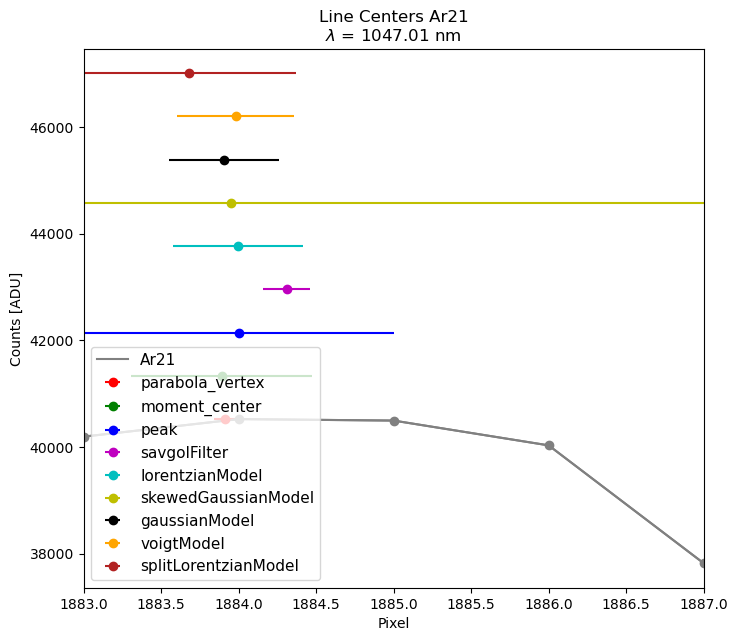

In [71]:
peak = 1885.0
exptime = 192

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=16)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

In [72]:
# !ls /Users/esteves/Downloads/spectrometer_local/exptime/

## Ar20

In [81]:
name = 'Ar20'
linesDf[linesDf.name==name]

,exptime,wavelength,peak,peak_height,peak_fwhm,parabola_vertex,gauss_mean,centroid,peak_unc,parabola_vertex_unc,gauss_mean_unc,centroid_unc,chisqr,fname,residual,name
24,82,978.451,1689.0,4978.0,9.0,1689.098286,1688.977944,1688.952567,1.0,0.127855,0.152816,0.598003,85995.494957,/Users/esteves/Downloads/spectrometer_local/ex...,-3288.901714,Ar20


Dark subtraction
Flat fielding
Saving results to .//results/Ar20.csv


/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:842: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


line_info                                                   \
         timestamp  name wavelength exptime   peak_height      fwhm   
0  20250311T153442  Ar20    978.451     242  49268.135544  9.289765   
1  20250311T153442  Ar20    978.451       2  21138.957140  8.389557   
2  20250311T153442  Ar20    978.451     242  49268.135544  9.289765   

  parabola_vertex                    moment_center  ... skewedGaussianModel  \
           center     error rsquared        center  ...            rsquared   
0     1688.910612  0.079256      NaN   1688.930978  ...             0.97687   
1     1254.439379  0.145046      NaN   1254.484078  ...             0.99039   
2     1688.910612  0.079256      NaN   1688.930978  ...             0.97687   

  gaussianModel                       voigtModel                      \
         center     error  rsquared       center     error  rsquared   
0   1689.010217  0.387924  0.976870  1688.995722  0.392121  0.964185   
1   1254.507579  0.184380  0.992805  1254.521927  0.526891  0.928920   
2   1689.010217  0.387924  0.976870  1688.995722  0.392121  0.964185   

  splitLorentzianModel                      
                center     error  rsquared  
0          1689.344321  0.727628  0.930891  
1          1254.483605  0.473446  0.956530  
2          1689.344321  0.727628  0.930891  

[3 rows x 33 columns]

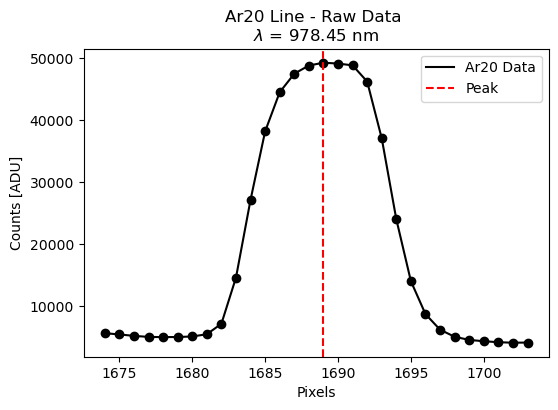

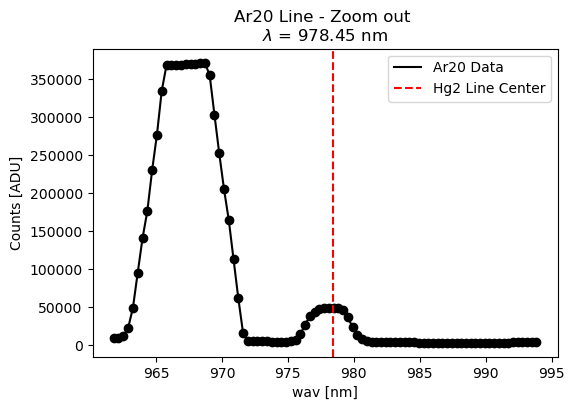

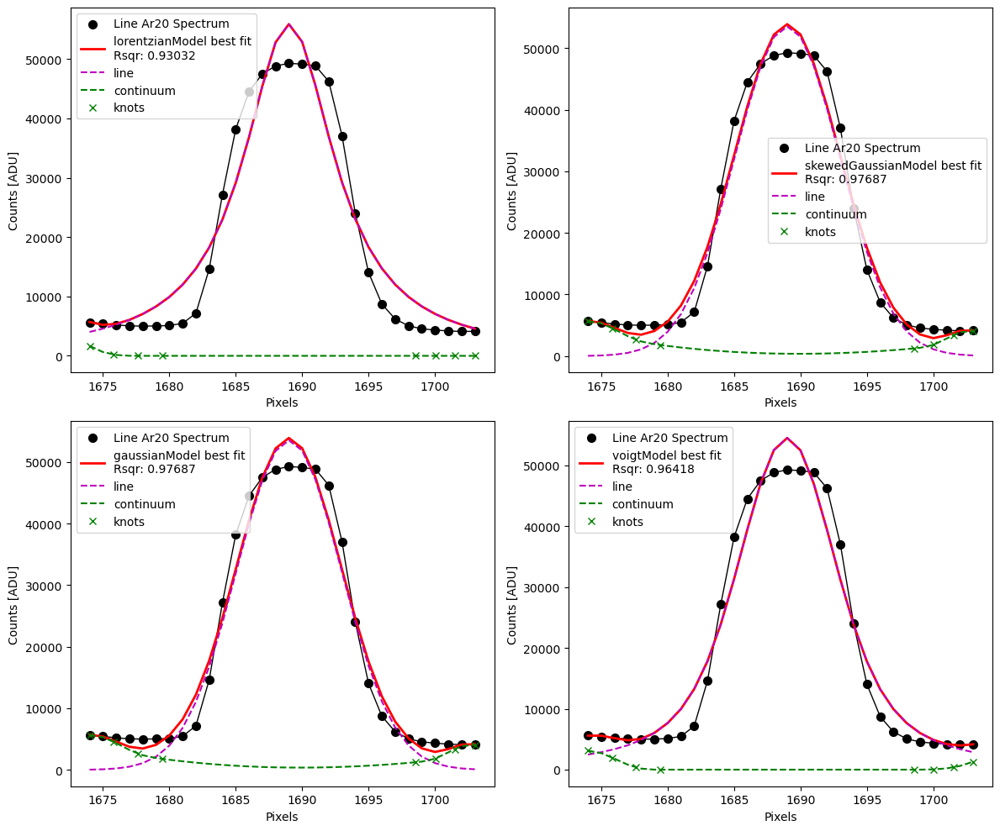

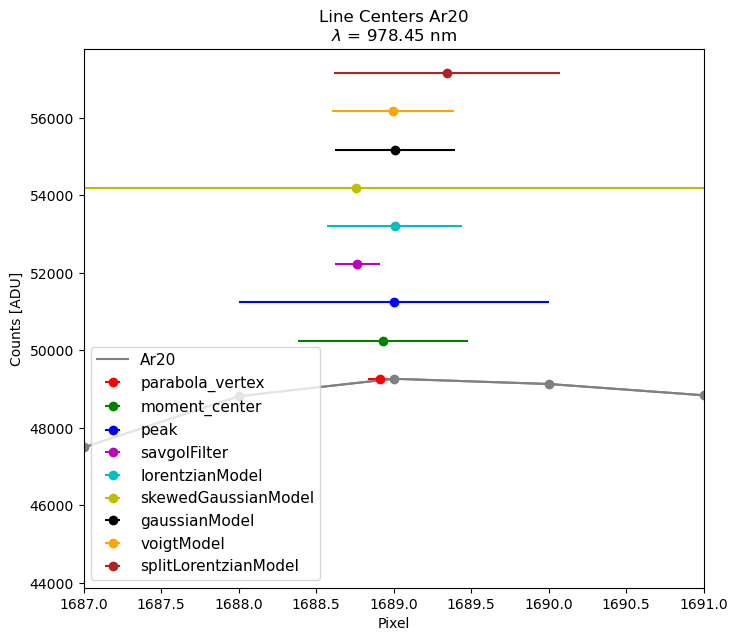

In [82]:
peak = 1689.0
exptime = 242

ar01 = Hg2LampLineCharacterization(name, peak, exptime, window=15)
fig1 = ar01.plot_raw_line()
fig2 = ar01.plot_zoom_out()
ar01.measure_centroids()
ar01.fit_models(nsigma=2.5, nknots=4)
fig3 = ar01.compare_models()
fig4 = ar01.plot_line_centers(window=2)
ar01.save_results()

In [75]:
# import requests
# import pandas as pd
# from bs4 import BeautifulSoup

# def query_nist(element, wavelength_min, wavelength_max):
#     url = "https://physics.nist.gov/cgi-bin/ASD/lines1.pl"
#     params = {
#         'spectra': element,
#         'low_wl': wavelength_min,
#         'upp_wl': wavelength_max,
#         'unit': 1,  # Wavelength in nm
#         'en_unit': 1,  # Energy in cm^-1
#         'output': 0,  # HTML output
#         'line_out': 0,  # Wavelength, observed wavelength, Ritz wavelength, rel. intensity, etc.
#         'format': 3,  # ASCII output
#         'order_out': 0,  # Default ordering
#         'submit': 'Retrieve Data'
#     }
    
#     response = requests.get(url, params=params)
#     response.raise_for_status()
    
#     return response.text

# def parse_nist_output(text):
#     lines = text.split('\n')
#     data = []
#     for line in lines:
#         if not line.strip():  # Skip empty and header lines
#             continue
#         fields = line.split('|')
#         if len(fields) < 6:
#             continue
#         try:
#             wavelength = float(fields[0].strip())
#             intensity = fields[3].strip()
#             data.append([wavelength, intensity])
#         except ValueError:
#             continue
    
#     return pd.DataFrame(data, columns=['Wavelength (nm)', 'Relative Intensity'])

# def main():
#     # print("Querying NIST for Hg2 lines (200-600 nm)...")
#     # hg2_data = query_nist('Hg II', 200, 600)
#     # hg2_df = parse_nist_output(hg2_data)
    
#     print("Querying NIST for Ar lines (600-1200 nm)...")
#     ar_data = query_nist('Ar I', 600, 1200)
#     ar_df = parse_nist_output(ar_data)
    
#     print("Displaying Hg2 spectral lines:")
#     print(hg2_df)
    
#     print("Displaying Ar spectral lines:")
#     print(ar_df)
    
#     hg2_df.to_csv("Hg2_lines.csv", index=False)
#     ar_df.to_csv("Ar_lines.csv", index=False)
    
# if __name__ == "__main__":
#     main()

In [76]:
df_hg2

NameError: name 'df_hg2' is not defined